In [2]:
import matplotlib.pyplot as plt
import matplotlib as mplb
import pickle
import pandas as pd
import IPython.display
import pyrosetta as prs
import math
import numpy as np
prs.init(extra_options='-mute core -mute basic -mute protocols')


PyRosetta-4 2022 [Rosetta PyRosetta4.conda.linux.cxx11thread.serialization.CentOS.python38.Release 2022.14+release.d95c9420af12eca758935f7e2b4d05be19e3a5fe 2022-04-07T08:56:27] retrieved from: http://www.pyrosetta.org
(C) Copyright Rosetta Commons Member Institutions. Created in JHU by Sergey Lyskov and PyRosetta Team.


In [3]:
# PLOTTING PARAMS
plt.rcParams['savefig.bbox'] = 'tight'
plt.rcParams['figure.figsize'] = [20, 10]
#plt.rcParams['font.size'] = 18

SMALL_SIZE = 23
MEDIUM_SIZE = 25
BIGGER_SIZE = 30


pd.options.plotting.backend = "matplotlib"
plt.style.use('seaborn')
plt.rc('font', size=SMALL_SIZE)          # controls default text sizes
plt.rc('axes', labelsize=MEDIUM_SIZE, titlesize=BIGGER_SIZE)    # fontsize of the x and y labels
plt.rc('xtick', labelsize=SMALL_SIZE)    # fontsize of the tick labels
plt.rc('ytick', labelsize=SMALL_SIZE)    # fontsize of the tick labels
plt.rc('legend', fontsize=SMALL_SIZE)    # legend fontsize
plt.rc('figure', titlesize=BIGGER_SIZE)  # fontsize of the figure title


In [4]:
# CONSTS
relax_init_fa_reps = [0.040, 0.051, 0.265, 0.280, 0.559, 0.581, 1]
fa_reps = ['fa_rep_0', 'fa_rep_1', 'fa_rep_2', 'fa_rep_3', 'fa_rep_4', 'fa_rep_5', 'fa_rep_6']
metrics = ['rmsd', 'torsions', 'score', 'ref15']
benchmark_prots=['6q21A', '1lfaA', '1d5wA', '1f4vA', '1k9kA', '3s0bA', '3zjaA']
IMG_PATH="../../Documents/master_thesis/imgs/"
res_path="../results/latest/"
bench_dict = {
    "3s0b_A": "3s0a_A",
    "1k9k_A": "1k9p_A",
    "1f4v_A": "3chy_A",
    "3zja_A": "3zk0_A",
    "1d5w_A": "1dbw_A"
}
# Pymol Colors
from pyrosetta.rosetta.protocols.moves import X11Colors
rmsd_color = X11Colors(67) # MidnightBlue
torsion_color = X11Colors(60) # MediumOrchid
rscore_color = X11Colors(50) # LightSeaGreen
baseline_color = X11Colors(115) # Gold
target_color = X11Colors(46) # LightGreen
starting_color = X11Colors(18) # DarkSalmon
score_color = X11Colors(65) # MediumTurqouise
dummy_color = X11Colors(11) # DarkGrey
# Matplolib Colors
plt_rmsd_color = "#191970"
plt_torsion_color = "#BA55D3"
plt_rscore_color= "#20B2AA"
plt_baseline_color= "#FFD700"
plt_starting_color= "#E9967A"
plt_score_color= "#48D1CC"
plt_dummy_color="#A9A9A9"
plt_target_color="#90EE90"

rs_color = 'red'
rf_color = 'green'
gp_color = 'blue'
fr_color = 'orange'

In [143]:
for i in range(140):
    print(i, prs.rosetta.protocols.moves.X11Colors(i))

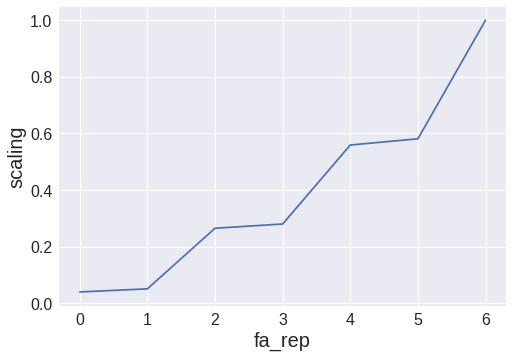

In [61]:
plt.plot(range(7), relax_init_fa_reps)
plt.xticks(range(7))
plt.ylabel('scaling', fontsize=20)
plt.xlabel('fa_rep', fontsize=20)
plt.savefig(IMG_PATH+'DEFAULT_FA_REPS.png', dpi=300)

# Functions

In [5]:
## FUNCS
def from_txt(path):
    results = []
    with open(path, 'r') as h:
        lines = h.readlines()
        for line in lines:
            if line.startswith('[{'):
                run_results = parse_res(line)
                results.extend(run_results)
                #break
    return pd.DataFrame(results).astype('float')


def parse_res(line):
    line = line[1:-1]
    #print(line)
    rlist = [l+'}' for l in line.split('},')]
    res = []
    for r in rlist:
        splits = r.split(',')
        run = splits[0].strip().split(' ')[1]
        ca = splits[2].strip().split(' ')[1]
        ref = splits[10].strip().split(' ')[1]
        res.append({'run':run, 'ca_rmsd':ca, 'ref15':ref})
    return res

def get_phi_psi(pose):
    phis = []
    psis = []
    for residx in range(1, pose.size()+1):
        phis.append(pose.phi(residx))
        psis.append(pose.psi(residx))
    return (pd.Series(phis), pd.Series(psis))

def make_fa_reps(df):
    weights = df.config.apply(lambda x: pd.Series(x))
    weights.columns = ["fa_rep_" + str(num) for num in range(7)]
    results = pd.concat([df, weights], axis=1)
    return results

def get(prot_path, mg=False):
    with open(prot_path, 'rb') as h:
        res=pickle.load(h)
    if mg:
        res = res.groupby('run').mean()
    return res

def packed_to_pose(ppose) -> prs.rosetta.core.pose.Pose:
    from pyrosetta.distributed.packed_pose.core import to_pose 
    return to_pose(ppose)

def send_pose(pose, name, color=None):
    pmv.set_PyMOL_model_name(name)
    pmv.apply(pose)
    if color:
        pmv.send_colors(pose, colors=prs.rosetta.std.map_int_int(), default_color=color)


def make_phi_psi_dev(baseline, colname):
    baseline[colname] = pd.Series([None for i in range(len(baseline))])
    for idx in range(len(baseline)):
        baseline.loc[idx,(colname)] = (abs(abs(baseline.pose_phi_psi.iloc[idx].phi) - abs(baseline.target_phi_psi.iloc[idx].phi)) + abs(abs(baseline.pose_phi_psi.iloc[idx].psi) - abs(baseline.target_phi_psi.iloc[idx].psi))).mean()
    baseline[colname] = baseline[colname].astype(float)
    #baseline.rename(columns={"phi_psi_deviation": "torsions"}, inplace=True)

def recalc_phi_psi_old(df):
    for idx, row in df.iterrows():
        df.loc[idx, "psi_deviation"] = calc_mean_distance(row.pose_phi_psi.psi.values, row.target_phi_psi.psi.values)
        df.loc[idx, "phi_deviation"] = calc_mean_distance(row.pose_phi_psi.phi.values, row.target_phi_psi.phi.values)
        df.loc[idx, "torsions"] = df.loc[idx, "psi_deviation"]+df.loc[idx, "phi_deviation"]

def recalc_phi_psi(df):
    for idx, row in df.iterrows():
        df.loc[idx, "phi_deviation"] = calc_mean_distance(row.pose_phi, row.target_phi)
        df.loc[idx, "psi_deviation"] = calc_mean_distance(row.pose_psi, row.target_psi)
        df.loc[idx, "torsions"] = df.loc[idx, "psi_deviation"]+df.loc[idx, "phi_deviation"]
        
def calc_distance(alpha, beta):
    phi = abs(beta-alpha)%360
    if phi>180:
        return 360-phi
    else:
        return phi
    
def calc_mean_distance(s1, s2):
    summ = 0
    for idx in range(len(s1)):
        summ += calc_distance(s1[idx], s2[idx])
    return summ/len(s1)

def calc_torsion_rmsd(s1, s2, begin=None, end=None):
    # if not equal lenght then stop, we dont know where missing residues is
    # TODO: implement proper error handling later
    s1phi, s1psi = get_phi_psi(s1)
    s2phi, s2psi = get_phi_psi(s2)

    resnums = len(s1.residues)
    phi_summ = 0
    psi_summ = 0
    if begin is None:
        begin = 0
    if end is None:
        end = resnums
    for idx in range(begin, end):
        phi_deviation = calc_distance(s1phi[idx], s2phi[idx])
        psi_deviation = calc_distance(s1psi[idx], s2psi[idx])
        phi_summ += phi_deviation**2
        psi_summ += psi_deviation**2

    return math.sqrt((phi_summ+psi_summ)/(end-begin))

def calc_score(df, start_pose, target_pose):
    # TODO: error handling
    phi_norm = calc_mean_distance(get_phi(start_pose), get_phi(target_pose))
    psi_norm = calc_mean_distance(get_psi(start_pose), get_psi(target_pose))
    df.loc[:,'score'] = df.apply(lambda x: x.phi_deviation/phi_norm + x.psi_deviation/psi_norm + x.rmsd/initial_rmsd, axis=1)

    
def get_phi(pose):
    phi_angles = []
    for residx in range(1, pose.size()+1):
        phi = pose.phi(residx)
        phi_angles.append(phi)
    return phi_angles

def get_psi(pose):
    psi_angles = []
    for residx in range(1, pose.size()+1):
        psi = pose.psi(residx)
        psi_angles.append(psi)
    return psi_angles

def get_phi_psi(pose):        
    return(get_phi(pose), get_psi(pose))

def make_no_pose(path, identify):
    import os
    for r in os.listdir(path):
        if r.endswith(identify):
            print(r)
            df = get(path+r)
            df = df.drop(labels=['pose'], axis=1)
            with open(path+r.split('.')[0]+'_no_pose.pkl', 'wb') as h:
                pickle.dump(df, h)

def make_convergence(data, loss='ca_rmsd'):
    s = 1000000
    res = []
    if isinstance(data, pd.DataFrame):
        for idx, row in data.iterrows():
            if s > row[loss]:
                s = row[loss]
            res.append(s)
        return res  
        

def load_raw_pdb(prot):
    return prs.pose_from_pdb('../benchmark/allosteric/'+prot+'.pdb')


#batch load
def load_res_for_prot(prot):
    of_rmsd = get(res_path+'long_starting_relaxed/optimize_'+prot+'_rmsd_RF_res_600no_pose.pkl')
    of_rmsd.name = 'C-alpha_loss'
    of_score = get(res_path+'long_starting_relaxed/optimize_'+prot+'_score_RF_res_600no_pose.pkl')
    of_score.name = 'combined_loss'
    of_dummy = get(res_path+'random_search/random_search_'+prot+'_dummy_res_600no_pose.pkl')
    of_dummy.name = 'random_search'
    of_torsions = get(res_path+'long_starting_relaxed/optimize_'+prot+'_torsions_RF_res_600no_pose.pkl')
    of_torsions.name = 'torsions_loss'
    baseline = get(res_path+'baseline/FRB_'+prot+'_RF_res_64no_pose.pkl')
    baseline.name= 'FastRelax'
    starting_pose = prs.pose_from_pdb('../benchmark/allosteric/pre_processed/'+prot+'.pdb')
    target_pose = prs.pose_from_pdb("../benchmark/allosteric/pre_processed/"+bench_dict[prot]+'.pdb')
    initial_rmsd = prs.rosetta.core.scoring.CA_rmsd(starting_pose, target_pose)
    initial_torsions = calc_mean_distance(get_phi(starting_pose), get_phi(target_pose)) + calc_mean_distance(get_psi(starting_pose), get_psi(target_pose))
    initial_reu = prs.get_fa_scorefxn()(starting_pose)/len(starting_pose.residues)
    
    return of_rmsd, of_score, of_dummy, of_torsions, baseline, initial_rmsd, initial_torsions, initial_reu

# Load Results

### Starting and Target Pose

In [333]:
import pickle 
import os
for prot in os.listdir("../results/latest/"):
    if prot.endswith("GP.pkl"):
        with open("/home/iwe7/scfxn_optimize/results/latest/"+prot, 'rb') as h:
            res = pickle.load(h)
            print('process ', prot)
            res.drop(columns='pose', inplace=True)
            with open('../results/latest/'+prot[:-4]+'no_pose.pkl', 'wb') as h:
                pickle.dump(res, h)

In [ ]:
for prot in os.listdir("../benchmark/allosteric/minimized"):
    if prot.endswith(".pdb"):
        mpose = prs.pose_from_pdb("../benchmark/allosteric/minimized/"+prot)
        cpose = prs.pose_from_pdb("../benchmark/allosteric/cleaned/"+prot[:6]+".pdb")
        print(prot, "cleanedPose:", scfxn(cpose)/len(cpose.residues), "minimizedPose: ", scfxn(mpose)/len(mpose.residues))

3zk0_A_0001.pdb cleanedPose: -1.0950649575378444 minimizedPose:  -3.244341578001254
3s0a_A_0001.pdb cleanedPose: -1.5572172745799067 minimizedPose:  -3.2835327727826833
3zja_A_0001.pdb cleanedPose: -1.1358446895878362 minimizedPose:  -3.19936106200243
1f4v_A_0001.pdb cleanedPose: -0.36909934901560126 minimizedPose:  -3.352630014919178
1k9p_A_0001.pdb cleanedPose: -0.776141859482261 minimizedPose:  -3.1001256383127536
3chy_A_0001.pdb cleanedPose: -1.6401787775591858 minimizedPose:  -3.7214932724300542
3s0b_A_0001.pdb cleanedPose: -0.5395985196410876 minimizedPose:  -3.267095469403039
1d5w_A_0001.pdb cleanedPose: 0.06235611899911679 minimizedPose:  -3.3888145310618625
1k9k_A_0001.pdb cleanedPose: -0.5947297265593057 minimizedPose:  -2.8173823504227373
1dbw_A_0001.pdb cleanedPose: 0.09838108829044172 minimizedPose:  -3.1319895001645284


In [ ]:
for prot in bench_dict.keys():
    name=prot[:-2]
    with open("/home/iwe7/scfxn_optimize/results/latest/cycles/optimize_cyclic_7_"+prot+"_GP.pkl", "rb") as h:
        print('check 1')
        res = pickle.load(h)
        print('check 2 ' + name)
        for idx, pose in res.pose.iteritems():
            print('iter ' +str(idx))
            packed_to_pose(pose).dump_pdb("/home/iwe7/scfxn_optimize/results/poses/cyclic_7_GP/"+name+"/"+str(idx))
            print('sucess ')

In [5]:
prot = '1k9k_A'
with open("/home/iwe7/scfxn_optimize/results/latest/cycles/optimize_cyclic_7_"+prot+"_GP.pkl", "rb") as h:
        print('check 1')
        res = pickle.load(h)
        p = res.pose.iloc[0]
        print(p)
#        print(pose)
        #pose.dump_pdb('/home/iwe7/scfxn_optimize/results/poses/cyclic_7_GP/1k9k/tesd.pdb')

check 1


In [ ]:
packed_to_pose(p)

In [32]:
for prot in bench_dict.keys():
    #print(prot.upper())
    
    
    initial_rmsd = prs.rosetta.core.scoring.CA_rmsd(starting_pose, target_pose)
    initial_torsions = calc_torsion_rmsd(starting_pose, target_pose)
    initial_reu_start = prs.get_fa_scorefxn()(starting_pose)/len(starting_pose.residues)
    init_reu_target = prs.get_fa_scorefxn()(target_pose)/len(target_pose.residues)
    print("Prot: {} to {} \n LEN: {} \n RMSD: {:.2f} \n Torsion: {:.2f} \n boundREU: {:.2f} \n apoREU: {:.2f}".format(prot, bench_dict[prot], len(target_pose.residues), initial_rmsd, initial_torsions, initial_reu_start, init_reu_target))

Prot: 3s0b_A to 3s0a_A 
 LEN: 119 
 RMSD: 0.70 
 Torsion: 15.29 
 boundREU: -3.27 
 apoREU: -3.28
Prot: 1k9k_A to 1k9p_A 
 LEN: 89 
 RMSD: 4.46 
 Torsion: 50.37 
 boundREU: -2.82 
 apoREU: -3.10
Prot: 1f4v_A to 3chy_A 
 LEN: 128 
 RMSD: 1.23 
 Torsion: 28.39 
 boundREU: -3.35 
 apoREU: -3.72
Prot: 3zja_A to 3zk0_A 
 LEN: 114 
 RMSD: 0.46 
 Torsion: 12.02 
 boundREU: -3.20 
 apoREU: -3.24
Prot: 1d5w_A to 1dbw_A 
 LEN: 123 
 RMSD: 1.25 
 Torsion: 46.02 
 boundREU: -3.39 
 apoREU: -3.13


# PyMol

['3s0b_A_bound', '3s0a_A_apo']


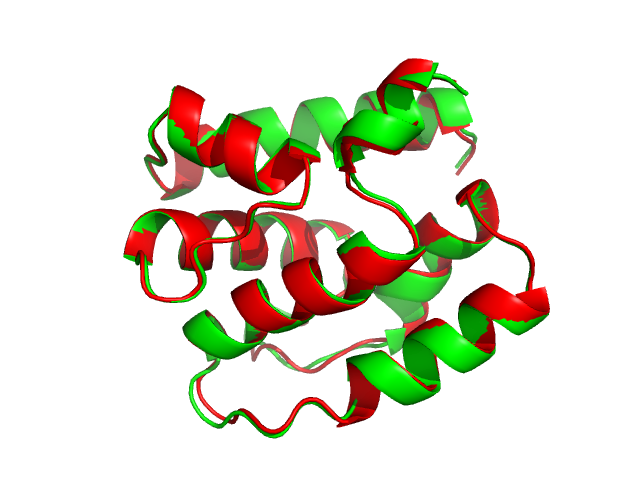

['1k9k_A_bound', '1k9p_A_apo']


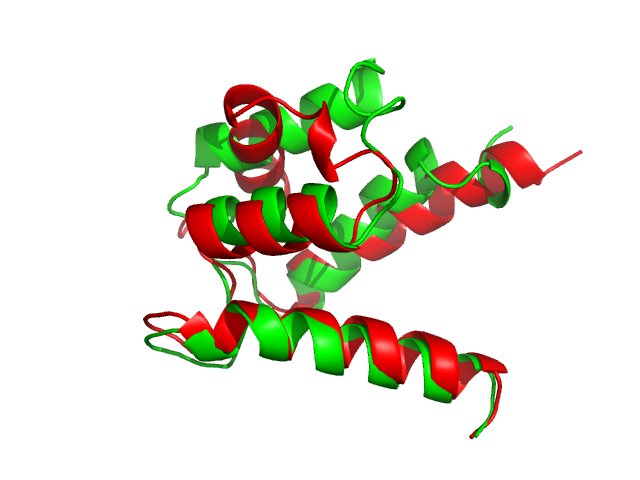

['1f4v_A_bound', '3chy_A_apo']


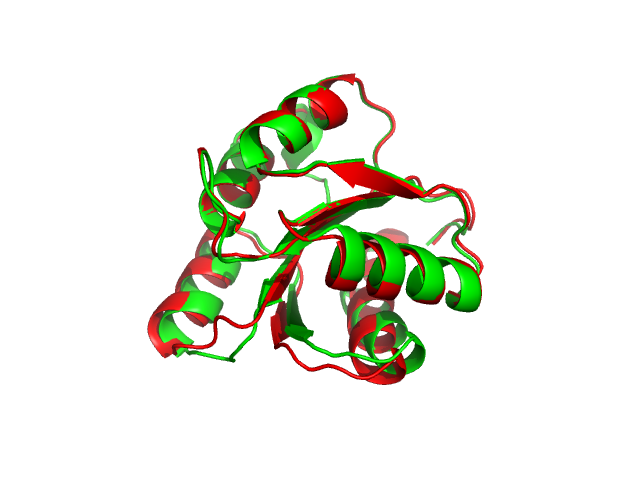

['3zja_A_bound', '3zk0_A_apo']


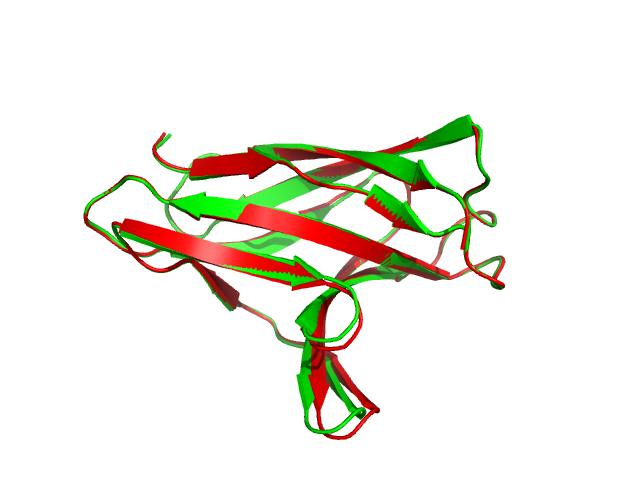

['1d5w_A_bound', '1dbw_A_apo']


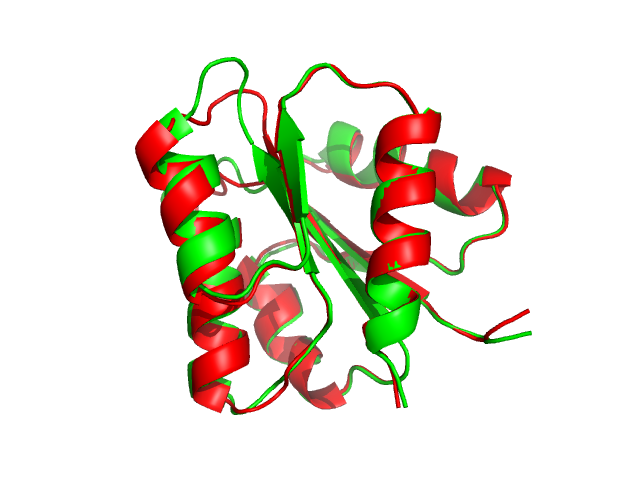

In [205]:
## make starting Struct PyMOL pngs
import pymol
pymol.finish_launching()

### Baseline best Pose per metric, starting & target

['3s0b_A_bound', '3s0a_A_apo']


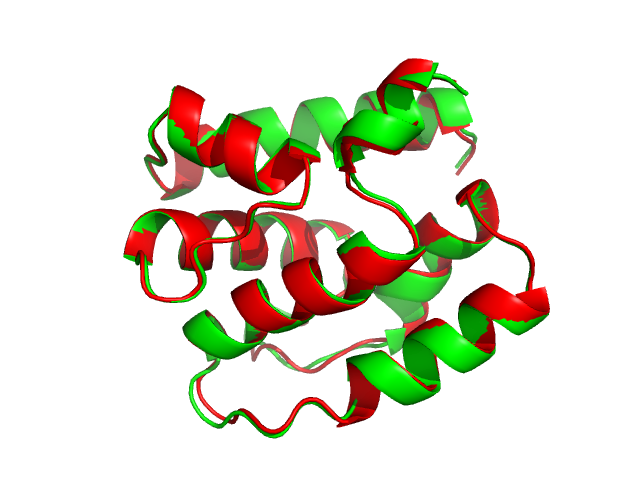

['1k9k_A_bound', '1k9p_A_apo']


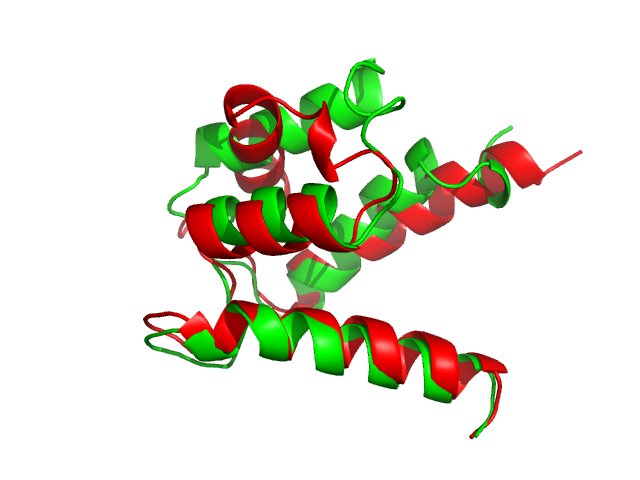

['1f4v_A_bound', '3chy_A_apo']


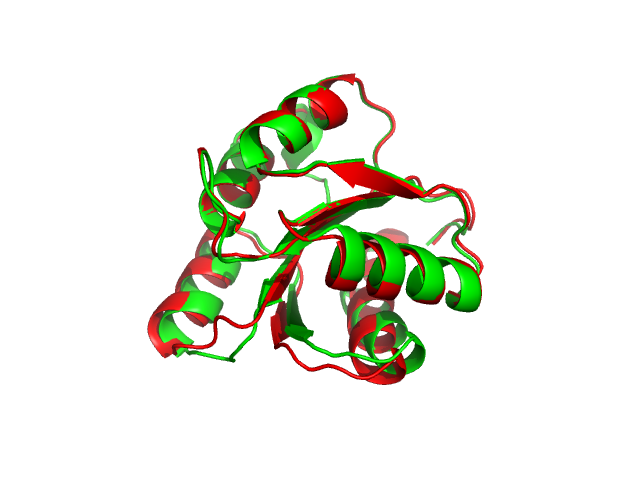

['3zja_A_bound', '3zk0_A_apo']


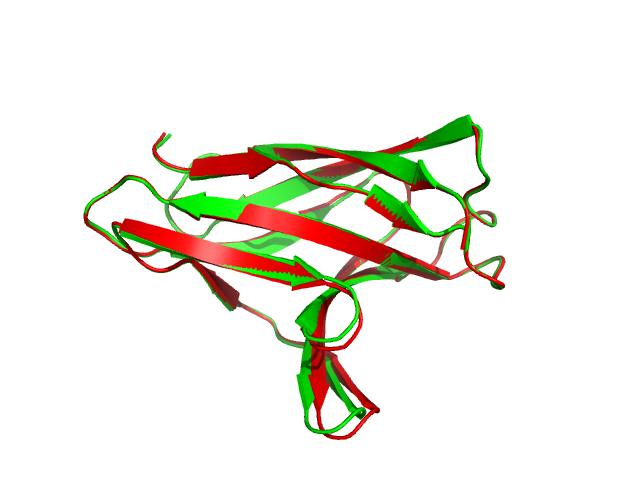

['1d5w_A_bound', '1dbw_A_apo']


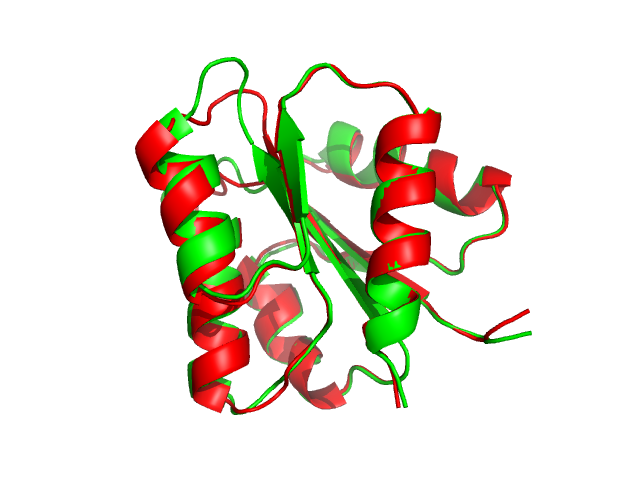

In [225]:
## make starting Struct PyMOL pngs
import pymol
pymol.finish_launching(['pymol', '-xiq'])
for prot in bench_dict.keys():
    pymol.cmd.delete('all') # start clean
    pymol.cmd.load('../benchmark/allosteric/pre_processed/'+prot+'.pdb', object=prot+"_bound")
    pymol.cmd.color("red", prot+"_bound" )
    pymol.cmd.load("../benchmark/allosteric/pre_processed/"+bench_dict[prot]+".pdb", object=bench_dict[prot]+"_apo")
    pymol.cmd.color("green", bench_dict[prot]+"_apo")
    #send_pose(target_pose, "target_"+bench_dict[prot], target_color)
    #send_pose(starting_pose, 'starting_'+prot, starting_color)
    structs = pymol.cmd.get_names()
    print(structs)
    #pymol.cmd.disable("all")
    #pymol.cmd.enable("starting_"+prot)
    #pymol.cmd.enable("target_"+ub_dict[prot])
    pymol.cmd.align(prot+"_bound"+" & name ca", bench_dict[prot]+"_apo"+" & name ca")
    pymol.cmd.orient()
    pymol.cmd.png(IMG_PATH+"PYMOL"+prot+"_to_"+bench_dict[prot]+".png", dpi=300)
    display(cmd.ipython_image())

In [184]:
send_pose(packed_to_pose(baseline.nsmallest(1, 'rmsd').pose.iloc[0]), 'baseline_rmsd_'+prot, baseline_color)
send_pose(packed_to_pose(baseline.nsmallest(1, 'torsions').pose.iloc[0]), 'baseline_torsion_'+prot, baseline_color)
send_pose(packed_to_pose(baseline.nsmallest(1, 'ref15').pose.iloc[0]), 'baseline_reu_'+prot, baseline_color)
send_pose(packed_to_pose(baseline.nsmallest(1, 'score').pose.iloc[0]), 'baseline_score_'+prot, baseline_color)

In [193]:
send_pose(target_pose, "target_"+ub_dict[prot], target_color)
send_pose(starting_pose, 'starting_'+prot, starting_color)

In [87]:
pymol.cmd.disable("all")
pymol.cmd.enable("group_"+loss+"_"+prot)
pymol.cmd.enable("target_"+prot)
pymol.cmd.enable("starting_"+prot)
pymolol.cmd.png(IMG_PATH+"rmsd_group_"+prot+".png", dpi=300)

### RMSD

In [13]:
pmv.keep_history(True)
grouped = of_rmsd.groupby('run')
loss="rmsd"
for pose in grouped.get_group(grouped.mean().nsmallest(1, "rmsd").index[0]).pose:
    send_pose(packed_to_pose(pose), "group_rmsd_" + prot, rmsd_color)


In [87]:
pmv.keep_history(False)
send_pose(packed_to_pose(baseline.nsmallest(1, 'rmsd').pose.iloc[0]), 'baseline_rmsd_'+prot, baseline_color)
name = "min_rmsd_"+prot
send_pose(packed_to_pose(of_rmsd.nsmallest(1, 'rmsd').pose.iloc[0]), name, rmsd_color)

### Score

In [112]:
pmv.keep_history(True)
grouped = of_score.groupby('run')
loss="score"
for pose in grouped.get_group(grouped.mean().nsmallest(1, "score").index[0]).pose:
    send_pose(packed_to_pose(pose), "group_score_" + prot, rscore_color)

In [113]:
pmv.keep_history(False)
send_pose(packed_to_pose(baseline.nsmallest(1, 'score').pose.iloc[0]), 'baseline_score_'+prot, baseline_color)
name = "min_score_"+prot
send_pose(packed_to_pose(of_score.nsmallest(1, 'score').pose.iloc[0]), name, score_color)

### Torsions

In [109]:
pmv.keep_history(True)
grouped = of_torsions.groupby('run')
loss="torsions"
for pose in grouped.get_group(grouped.mean().nsmallest(1, "torsions").index[0]).pose:
    send_pose(packed_to_pose(pose), "group_torsion_" + prot, torsion_color)

In [114]:
pmv.keep_history(False)
send_pose(packed_to_pose(baseline.nsmallest(1, 'torsions').pose.iloc[0]), 'baseline_torsion_'+prot, baseline_color)
name = "min_torsion_"+prot
send_pose(packed_to_pose(of_torsions.nsmallest(1, 'torsions').pose.iloc[0]), name, torsion_color)

### Best Single Pose Optimized loss

In [39]:
name = "min_rmsd_"+prot
send_pose(packed_to_pose(of_rmsd.nsmallest(1, 'rmsd').pose.iloc[0]), name, rmsd_color)

In [40]:
name = "min_score_"+prot
send_pose(packed_to_pose(of_score.nsmallest(1, 'score').pose.iloc[0]), name, score_color)

In [13]:
name = "min_torsion_"+prot
send_pose(packed_to_pose(of_torsions.nsmallest(1, 'torsions').pose.iloc[0]), name, torsion_color)

In [14]:
name = "min_ref_"+prot
send_pose(packed_to_pose(of_ref.nsmallest(1, 'ref15').pose.iloc[0]), name, rscore_color)

# Plot Loss

In [189]:
of_rmsd.nsmallest(1, 'rmsd').pose.iloc[0]

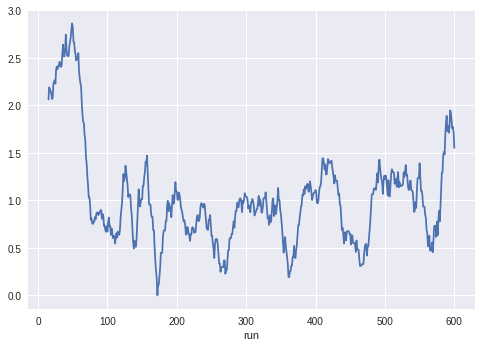

In [86]:
configs = of_rmsd.groupby('run').config.apply(lambda x: x.iloc[0])
configs = configs.apply(lambda x: pd.Series(x))
configs.diff().abs().sum(axis=1).abs().rolling(15).mean().plot()

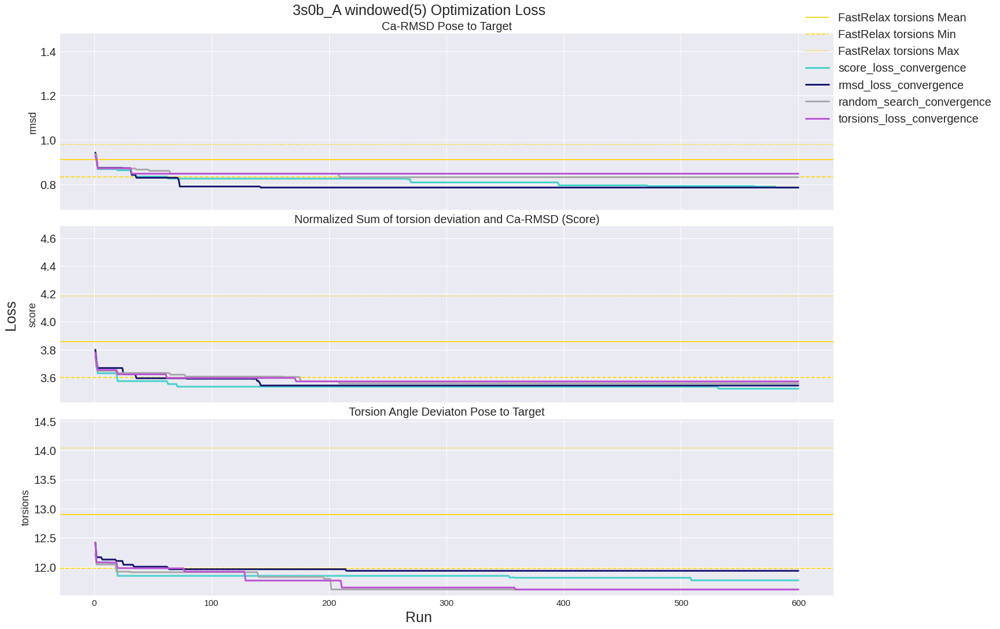

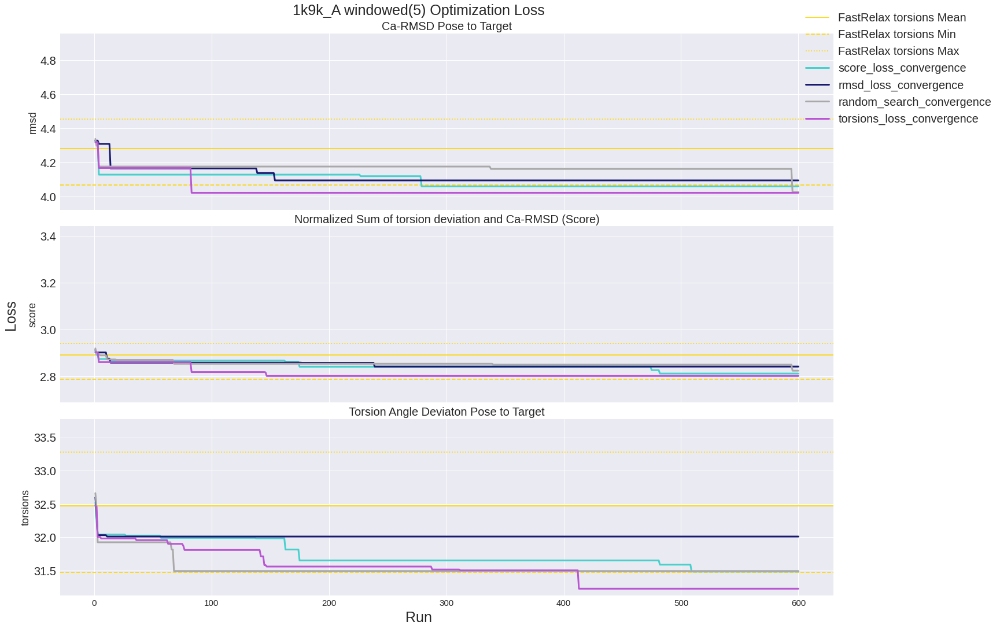

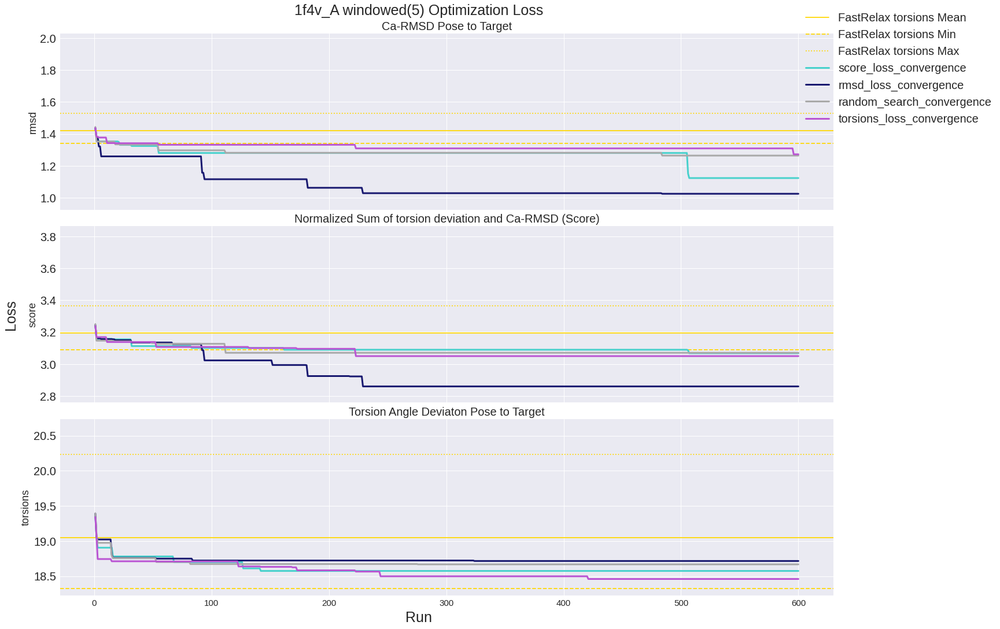

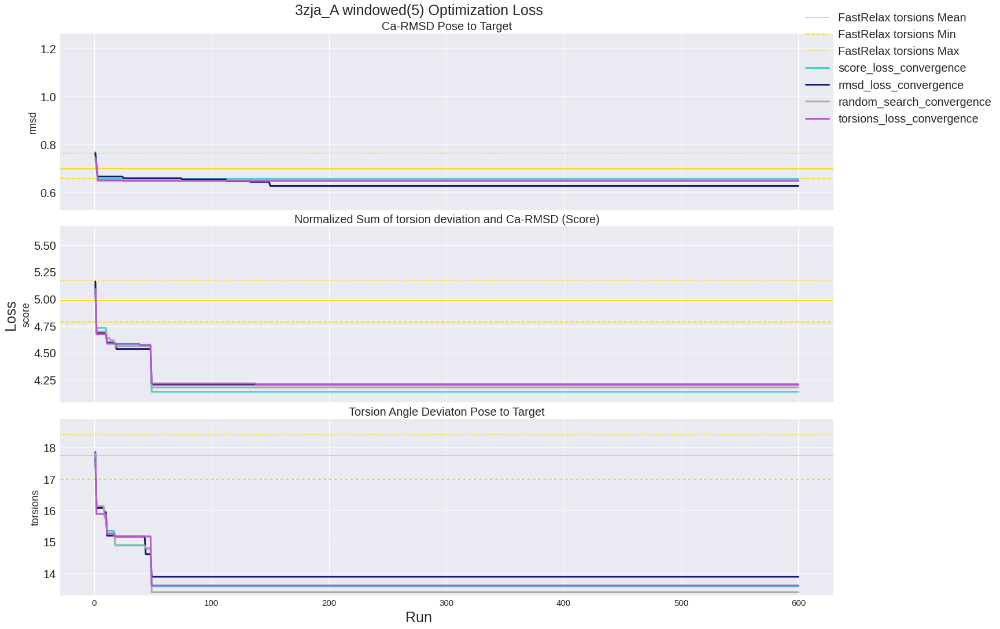

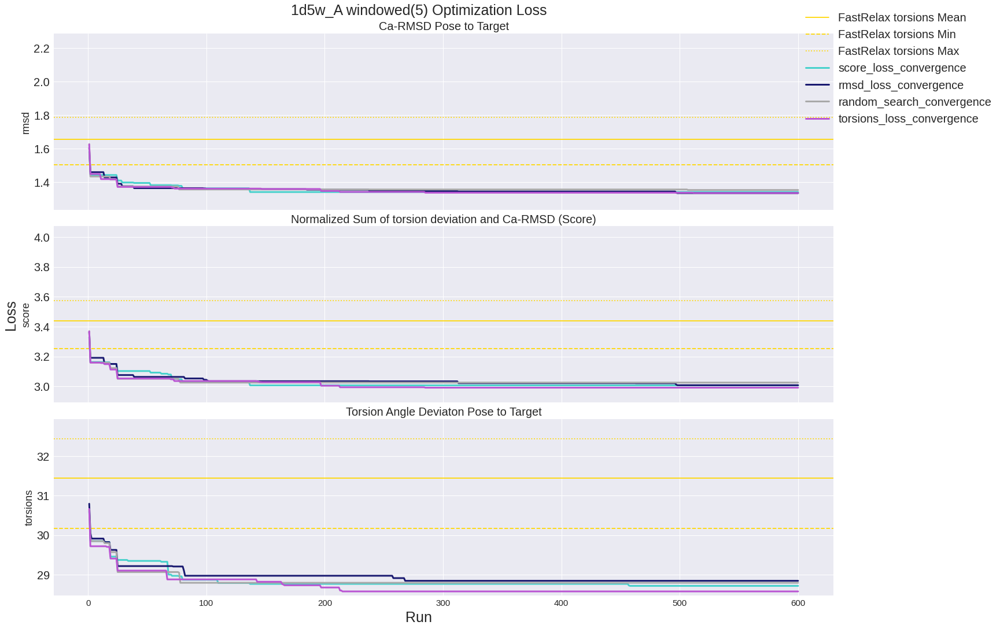

In [65]:
## Plot for each loss rmsd torsion and ref colored by loss
label_dict = {"rmsd": "Ca-RMSD Pose to Target",
             "torsions": "Torsion Angle Deviaton Pose to Target",
             "ref15": "Normalized REU Pose",
             "score": "Normalized Sum of torsion deviation and Ca-RMSD (Score)"}
ws = 5

def wind_min_max(ldf, loss, ws=20, cut_percentile=1) -> "tuple(vals, stds)":
    res = ldf.groupby('run').mean()
    rw_res = res[loss].rolling(ws).mean()
    rw_min = res[loss].rolling(ws).min()
    rw_max = res[loss].rolling(ws).max()
    rw_res = rw_res.where(rw_res < rw_res.quantile(q=cut_percentile))
    rw_min = rw_min.where(rw_min < rw_min.quantile(q=0.9))
    rw_max = rw_max.where(rw_max < rw_max.quantile(q=0.9))
    return rw_res, rw_min, rw_max

def wind_std(ldf, loss, ws=20, cut_percentile=1) -> "tuple(vals, stds)":
    res = ldf.groupby('run').mean()
    rw_res = res[loss].rolling(ws).mean()
    rw_std = res[loss].ewm(ws).std() # ewm nce for displaying how optimization get better on trajectory
    rw_res = rw_res.where(rw_res < rw_res.quantile(q=cut_percentile))
    rw_std = rw_std.where(rw_std < rw_std.quantile(q=0.9))
    return rw_res, rw_std, None
colors = {"rmsd_loss": plt_rmsd_color, "torsions_loss":plt_torsion_color, "ref15":plt_rscore_color, 'score_loss':plt_score_color, 'random_search':plt_dummy_color}


for prot in bench_dict.keys():
    i=0
    of_rmsd, of_score, of_dummy, of_torsions, baseline, _, _, _ = load_res_for_prot(prot) # _ for initial rmsd and torsion
    fig, axs = plt.subplots(3,1, sharex=True, figsize=(20, 15), constrained_layout=True)
    fig.suptitle(prot[:-2]+' Optimization Loss')

    for loss in [r'$C-\alpha\_rmsd$',  'combined', 'torsions']:
        axs[i].set_title(label_dict[loss]
        axs[i].set_ylabel(loss) 
        axs[i].axhline(baseline[loss].mean(), c=plt_baseline_color, linestyle='-', label="FastRelax")
        #axs[i].axhline(baseline[loss].min(), c=plt_baseline_color, linestyle='--', label="FastRelax "+loss+" Min")
        #axs[i].axhline(baseline[loss].max(), c=plt_baseline_color, linestyle=':', label="FastRelax "+loss+" Max")
        
        xmin = baseline[loss].min()
        for df in [of_score, of_rmsd, of_dummy, of_torsions]:       
            ldf, rw_min, rw_max = wind_std(df, loss, ws=ws, cut_percentile=0.9)
            conv = make_convergence(df.groupby('run').mean(), loss)
            #axs[i].plot(ldf.index, ldf.values, c=colors[df.name], label=df.name)            
            #axs[i].fill_between(ldf.index, rw_min, rw_max, color=colors[df.name],label=df.name+"_std", interpolate=True, alpha=0.3)
            #axs[i].fill_between(ldf.index, ldf-rw_min/2, ldf+rw_min/2, color=colors[df.name],label=df.name+"exp_win_std", interpolate=True, alpha=0.3)
            axs[i].plot(ldf.index, conv,c=colors[df.name], linestyle='solid', linewidth=3, label=df.name+"_convergence")

            xmin = min(conv) if min(conv) < xmin else xmin
        #axs[i].legend(prop={'size': 20})  
        axs[i].tick_params(labelsize=20)
        axs[i].set_ylim([xmin-0.1, baseline[loss].max()+0.5])
        i += 1
    plt.xticks(fontsize=15)
    fig.supylabel("Loss")
    fig.supxlabel("Run")
    h, l = plt.gca().get_legend_handles_labels()
    by_label = dict(zip(l, h))
    fig.legend(by_label.values(), by_label.keys(), bbox_to_anchor=(1.2, 1))
    plt.savefig(IMG_PATH+"opti_loss_"+prot+".png", dpi=300)
    plt.show()

# CONVERGENCE

## Converge Cycles

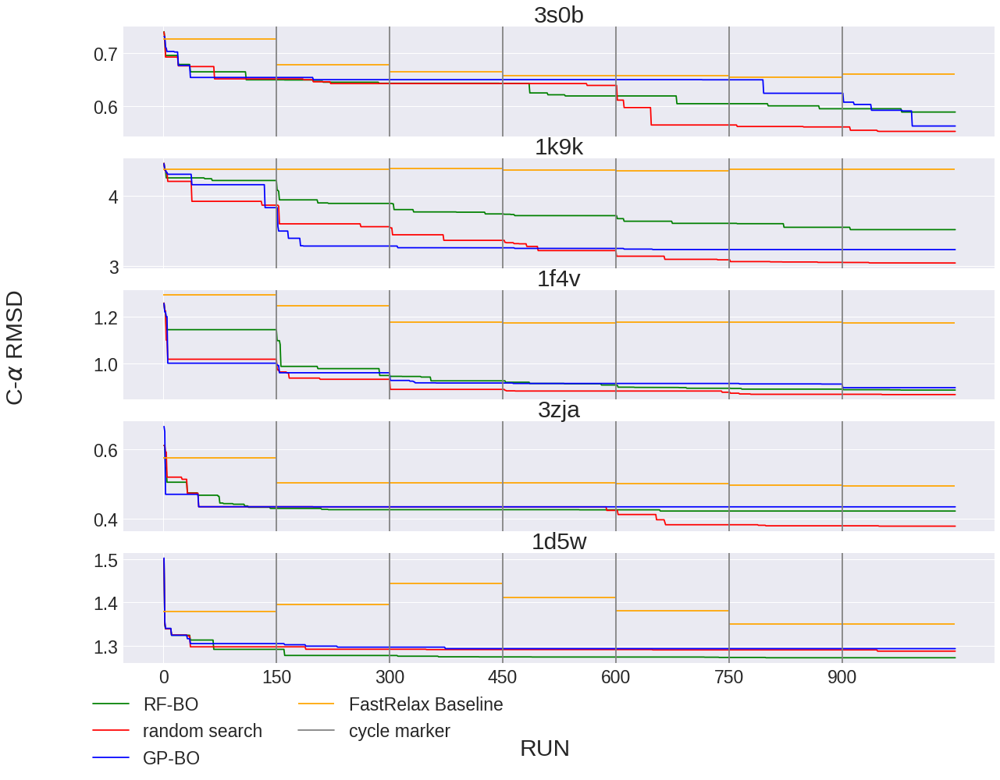

In [163]:
### CONVERGENCE Cycles
fig, axs = plt.subplots(5, 1, sharex=True, figsize=(20,15))
#fig.suptitle('Convergence of optimization loss')
fig.supxlabel("RUN")
fig.supylabel(r"C-$\alpha$ RMSD")

i = 0
for prot in bench_dict.keys():
    name = prot[:-2]
    axs[i].set_title(name)
    r = get("../results/latest/cycles/optimize_cyclic_7_"+prot+"_ca_rmsdno_pose.pkl")
    gp = get("../results/latest/cycles/optimize_cyclic_7_"+prot+"_GPno_pose.pkl")
    d = get("../results/latest/random_search/dummy_150_"+prot+"_no_pose.pkl")
    c = make_convergence(r.groupby('run').min(), "ca_rmsd")
    u = make_convergence(gp.groupby('run').min(), "ca_rmsd")
    dum = make_convergence(d.groupby('run').min(), "ca_rmsd")
    rs = make_convergence(from_txt('../results/'+name+'.txt').groupby('run').min(), 'ca_rmsd')
    frb: pd.DataFrame = get("../results/FastRelax_248_cycles_"+prot+".pkl")
    #axs[i].plot(range(1, len(d)+1), dum, c="gray", label='random search')
    axs[i].plot(range(1, len(c)+1), c,  c=rf_color,label='RF-BO')
    axs[i].plot(range(1, len(c)+1), rs, c=rs_color, label='random search')
    axs[i].plot(range(1, len(u)+1), u, c=gp_color, label='GP-BO')
    axs[i].hlines(frb.iloc[:49].ca_rmsd.mean(), xmin=0, xmax=149,color=fr_color, label="FastRelax Baseline")
    axs[i].hlines(frb.iloc[50:99].ca_rmsd.mean(),xmin=150, xmax=299, color=fr_color)
    axs[i].hlines(frb.iloc[100:149].ca_rmsd.mean(),xmin=300, xmax=449, color=fr_color)
    axs[i].hlines(frb.iloc[150:199].ca_rmsd.mean(),xmin=450, xmax=599, color=fr_color)
    axs[i].hlines(frb.iloc[200:249].ca_rmsd.mean(),xmin=600, xmax=749, color=fr_color)
    axs[i].hlines(frb.iloc[250:299].ca_rmsd.mean(),xmin=750, xmax=899, color=fr_color)
    axs[i].hlines(frb.iloc[300:349].ca_rmsd.mean(),xmin=900, xmax=1049, color=fr_color)

    axs[i].axvline(150, c='grey', label='cycle marker')

    for mark in [300,450,600,750,900]:
        axs[i].axvline(mark, c='grey')
    if i == 4:
        axs[i].legend(loc='lower center',bbox_to_anchor=(0.2, -1.1), ncol=2)
    i+=1
plt.xticks([0, 150,300, 450, 600, 750, 900])
plt.savefig(IMG_PATH+"CYCLES_7_CONV_RF_BASE.png", dpi=300)

## MIN Converge 150

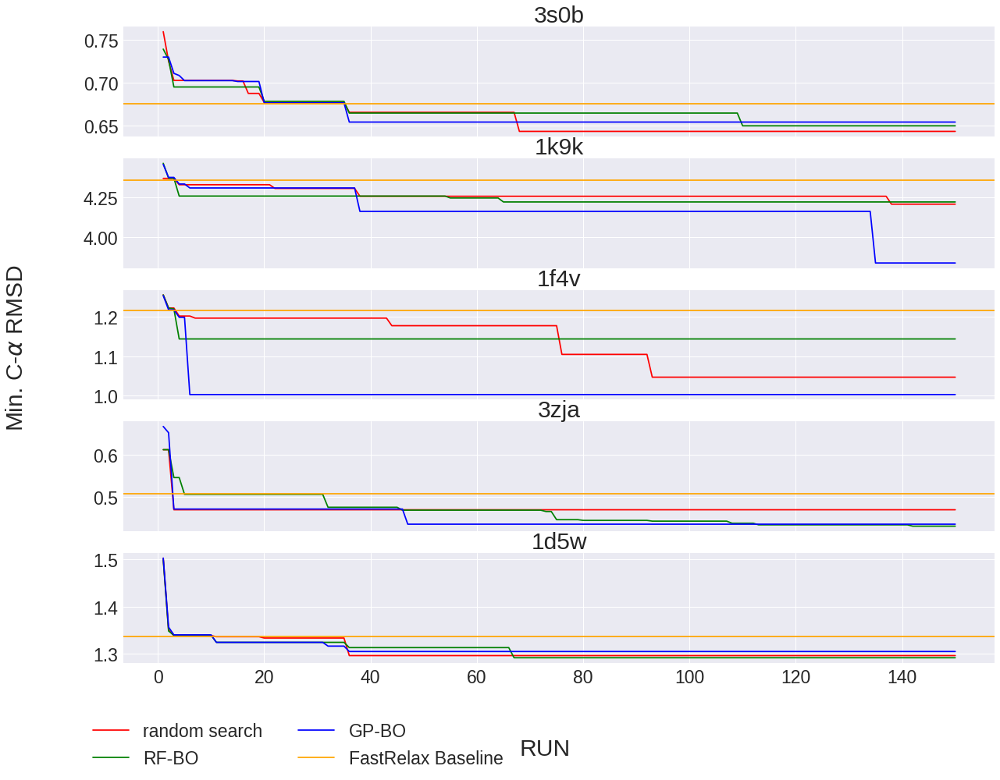

In [164]:
### MIN CONVERGENCE 150
fig, axs = plt.subplots(5, 1, sharex=True, figsize=(20,15))
#fig.suptitle('Convergence of optimization loss')
fig.supxlabel("RUN")
fig.supylabel(r"Min. C-$\alpha$ RMSD ")

#plt.ylabel('REU', fontsize=16)
i = 0
for prot in bench_dict.keys():
    axs[i].set_title(prot[:-2])
    r = get("../results/latest/cycles/optimize_cyclic_7_"+prot+"_ca_rmsdno_pose.pkl")
    gp = get("../results/latest/cycles/optimize_cyclic_7_"+prot+"_GPno_pose.pkl")
    c = make_convergence(r.groupby('run').min(), "ca_rmsd")
    u = make_convergence(gp.groupby('run').min(), "ca_rmsd")
    d = get("../results/latest/random_search/dummy_150_"+prot+"_no_pose.pkl")
    dum = make_convergence(d.groupby('run').min(), "ca_rmsd")
    frb: pd.DataFrame = get("../results/latest/baseline/FRB_40_"+prot+"_no_pose.pkl")
    axs[i].plot(range(1, 151), dum[:150], c=rs_color, label='random search')
    axs[i].plot(range(1, len(c[:150])+1), c[:150],  c=rf_color,label='RF-BO')
    axs[i].plot(range(1, len(u[:150])+1), u[:150], c=gp_color, label='GP-BO')
    axs[i].axhline(frb.ca_rmsd.sample(n=6).min(), c=fr_color, label="FastRelax Baseline")
    if i == 4:
        axs[i].legend(loc='lower center',bbox_to_anchor=(0.2, -1.1), ncol=2)
    i+=1
plt.savefig(IMG_PATH+"MINIMUM_CONV_RF_GP_RS_150.png", dpi=300)

## MEAN Converge 150

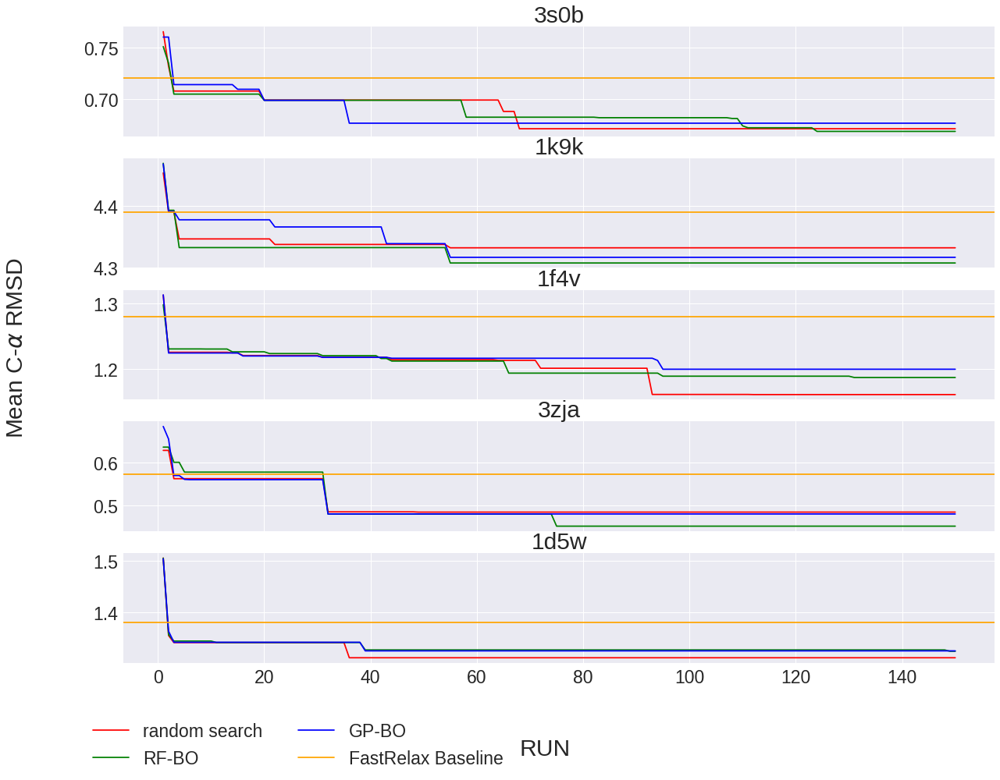

In [165]:
### MEANCONVERGENCE 150
fig, axs = plt.subplots(5, 1, sharex=True, figsize=(20,15))
#fig.suptitle('Convergence of optimization loss')
fig.supxlabel("RUN")
fig.supylabel(r"Mean C-$\alpha$ RMSD ")

#plt.ylabel('REU', fontsize=16)
i = 0
for prot in bench_dict.keys():
    axs[i].set_title(prot[:-2])
    r = get("../results/latest/cycles/optimize_cyclic_7_"+prot+"_ca_rmsdno_pose.pkl")
    gp = get("../results/latest/cycles/optimize_cyclic_7_"+prot+"_GPno_pose.pkl")
    c = make_convergence(r.groupby('run').mean(), "ca_rmsd")
    u = make_convergence(gp.groupby('run').mean(), "ca_rmsd")
    d = get("../results/latest/random_search/dummy_150_"+prot+"_no_pose.pkl")
    dum = make_convergence(d.groupby('run').mean(), "ca_rmsd")
    frb: pd.DataFrame = get("../results/latest/baseline/FRB_40_"+prot+"_no_pose.pkl")
    axs[i].plot(range(1, 151), dum[:150], c=rs_color, label='random search')
    axs[i].plot(range(1, len(c[:150])+1), c[:150],  c=rf_color,label='RF-BO')
    axs[i].plot(range(1, len(u[:150])+1), u[:150], c=gp_color, label='GP-BO')
    axs[i].axhline(frb.ca_rmsd.mean(), c=fr_color, label="FastRelax Baseline")
    if i == 4:
        axs[i].legend(loc='lower center',bbox_to_anchor=(0.2, -1.1), ncol=2)
    i+=1
plt.savefig(IMG_PATH+"MEAN_CONV_RF_GP_RS_150.png", dpi=300)

### SCATTER FULL

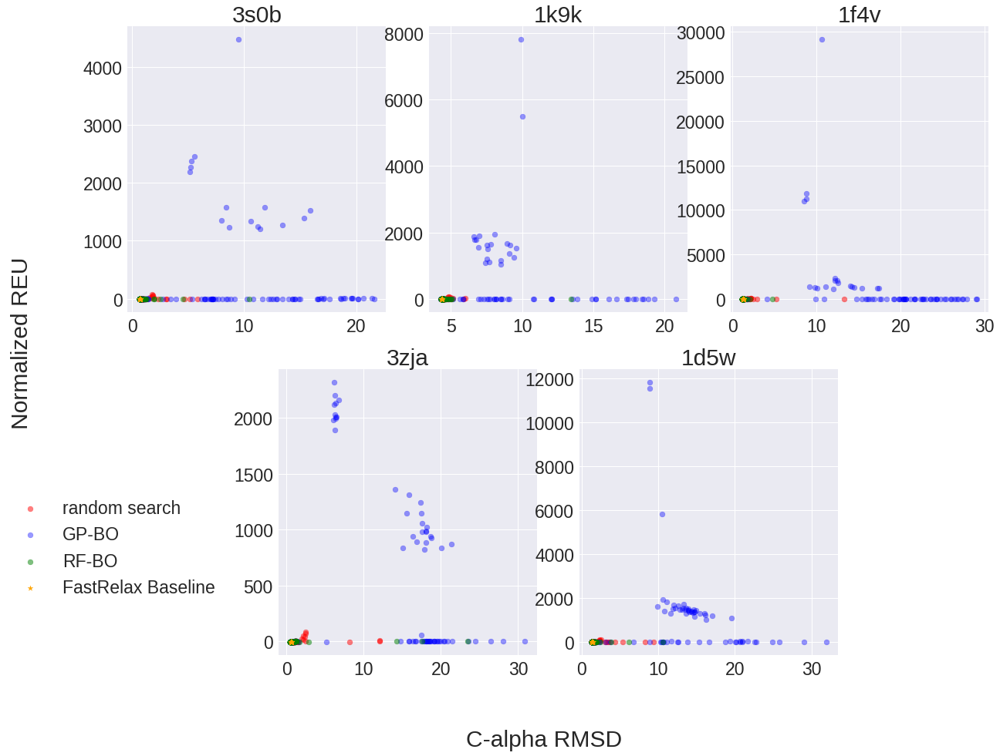

In [160]:
### SCATTER METRICS
from mpl_toolkits.axes_grid1.inset_locator import zoomed_inset_axes, mark_inset
fig = plt.figure(figsize=(20,15))
ax1 = plt.subplot2grid(shape=(2,6), loc=(0,0), colspan=2)
ax2 = plt.subplot2grid((2,6), (0,2), colspan=2)
ax3 = plt.subplot2grid((2,6), (0,4), colspan=2)
ax4 = plt.subplot2grid((2,6), (1,1), colspan=2)
ax5 = plt.subplot2grid((2,6), (1,3), colspan=2)
#fig.suptitle('Convergence of optimization loss')
fig.supxlabel("C-alpha RMSD")
fig.supylabel("Normalized REU")

#plt.ylabel('REU', fontsize=16)
i = 0
axs = [ax1, ax2, ax3, ax4, ax5]
#axs = axs.reshape(-1)
xmin=[35.344,]
xmax=[35.6,]
ymin=[4.3,]
ymax=[4.6,]
for prot in bench_dict.keys():
    axs[i].set_title(prot[:-2])
    r = get("../results/latest/cycles/optimize_cyclic_7_"+prot+"_ca_rmsdno_pose.pkl")
    gp = get("../results/latest/cycles/optimize_cyclic_7_"+prot+"_GPno_pose.pkl")
    d = get("../results/latest/random_search/dummy_150_"+prot+"_no_pose.pkl")
    rf = r.groupby('run').mean().iloc[:150]
    gp = gp.groupby('run').mean().iloc[:150]
    dum = d.groupby('run').mean().iloc[:150]
    frb: pd.DataFrame = get("../results/latest/baseline/FRB_40_"+prot+"_no_pose.pkl")
    axs[i].scatter(dum.ca_rmsd, dum.ref15, c=rs_color,alpha=0.5, label='random search')
    axs[i].scatter(gp.ca_rmsd, gp.ref15, c=gp_color,alpha=0.4, label='GP-BO')
    axs[i].scatter(rf.ca_rmsd, rf.ref15,  c=rf_color,alpha=0.5,label='RF-BO')
    axs[i].scatter(frb.ca_rmsd, frb.ref15, c=fr_color, marker='*', label="FastRelax Baseline")
  
    if i == 0:
        axs[i].legend(bbox_to_anchor=(0.4,-0.6))
    i+=1
    #break
plt.subplots_adjust(wspace=0.4)
plt.savefig(IMG_PATH+"FULL_SCATTER_REU_RMSD_150.png", dpi=300)

# SCATTER

## Full

### REU vs CA

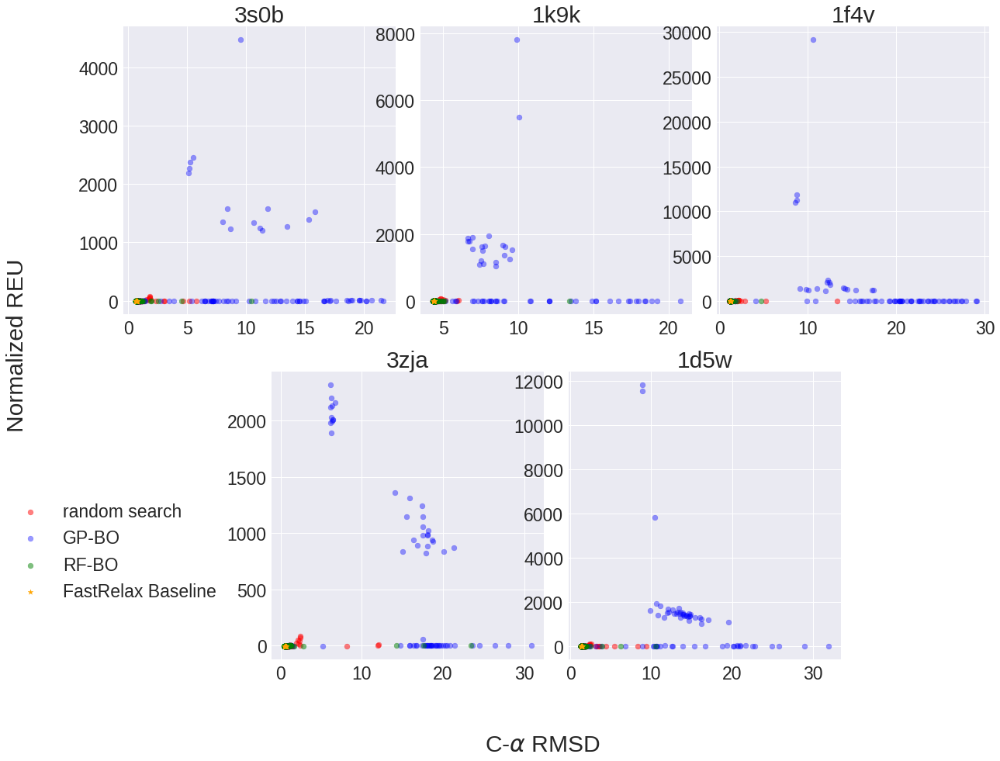

In [166]:
### SCATTER REU CA
from mpl_toolkits.axes_grid1.inset_locator import zoomed_inset_axes, mark_inset
fig = plt.figure(figsize=(20,15))
ax1 = plt.subplot2grid(shape=(2,6), loc=(0,0), colspan=2)
ax2 = plt.subplot2grid((2,6), (0,2), colspan=2)
ax3 = plt.subplot2grid((2,6), (0,4), colspan=2)
ax4 = plt.subplot2grid((2,6), (1,1), colspan=2)
ax5 = plt.subplot2grid((2,6), (1,3), colspan=2)
#fig.suptitle('Convergence of optimization loss')
fig.supxlabel(r"C-$\alpha$ RMSD")
fig.supylabel("Normalized REU")

#plt.ylabel('REU', fontsize=16)
i = 0
axs = [ax1, ax2, ax3, ax4, ax5]
#axs = axs.reshape(-1)
xmin=[35.344,]
xmax=[35.6,]
ymin=[4.3,]
ymax=[4.6,]
for prot in bench_dict.keys():
    axs[i].set_title(prot[:-2])
    r = get("../results/latest/cycles/optimize_cyclic_7_"+prot+"_ca_rmsdno_pose.pkl")
    gp = get("../results/latest/cycles/optimize_cyclic_7_"+prot+"_GPno_pose.pkl")
    d = get("../results/latest/random_search/dummy_150_"+prot+"_no_pose.pkl")
    rf = r.groupby('run').mean().iloc[:150]
    gp = gp.groupby('run').mean().iloc[:150]
    dum = d.groupby('run').mean().iloc[:150]
    frb: pd.DataFrame = get("../results/latest/baseline/FRB_40_"+prot+"_no_pose.pkl")
    axs[i].scatter(dum.ca_rmsd, dum.ref15, c=rs_color,alpha=0.5, label='random search')
    axs[i].scatter(gp.ca_rmsd, gp.ref15, c=gp_color,alpha=0.4, label='GP-BO')
    axs[i].scatter(rf.ca_rmsd, rf.ref15,  c=rf_color,alpha=0.5,label='RF-BO')
    axs[i].scatter(frb.ca_rmsd, frb.ref15, c=fr_color, marker='*', label="FastRelax Baseline")
    #axins = zoomed_inset_axes(axs[i], zoom=20, loc='center right')
    #axins.scatter(dum.torsion_rmsd, dum.ca_rmsd, c="red",alpha=0.5, label='random search')
    #axins.scatter(gp.torsion_rmsd, gp.ca_rmsd, c='blue',alpha=0.2, label='gaussian processes surrogate')
    #axins.scatter(rf.torsion_rmsd, rf.ca_rmsd,  c='green',alpha=0.5,label='random forest surrogate')
    #axins.scatter(frb.torsion_rmsd, frb.ca_rmsd, c='black', marker='+', label="FastRelax Baseline")
    #axs[i].set_ylim(rf.ref15.min()-0.1, rf.ref15.quantile(0.9))
    #axs[i].set_xlim(rf.ca_rmsd.min()-0.1,rf.ca_rmsd.quantile(0.95))
    #plt.xticks(visible=False)
    #plt.yticks(visible=False)
    #mark_inset(axs[i], axins, loc1=2, loc2=4, fc="none", ec="0.5")
    if i == 0:
        axs[i].legend(bbox_to_anchor=(0.4,-0.6))
    i+=1
    #break
fig.axes
plt.savefig(IMG_PATH+"SCATTER_REU_CA_150.png", dpi=300)

### TORSION vs. CA

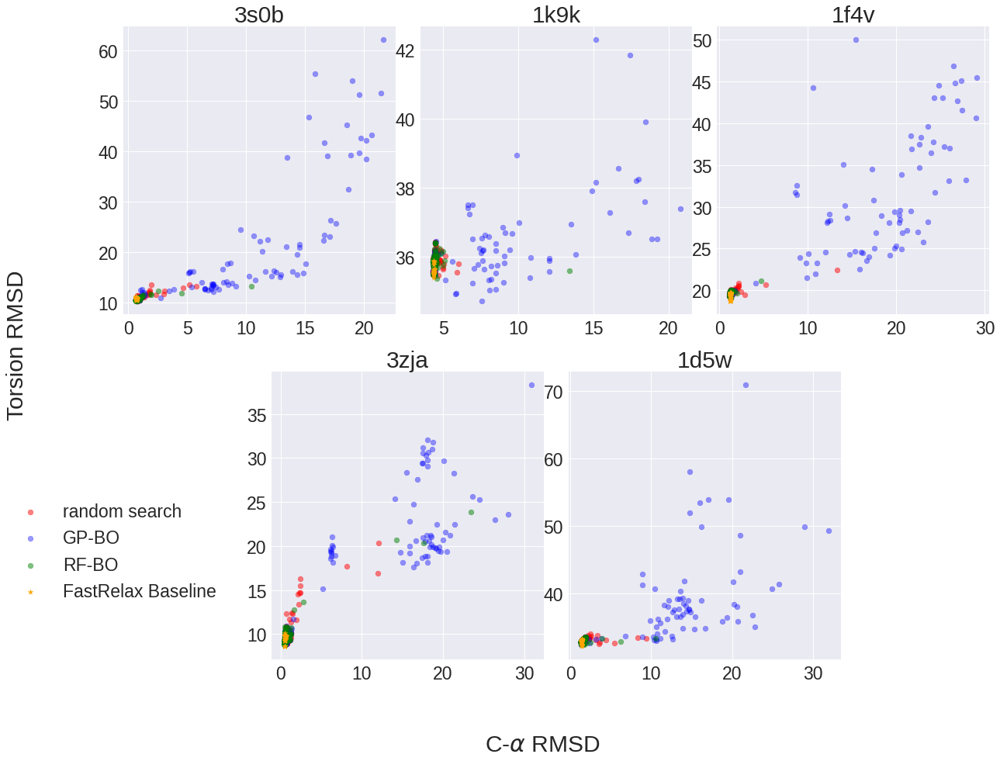

In [167]:
### SCATTER TORSION CA
from mpl_toolkits.axes_grid1.inset_locator import zoomed_inset_axes, mark_inset
fig = plt.figure(figsize=(20,15))
ax1 = plt.subplot2grid(shape=(2,6), loc=(0,0), colspan=2)
ax2 = plt.subplot2grid((2,6), (0,2), colspan=2)
ax3 = plt.subplot2grid((2,6), (0,4), colspan=2)
ax4 = plt.subplot2grid((2,6), (1,1), colspan=2)
ax5 = plt.subplot2grid((2,6), (1,3), colspan=2)
#fig.suptitle('Convergence of optimization loss')
fig.supxlabel(r"C-$\alpha$ RMSD")
fig.supylabel("Torsion RMSD")

#plt.ylabel('REU', fontsize=16)
i = 0
axs = [ax1, ax2, ax3, ax4, ax5]
#axs = axs.reshape(-1)
xmin=[35.344,]
xmax=[35.6,]
ymin=[4.3,]
ymax=[4.6,]
for prot in bench_dict.keys():
    axs[i].set_title(prot[:-2])
    r = get("../results/latest/cycles/optimize_cyclic_7_"+prot+"_ca_rmsdno_pose.pkl")
    gp = get("../results/latest/cycles/optimize_cyclic_7_"+prot+"_GPno_pose.pkl")
    d = get("../results/latest/random_search/dummy_150_"+prot+"_no_pose.pkl")
    rf = r.groupby('run').mean().iloc[:150]
    gp = gp.groupby('run').mean().iloc[:150]
    dum = d.groupby('run').mean().iloc[:150]
    frb: pd.DataFrame = get("../results/latest/baseline/FRB_40_"+prot+"_no_pose.pkl")
    axs[i].scatter(dum.ca_rmsd, dum.torsion_rmsd, c=rs_color,alpha=0.5, label='random search')
    axs[i].scatter(gp.ca_rmsd, gp.torsion_rmsd, c=gp_color,alpha=0.4, label='GP-BO')
    axs[i].scatter(rf.ca_rmsd, rf.torsion_rmsd,  c=rf_color,alpha=0.5,label='RF-BO')
    axs[i].scatter(frb.ca_rmsd, frb.torsion_rmsd, c=fr_color, marker='*', label="FastRelax Baseline")
    #axins = zoomed_inset_axes(axs[i], zoom=20, loc='center right')
    #axins.scatter(dum.torsion_rmsd, dum.ca_rmsd, c="red",alpha=0.5, label='random search')
    #axins.scatter(gp.torsion_rmsd, gp.ca_rmsd, c='blue',alpha=0.2, label='gaussian processes surrogate')
    #axins.scatter(rf.torsion_rmsd, rf.ca_rmsd,  c='green',alpha=0.5,label='random forest surrogate')
    #axins.scatter(frb.torsion_rmsd, frb.ca_rmsd, c='black', marker='+', label="FastRelax Baseline")
    #axs[i].set_ylim(rf.torsion_rmsd.min()-0.1, rf.torsion_rmsd.quantile(0.9))
    #axs[i].set_xlim(rf.ca_rmsd.min()-0.1,rf.ca_rmsd.quantile(0.95))
    #plt.xticks(visible=False)
    #plt.yticks(visible=False)
    #mark_inset(axs[i], axins, loc1=2, loc2=4, fc="none", ec="0.5")
    if i == 0:
        axs[i].legend(bbox_to_anchor=(0.4,-0.6))
    i+=1
    #break
fig.axes
plt.savefig(IMG_PATH+"SCATTER_TORSION_CA_150.png", dpi=300)

## Scatter ZOOM

### MEAN VS STD

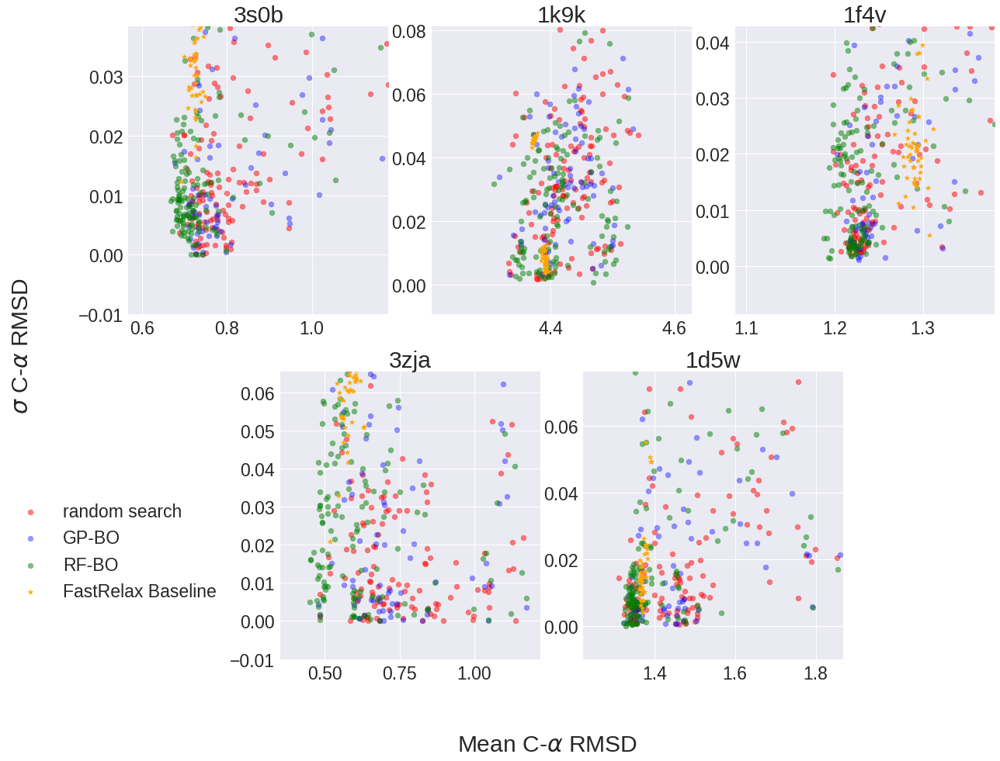

In [157]:
# MEAN VS STD
fig = plt.figure(figsize=(20,15))
ax1 = plt.subplot2grid(shape=(2,6), loc=(0,0), colspan=2)
ax2 = plt.subplot2grid((2,6), (0,2), colspan=2)
ax3 = plt.subplot2grid((2,6), (0,4), colspan=2)
ax4 = plt.subplot2grid((2,6), (1,1), colspan=2)
ax5 = plt.subplot2grid((2,6), (1,3), colspan=2)
#fig.suptitle('Convergence of optimization loss')
fig.supxlabel(r"Mean C-$\alpha$ RMSD")
fig.supylabel(r"$\sigma$ C-$\alpha$ RMSD")

i = 0
axs = [ax1, ax2, ax3, ax4, ax5]
#axs = axs.reshape(-1)
xmin=[35.344,]
xmax=[35.6,]
ymin=[4.3,]
ymax=[4.6,]
for prot in bench_dict.keys():
    axs[i].set_title(prot[:-2])
    r = get("../results/latest/cycles/optimize_cyclic_7_"+prot+"_ca_rmsdno_pose.pkl")
    gp = get("../results/latest/cycles/optimize_cyclic_7_"+prot+"_GPno_pose.pkl")
    d = get("../results/latest/random_search/dummy_150_"+prot+"_no_pose.pkl")
    rf = r.groupby('run')
    gp = gp.groupby('run')
    dum = d.groupby('run')
    frb: pd.DataFrame = get("../results/FastRelax_248_cycles_"+prot+".pkl").iloc[:50]
    dummy_means = []
    dummy_stds = []
    for _ in range(50):
        sample = frb.sample(6)
        dummy_means.append(sample.ca_rmsd.mean())
        dummy_stds.append(sample.ca_rmsd.std())
    #print(dummy_means, dummy_stds)
    axs[i].scatter(dum.ca_rmsd.mean().iloc[:150], dum.ca_rmsd.std().iloc[:150], c=rs_color,alpha=0.5, label='random search')
    axs[i].scatter(gp.ca_rmsd.mean().iloc[:150], gp.ca_rmsd.std().iloc[:150], c=gp_color,alpha=0.4, label='GP-BO')
    axs[i].scatter(rf.ca_rmsd.mean().iloc[:150], rf.ca_rmsd.std().iloc[:150],  c=rf_color,alpha=0.5,label='RF-BO')
    axs[i].scatter(dummy_means, dummy_stds, c=fr_color, marker='*', label="FastRelax Baseline")
    axs[i].set_ylim(rf.ca_rmsd.std().iloc[:150].min()-0.01, rf.ca_rmsd.std().iloc[:150].quantile(0.9))
    axs[i].set_xlim(rf.ca_rmsd.mean().iloc[:150].min()-0.1, rf.ca_rmsd.mean().iloc[:150].quantile(0.95))
    
    if i == 0:
        axs[i].legend(bbox_to_anchor=(0.4,-0.6))
    i+=1
    #break
plt.subplots_adjust(wspace=0.4)
plt.savefig(IMG_PATH+"ZOOM_SCATTER_MEAN_VS_STD_150.png", dpi=300)

### MIN vs STD

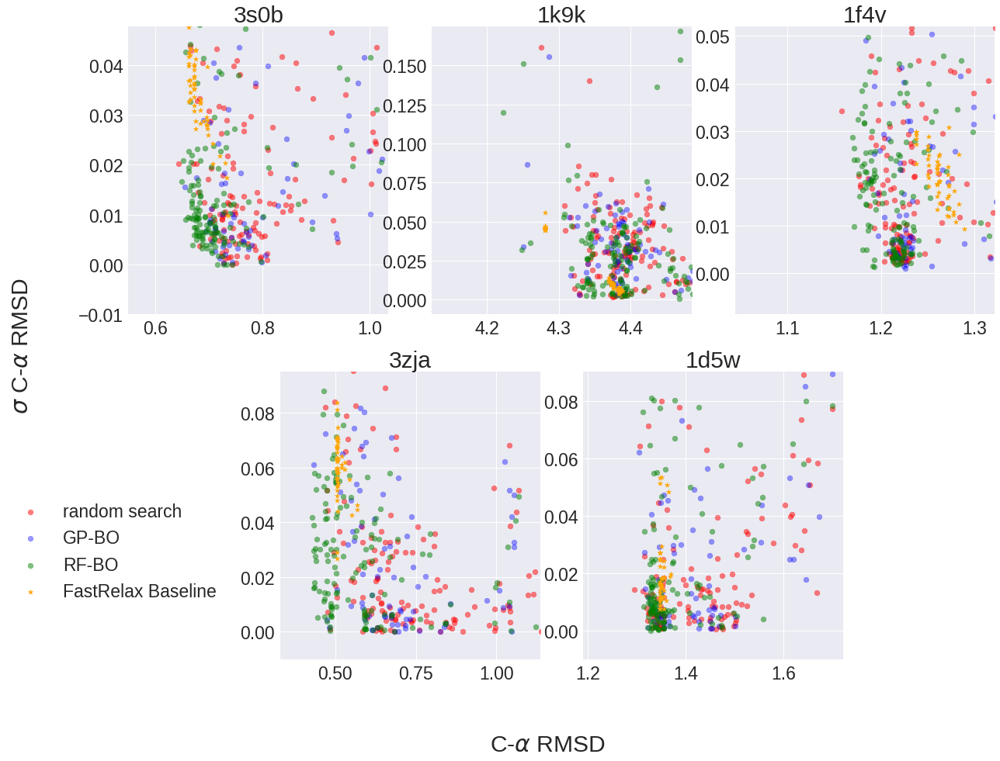

In [156]:
# MEAN VS STD
fig = plt.figure(figsize=(20,15))
ax1 = plt.subplot2grid(shape=(2,6), loc=(0,0), colspan=2)
ax2 = plt.subplot2grid((2,6), (0,2), colspan=2)
ax3 = plt.subplot2grid((2,6), (0,4), colspan=2)
ax4 = plt.subplot2grid((2,6), (1,1), colspan=2)
ax5 = plt.subplot2grid((2,6), (1,3), colspan=2)
#fig.suptitle('Convergence of optimization loss')
fig.supxlabel(r"C-$\alpha$ RMSD")
fig.supylabel(r"$\sigma$ C-$\alpha$ RMSD")

i = 0
axs = [ax1, ax2, ax3, ax4, ax5]
#axs = axs.reshape(-1)
xmin=[35.344,]
xmax=[35.6,]
ymin=[4.3,]
ymax=[4.6,]
for prot in bench_dict.keys():
    axs[i].set_title(prot[:-2])
    r = get("../results/latest/cycles/optimize_cyclic_7_"+prot+"_ca_rmsdno_pose.pkl")
    gp = get("../results/latest/cycles/optimize_cyclic_7_"+prot+"_GPno_pose.pkl")
    d = get("../results/latest/random_search/dummy_150_"+prot+"_no_pose.pkl")
    rf = r.groupby('run')
    gp = gp.groupby('run')
    dum = d.groupby('run')
    frb: pd.DataFrame = get("../results/FastRelax_248_cycles_"+prot+".pkl").iloc[:50]
    dummy_means = []
    dummy_stds = []
    for _ in range(50):
        sample = frb.sample(6)
        dummy_means.append(sample.ca_rmsd.min())
        dummy_stds.append(sample.ca_rmsd.std())
    #print(dummy_means, dummy_stds)
    axs[i].scatter(dum.ca_rmsd.min().iloc[:150], dum.ca_rmsd.std().iloc[:150], c=rs_color,alpha=0.5, label='random search')
    axs[i].scatter(gp.ca_rmsd.min().iloc[:150], gp.ca_rmsd.std().iloc[:150], c=gp_color,alpha=0.4, label='GP-BO')
    axs[i].scatter(rf.ca_rmsd.min().iloc[:150], rf.ca_rmsd.std().iloc[:150],  c=rf_color,alpha=0.5,label='RF-BO')
    axs[i].scatter(dummy_means, dummy_stds, c=fr_color, marker='*', label="FastRelax Baseline")
    
    axs[i].set_ylim(rf.ca_rmsd.std().iloc[:150].min()-0.01, rf.ca_rmsd.std().iloc[:150].quantile(0.95))
    axs[i].set_xlim(rf.ca_rmsd.min().iloc[:150].min()-0.1, rf.ca_rmsd.min().iloc[:150].quantile(0.95))
    
    if i == 0:
        axs[i].legend(bbox_to_anchor=(0.4,-0.6))
    i+=1
    #break
plt.subplots_adjust(wspace=0.4)
plt.savefig(IMG_PATH+"ZOOM_SCATTER_MIN_VS_STD_150.png", dpi=300)

In [18]:
for prot in bench_dict.keys():
    r = get("../results/latest/cycles/optimize_cyclic_7_"+prot+"_ca_rmsdno_pose.pkl")
    g = get("../results/latest/cycles/optimize_cyclic_7_"+prot+"_GPno_pose.pkl")
    d = get("../results/latest/random_search/dummy_150_"+prot+"_no_pose.pkl")
    rf = r.groupby('run').std()
    gp = g.groupby('run').std()
    dum = d.groupby('run').std()
    frb: pd.DataFrame = get("../results/FastRelax_248_cycles_"+prot+".pkl").iloc[:50]
    print('\n \n \n '+prot)
    print('rf \n '+r.nsmallest(1, 'ca_rmsd'))
    #print('gp \n '+gp.iloc[g.nsmallest(1, 'ca_rmsd').run].ca_rmsd)
    #print('dum \n '+dum.iloc[d.nsmallest(1, 'ca_rmsd').run].ca_rmsd)

In [51]:
r.nsmallest(1

,run,torsion_rmsd,ca_rmsd,config,ref15,score,took,cycle
0,2,32.824815,1.358778,"[0.4866379968583622, 0.9908209308067057, 0.808...",-3.593183,1.047266,00:27:18,0
1,2,32.754462,1.375784,"[0.4866379968583622, 0.9908209308067057, 0.808...",-3.604735,1.052980,00:27:15,0
2,2,32.836247,1.358131,"[0.4866379968583622, 0.9908209308067057, 0.808...",-3.591015,1.047183,00:27:28,0
3,2,32.790196,1.350521,"[0.4866379968583622, 0.9908209308067057, 0.808...",-3.596547,1.043435,00:27:24,0
4,2,32.796386,1.348248,"[0.4866379968583622, 0.9908209308067057, 0.808...",-3.590358,1.042622,00:27:17,0
...,...,...,...,...,...,...,...,...
6295,1050,32.567928,1.274319,"[0.852982029518159, 0.5172138074598379, 0.8650...",-3.497916,1.001028,00:22:24,6
6296,1050,32.576096,1.274874,"[0.852982029518159, 0.5172138074598379, 0.8650...",-3.497893,1.001372,00:22:30,6
6297,1050,32.567743,1.275202,"[0.852982029518159, 0.5172138074598379, 0.8650...",-3.498462,1.001372,00:23:31,6
6298,1050,32.567038,1.274453,"[0.852982029518159, 0.5172138074598379, 0.8650...",-3.498412,1.001067,00:23:41,6


### REU vs CA

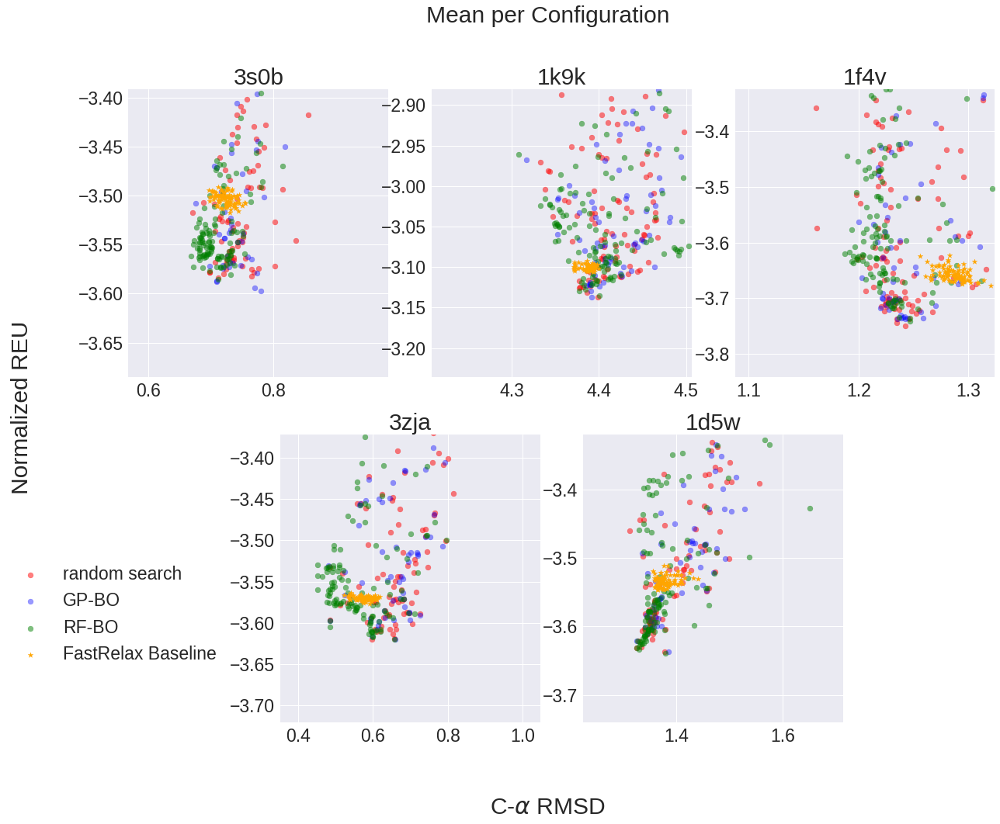

In [155]:
### SCATTER ZOOMED
from mpl_toolkits.axes_grid1.inset_locator import zoomed_inset_axes, mark_inset
fig = plt.figure(figsize=(20,15))
ax1 = plt.subplot2grid(shape=(2,6), loc=(0,0), colspan=2)
ax2 = plt.subplot2grid((2,6), (0,2), colspan=2)
ax3 = plt.subplot2grid((2,6), (0,4), colspan=2)
ax4 = plt.subplot2grid((2,6), (1,1), colspan=2)
ax5 = plt.subplot2grid((2,6), (1,3), colspan=2)
fig.suptitle('Mean per Configuration')
fig.supxlabel(r"C-$\alpha$ RMSD")
fig.supylabel("Normalized REU")

i = 0
axs = [ax1, ax2, ax3, ax4, ax5]
#axs = axs.reshape(-1)
xmin=[35.344,]
xmax=[35.6,]
ymin=[4.3,]
ymax=[4.6,]
for prot in bench_dict.keys():
    axs[i].set_title(prot[:-2])
    r = get("../results/latest/cycles/optimize_cyclic_7_"+prot+"_ca_rmsdno_pose.pkl")
    gp = get("../results/latest/cycles/optimize_cyclic_7_"+prot+"_GPno_pose.pkl")
    d = get("../results/latest/random_search/dummy_150_"+prot+"_no_pose.pkl")
    rf = r.groupby('run').mean().iloc[:150]
    gp = gp.groupby('run').mean().iloc[:150]
    dum = d.groupby('run').mean().iloc[:150]
    frb: pd.DataFrame = get("../results/latest/baseline/FRB_"+prot+".pkl")
    dummy_ca = []
    dummy_ref = []
    for _ in range(90):
        sample = frb.sample(6)
        dummy_ref.append(sample.ref15.mean())
        dummy_ca.append(sample.ca_rmsd.mean())
    axs[i].scatter(dum.ca_rmsd, dum.ref15, c=rs_color,alpha=0.5, label='random search')
    axs[i].scatter(gp.ca_rmsd, gp.ref15, c=gp_color,alpha=0.4, label='GP-BO')
    axs[i].scatter(rf.ca_rmsd, rf.ref15,  c=rf_color,alpha=0.5,label='RF-BO')
    axs[i].scatter(dummy_ca, dummy_ref, c=fr_color, marker='*', label="FastRelax Baseline")
    axs[i].set_ylim(rf.ref15.min()-0.1, rf.ref15.quantile(0.8))
    axs[i].set_xlim(rf.ca_rmsd.min()-0.1,rf.ca_rmsd.quantile(0.9))

    if i == 0:
        axs[i].legend(bbox_to_anchor=(0.4,-0.6))
    i+=1
    #break
#plt.tight_layout()
plt.subplots_adjust(wspace=0.4)
plt.savefig(IMG_PATH+"ZOOM_SCATTER_REU_CA_150.png", dpi=300)

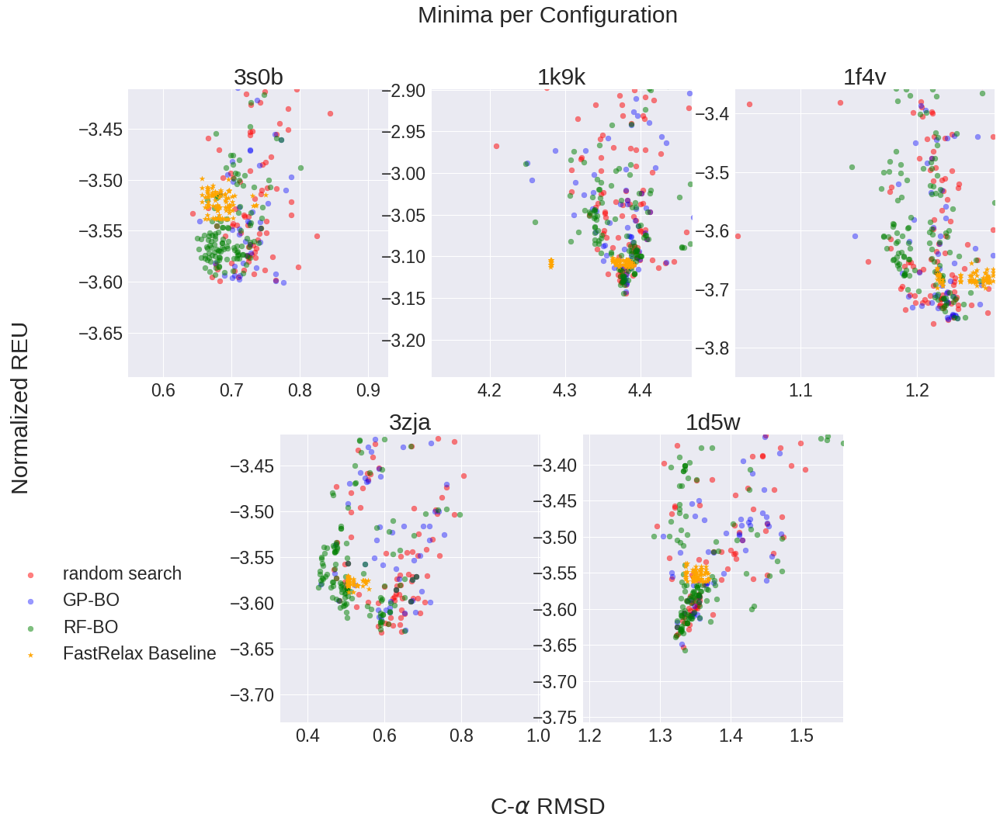

In [154]:
### SCATTER ZOOMED MINIMUM
from mpl_toolkits.axes_grid1.inset_locator import zoomed_inset_axes, mark_inset
fig = plt.figure(figsize=(20,15))
ax1 = plt.subplot2grid(shape=(2,6), loc=(0,0), colspan=2)
ax2 = plt.subplot2grid((2,6), (0,2), colspan=2)
ax3 = plt.subplot2grid((2,6), (0,4), colspan=2)
ax4 = plt.subplot2grid((2,6), (1,1), colspan=2)
ax5 = plt.subplot2grid((2,6), (1,3), colspan=2)
fig.suptitle('Minima per Configuration')
fig.supxlabel(r"C-$\alpha$ RMSD")
fig.supylabel("Normalized REU")

i = 0
axs = [ax1, ax2, ax3, ax4, ax5]
#axs = axs.reshape(-1)
xmin=[35.344,]
xmax=[35.6,]
ymin=[4.3,]
ymax=[4.6,]
for prot in bench_dict.keys():
    axs[i].set_title(prot[:-2])
    r = get("../results/latest/cycles/optimize_cyclic_7_"+prot+"_ca_rmsdno_pose.pkl")
    gp = get("../results/latest/cycles/optimize_cyclic_7_"+prot+"_GPno_pose.pkl")
    d = get("../results/latest/random_search/dummy_150_"+prot+"_no_pose.pkl")
    rf = r.groupby('run').min().iloc[:150]
    gp = gp.groupby('run').min().iloc[:150]
    dum = d.groupby('run').min().iloc[:150]
    frb: pd.DataFrame = get("../results/latest/baseline/FRB_"+prot+".pkl")
    dummy_ca = []
    dummy_ref = []
    for _ in range(90):
        sample = frb.sample(6)
        dummy_ref.append(sample.ref15.min())
        dummy_ca.append(sample.ca_rmsd.min())
    axs[i].scatter(dum.ca_rmsd, dum.ref15, c=rs_color,alpha=0.5, label='random search')
    axs[i].scatter(gp.ca_rmsd, gp.ref15, c=gp_color,alpha=0.4, label='GP-BO')
    axs[i].scatter(rf.ca_rmsd, rf.ref15,  c=rf_color,alpha=0.5,label='RF-BO')
    axs[i].scatter(dummy_ca, dummy_ref, c=fr_color, marker='*', label="FastRelax Baseline")

    axs[i].set_ylim(rf.ref15.min()-0.1, rf.ref15.quantile(0.8))
    axs[i].set_xlim(rf.ca_rmsd.min()-0.1,rf.ca_rmsd.quantile(0.9))

    if i == 0:
        axs[i].legend(bbox_to_anchor=(0.4,-0.6))
    i+=1
    #break
plt.subplots_adjust(wspace=0.4)
plt.savefig(IMG_PATH+"ZOOM_SCATTER_MINIMUM_REU_CA_150.png", dpi=300)

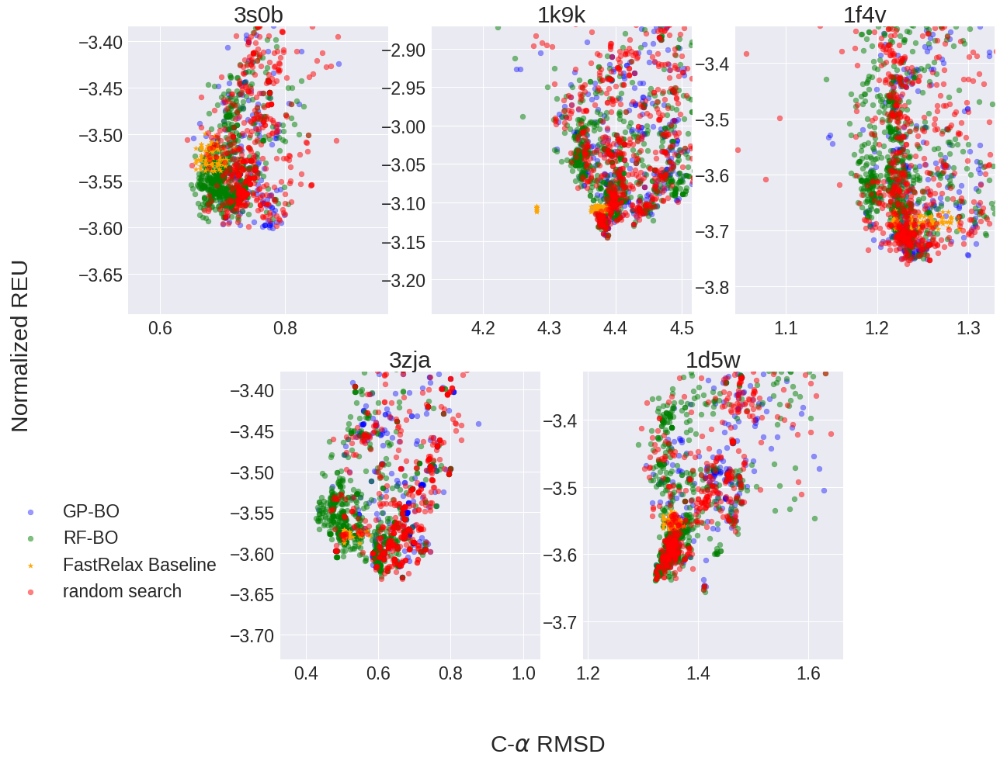

In [153]:
### SCATTER ZOOMED ALL 
from mpl_toolkits.axes_grid1.inset_locator import zoomed_inset_axes, mark_inset
fig = plt.figure(figsize=(20,15))
ax1 = plt.subplot2grid(shape=(2,6), loc=(0,0), colspan=2)
ax2 = plt.subplot2grid((2,6), (0,2), colspan=2)
ax3 = plt.subplot2grid((2,6), (0,4), colspan=2)
ax4 = plt.subplot2grid((2,6), (1,1), colspan=2)
ax5 = plt.subplot2grid((2,6), (1,3), colspan=2)
#fig.suptitle('Convergence of optimization loss')
fig.supxlabel(r"C-$\alpha$ RMSD")
fig.supylabel("Normalized REU")

#plt.ylabel('REU', fontsize=16)
i = 0
axs = [ax1, ax2, ax3, ax4, ax5]
#axs = axs.reshape(-1)
xmin=[35.344,]
xmax=[35.6,]
ymin=[4.3,]
ymax=[4.6,]
for prot in bench_dict.keys():
    axs[i].set_title(prot[:-2])
    r = get("../results/latest/cycles/optimize_cyclic_7_"+prot+"_ca_rmsdno_pose.pkl")
    gp = get("../results/latest/cycles/optimize_cyclic_7_"+prot+"_GPno_pose.pkl")
    d = get("../results/latest/random_search/dummy_150_"+prot+"_no_pose.pkl")
    rf = r.iloc[:900]
    gp = gp.iloc[:900]
    dum = d.iloc[:900]
    frb: pd.DataFrame = get("../results/latest/baseline/FRB_"+prot+".pkl")
    dummy_ca = []
    dummy_ref = []
    for _ in range(90):
        sample = frb.sample(6)
        dummy_ref.append(sample.ref15.min())
        dummy_ca.append(sample.ca_rmsd.min())
    axs[i].scatter(gp.ca_rmsd, gp.ref15, c=gp_color,alpha=0.4, label='GP-BO')
    axs[i].scatter(rf.ca_rmsd, rf.ref15,  c=rf_color,alpha=0.5,label='RF-BO')
    axs[i].scatter(dummy_ca, dummy_ref, c=fr_color, marker='*', label="FastRelax Baseline")
    axs[i].scatter(dum.ca_rmsd, dum.ref15, c=rs_color,alpha=0.5, label='random search')

    axs[i].set_ylim(rf.ref15.min()-0.1, rf.ref15.quantile(0.8))
    axs[i].set_xlim(rf.ca_rmsd.min()-0.1,rf.ca_rmsd.quantile(0.9))

    if i == 0:
        axs[i].legend(bbox_to_anchor=(0.4,-0.6))
    i+=1
    #break
plt.subplots_adjust(wspace=0.4)
plt.savefig(IMG_PATH+"ZOOM_SCATTER_MINIMUM_REU_CA_NO_GROUP_900.png", dpi=300)

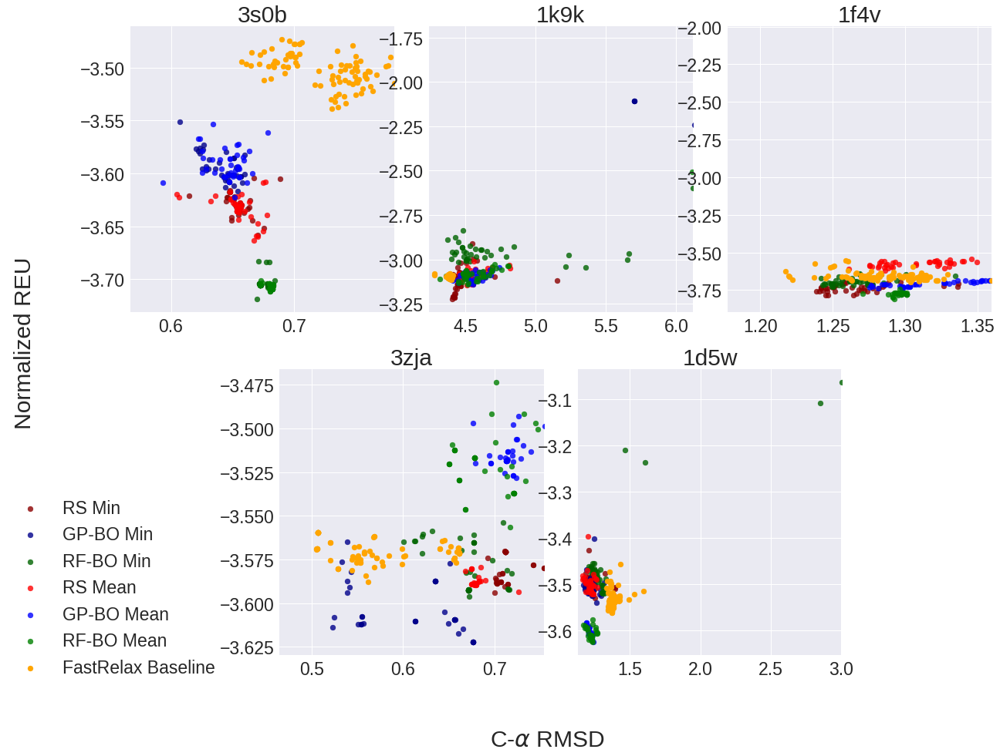

In [173]:
### SCATTER BEST MIN/MEAN
from mpl_toolkits.axes_grid1.inset_locator import zoomed_inset_axes, mark_inset
fig = plt.figure(figsize=(20,15))
ax1 = plt.subplot2grid(shape=(2,6), loc=(0,0), colspan=2)
ax2 = plt.subplot2grid((2,6), (0,2), colspan=2)
ax3 = plt.subplot2grid((2,6), (0,4), colspan=2)
ax4 = plt.subplot2grid((2,6), (1,1), colspan=2)
ax5 = plt.subplot2grid((2,6), (1,3), colspan=2)
#fig.suptitle('Convergence of optimization loss')
fig.supxlabel(r"C-$\alpha$ RMSD")
fig.supylabel("Normalized REU")

i = 0
axs = [ax1, ax2, ax3, ax4, ax5]
#axs = axs.reshape(-1)
xmin=[35.344,]
xmax=[35.6,]
ymin=[4.3,]
ymax=[4.6,]
for prot in bench_dict.keys():
    axs[i].set_title(prot[:-2])
    with open('../results/'+prot+'rf_best_mean.pkl', 'rb') as h:
        rfmean = pickle.load( h)
    with open('../results/'+prot+'gp_best_mean.pkl', 'rb') as h:
        gpmean = pickle.load( h)
    with open('../results/'+prot+'rs_best_mean.pkl', 'rb') as h:
        rsmean = pickle.load( h)
    with open('../results/'+prot+'rf_best_min.pkl', 'rb') as h:
        rfmin= pickle.load( h)
    with open('../results/'+prot+'gp_best_min.pkl', 'rb') as h:
        gpmin= pickle.load(h)
    with open('../results/'+prot+'rs_best_min.pkl', 'rb') as h:
        rsmin =pickle.load( h)  
        #print(c.nsmallest(1, "ca_rmsd")[fa_reps].values[0])
    frb: pd.DataFrame = get("../results/latest/baseline/FRB_"+prot+".pkl")

    axs[i].scatter(rsmin.ca_rmsd, rsmin.ref15, c='dark'+rs_color,alpha=0.8, label='RS Min')
    axs[i].scatter(gpmin.ca_rmsd, gpmin.ref15, c='dark'+gp_color,alpha=0.8, label='GP-BO Min')
    axs[i].scatter(rfmin.ca_rmsd, rfmin.ref15,  c='dark'+rf_color,alpha=0.8,label='RF-BO Min')
    axs[i].scatter(rsmean.ca_rmsd, rsmean.ref15, c=rs_color,alpha=0.8, label='RS Mean')
    axs[i].scatter(gpmean.ca_rmsd, gpmean.ref15, c=gp_color,alpha=0.8, label='GP-BO Mean')
    axs[i].scatter(rfmean.ca_rmsd, rfmean.ref15,  c=rf_color,alpha=0.8,label='RF-BO Mean')
    axs[i].scatter(frb.ca_rmsd, frb.ref15, c=fr_color, label='FastRelax Baseline ')
    
    axs[i].set_xlim(min([rsmin.ca_rmsd.min(),
                         frb.ca_rmsd.min(),
                         gpmin.ca_rmsd.min(),
                         rfmin.ca_rmsd.min(),])-0.04,
                    max([rsmin.ca_rmsd.max(),
                         frb.ca_rmsd.max(),
                        
                         rfmin.ca_rmsd.max(),]))

    if i == 0:
        axs[i].legend( bbox_to_anchor=(0.4,-0.6))
    i+=1
    #break
plt.subplots_adjust(wspace=0.3)
plt.savefig(IMG_PATH+"SCATTER_MinMean_SINGLE_BEST_CONFIGS.png", dpi=300)

### Optimize REF15

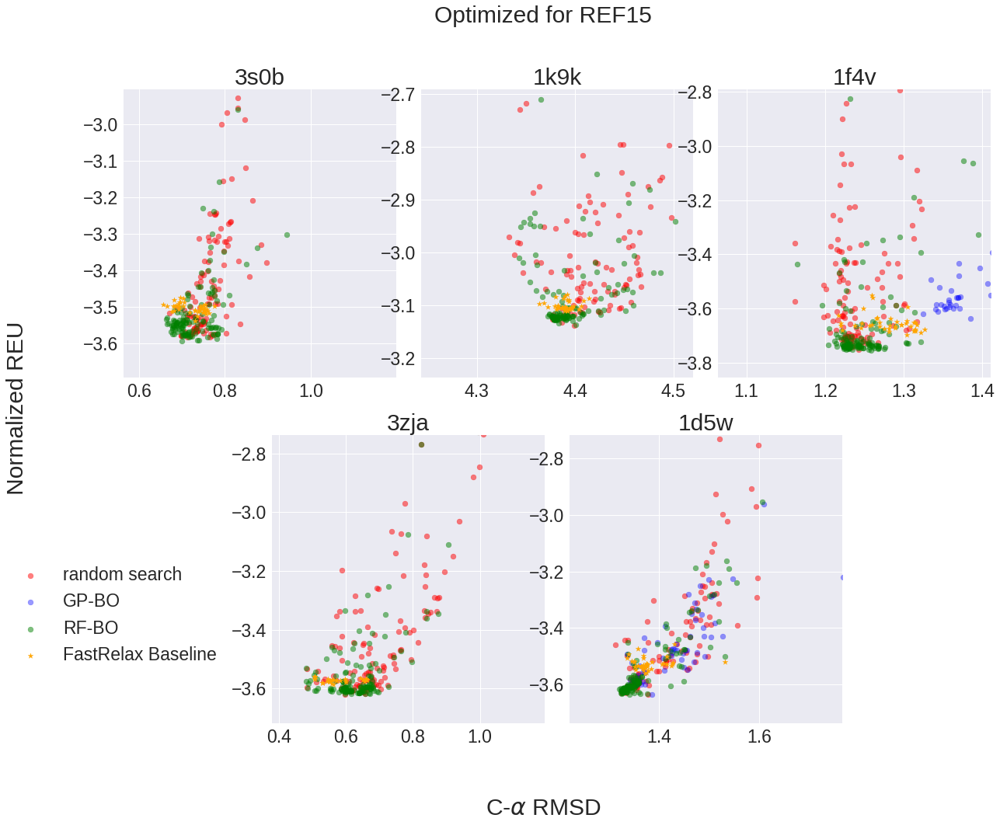

In [151]:
### SCATTER ZOOMED OPTIMIZED FOR REF15 vs RMSD
from mpl_toolkits.axes_grid1.inset_locator import zoomed_inset_axes, mark_inset
fig = plt.figure(figsize=(20,15))
ax1 = plt.subplot2grid(shape=(2,6), loc=(0,0), colspan=2)
ax2 = plt.subplot2grid((2,6), (0,2), colspan=2)
ax3 = plt.subplot2grid((2,6), (0,4), colspan=2)
ax4 = plt.subplot2grid((2,6), (1,1), colspan=2)
ax5 = plt.subplot2grid((2,6), (1,3), colspan=2)
fig.suptitle('Optimized for REF15')
fig.supxlabel(r"C-$\alpha$ RMSD")
fig.supylabel("Normalized REU")

#plt.ylabel('REU', fontsize=16)
i = 0
axs = [ax1, ax2, ax3, ax4, ax5]
#axs = axs.reshape(-1)
xmin=[35.344,]
xmax=[35.6,]
ymin=[4.3,]
ymax=[4.6,]
for prot in bench_dict.keys():
    axs[i].set_title(prot[:-2])
    r = get("../results/ref15_150_"+prot+".pkl")
    #gp = get("../results/latest/cycles/optimize_cyclic_7_"+prot+"_GPno_pose.pkl")
    d = get("../results/latest/random_search/dummy_150_"+prot+"_no_pose.pkl")
    rf = r.groupby('run').mean().iloc[:150]
    gp = gp.groupby('run').mean().iloc[:150]
    dum = d.groupby('run').mean().iloc[:150]
    frb: pd.DataFrame = get("../results/latest/baseline/FRB_40_"+prot+"_no_pose.pkl")
    axs[i].scatter(dum.ca_rmsd, dum.ref15, c=rs_color,alpha=0.5, label='random search')
    axs[i].scatter(gp.ca_rmsd, gp.ref15, c=gp_color,alpha=0.4, label='GP-BO')
    axs[i].scatter(rf.ca_rmsd, rf.ref15,  c=rf_color,alpha=0.5,label='RF-BO')
    axs[i].scatter(frb.ca_rmsd, frb.ref15, c=fr_color, marker='*', label="FastRelax Baseline")

    axs[i].set_ylim(rf.ref15.min()-0.1, rf.ref15.quantile(0.9))
    axs[i].set_xlim(rf.ca_rmsd.min()-0.1,rf.ca_rmsd.quantile(0.95))

    if i == 0:
        axs[i].legend(bbox_to_anchor=(0.4,-0.6))
    i+=1
    #break
fig.axes
plt.savefig(IMG_PATH+"ZOOM_SCATTER_REF15_REU_CA_150.png", dpi=300)

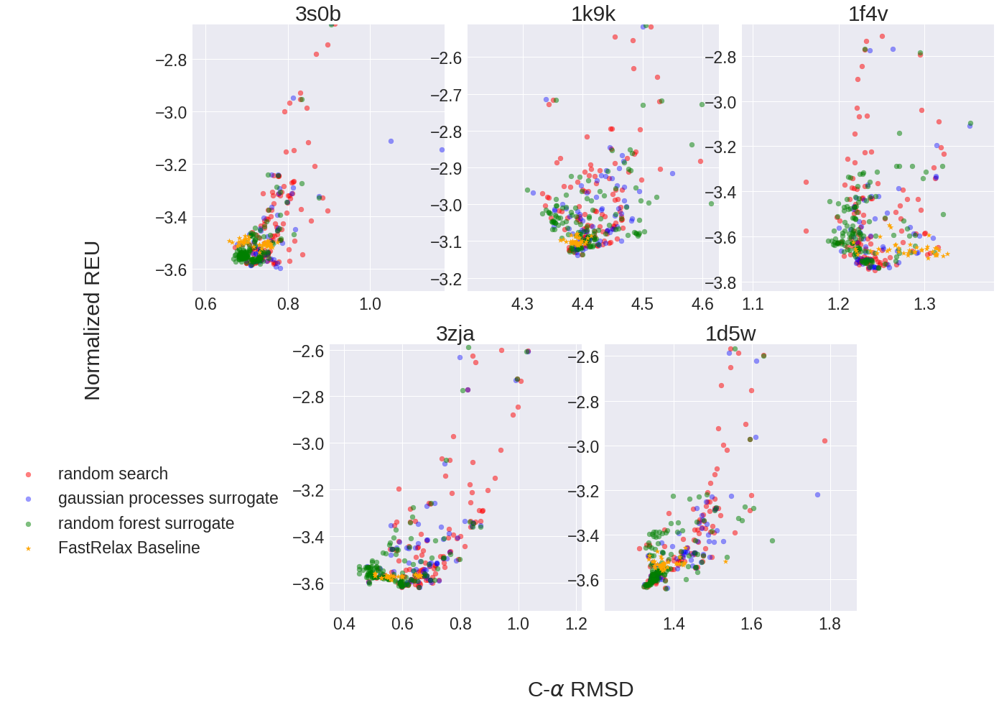

In [149]:
### SCATTER ZOOMED
from mpl_toolkits.axes_grid1.inset_locator import zoomed_inset_axes, mark_inset
fig = plt.figure(figsize=(20,15))
ax1 = plt.subplot2grid(shape=(2,6), loc=(0,0), colspan=2)
ax2 = plt.subplot2grid((2,6), (0,2), colspan=2)
ax3 = plt.subplot2grid((2,6), (0,4), colspan=2)
ax4 = plt.subplot2grid((2,6), (1,1), colspan=2)
ax5 = plt.subplot2grid((2,6), (1,3), colspan=2)
#fig.suptitle('Convergence of optimization loss')
fig.supxlabel(r"C-$\alpha$ RMSD")
fig.supylabel("Normalized REU")
#plt.ylabel('REU', fontsize=16)
i = 0
axs = [ax1, ax2, ax3, ax4, ax5]
#axs = axs.reshape(-1)
xmin=[35.344,]
xmax=[35.6,]
ymin=[4.3,]
ymax=[4.6,]
for prot in bench_dict.keys():
    axs[i].set_title(prot[:-2])
    r = get("../results/latest/cycles/optimize_cyclic_7_"+prot+"_ca_rmsdno_pose.pkl")
    gp = get("../results/latest/cycles/optimize_cyclic_7_"+prot+"_GPno_pose.pkl")
    d = get("../results/latest/random_search/dummy_150_"+prot+"_no_pose.pkl")
    rf = r.groupby('run').mean().iloc[:150]
    gp = gp.groupby('run').mean().iloc[:150]
    dum = d.groupby('run').mean().iloc[:150]
    frb: pd.DataFrame = get("../results/latest/baseline/FRB_40_"+prot+"_no_pose.pkl")
    axs[i].scatter(dum.ca_rmsd, dum.ref15, c=rs_color,alpha=0.5, label='random search')
    axs[i].scatter(gp.ca_rmsd, gp.ref15, c=gp_color,alpha=0.4, label='gaussian processes surrogate')
    axs[i].scatter(rf.ca_rmsd, rf.ref15,  c=rf_color,alpha=0.5,label='random forest surrogate')
    axs[i].scatter(frb.ca_rmsd, frb.ref15, c=fr_color, marker='*', label="FastRelax Baseline")
    #axins = zoomed_inset_axes(axs[i], zoom=20, loc='center right')
    #axins.scatter(dum.torsion_rmsd, dum.ca_rmsd, c="red",alpha=0.5, label='random search')
    #axins.scatter(gp.torsion_rmsd, gp.ca_rmsd, c='blue',alpha=0.2, label='gaussian processes surrogate')
    #axins.scatter(rf.torsion_rmsd, rf.ca_rmsd,  c='green',alpha=0.5,label='random forest surrogate')
    #axins.scatter(frb.torsion_rmsd, frb.ca_rmsd, c='black', marker='+', label="FastRelax Baseline")
    axs[i].set_ylim(rf.ref15.min()-0.1, rf.ref15.quantile(0.9))
    axs[i].set_xlim(rf.ca_rmsd.min()-0.1,rf.ca_rmsd.quantile(0.95))
    #plt.xticks(visible=False)
    #plt.yticks(visible=False)
    #mark_inset(axs[i], axins, loc1=2, loc2=4, fc="none", ec="0.5")
    if i == 0:
        axs[i].legend(bbox_to_anchor=(0.4,-0.6))
    i+=1
    #break
fig.axes
plt.savefig(IMG_PATH+"ZOOM_SCATTER_REU_RMSD_150.png", dpi=300)

### TORSION vs. CA

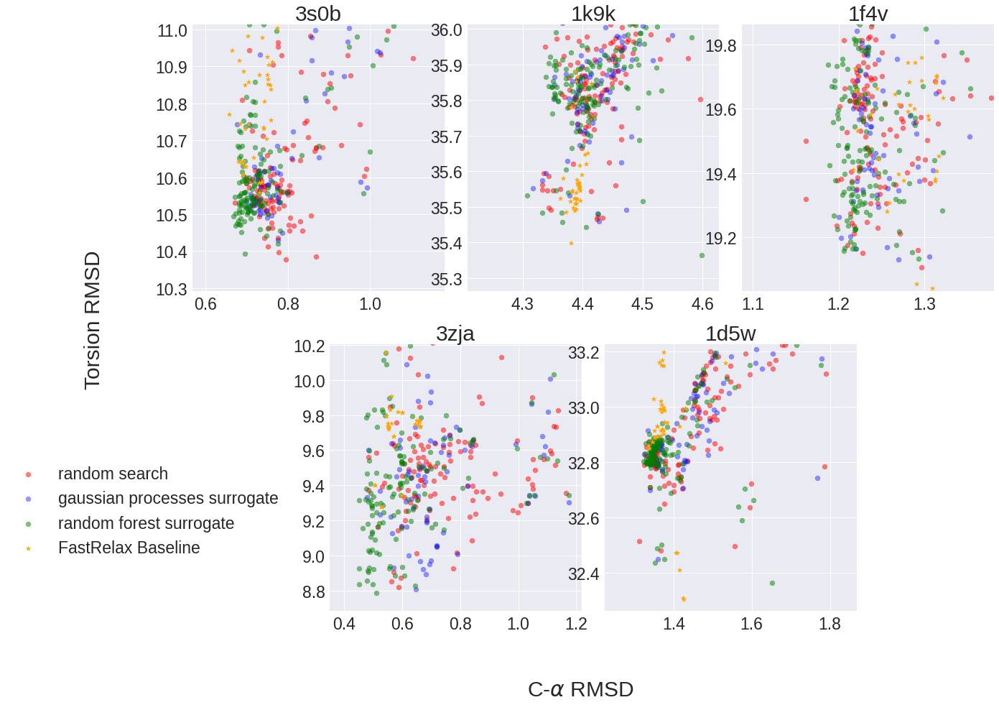

In [148]:
### SCATTER ZOOMED
from mpl_toolkits.axes_grid1.inset_locator import zoomed_inset_axes, mark_inset
fig = plt.figure(figsize=(20,15))
ax1 = plt.subplot2grid(shape=(2,6), loc=(0,0), colspan=2)
ax2 = plt.subplot2grid((2,6), (0,2), colspan=2)
ax3 = plt.subplot2grid((2,6), (0,4), colspan=2)
ax4 = plt.subplot2grid((2,6), (1,1), colspan=2)
ax5 = plt.subplot2grid((2,6), (1,3), colspan=2)
#fig.suptitle('Convergence of optimization loss')
fig.supxlabel(r"C-$\alpha$ RMSD")
fig.supylabel("Torsion RMSD")
#plt.ylabel('REU', fontsize=16)
i = 0
axs = [ax1, ax2, ax3, ax4, ax5]
#axs = axs.reshape(-1)
xmin=[35.344,]
xmax=[35.6,]
ymin=[4.3,]
ymax=[4.6,]
for prot in bench_dict.keys():
    axs[i].set_title(prot[:-2])
    r = get("../results/latest/cycles/optimize_cyclic_7_"+prot+"_ca_rmsdno_pose.pkl")
    gp = get("../results/latest/cycles/optimize_cyclic_7_"+prot+"_GPno_pose.pkl")
    d = get("../results/latest/random_search/dummy_150_"+prot+"_no_pose.pkl")
    rf = r.groupby('run').mean().iloc[:150]
    gp = gp.groupby('run').mean().iloc[:150]
    dum = d.groupby('run').mean().iloc[:150]
    frb: pd.DataFrame = get("../results/latest/baseline/FRB_40_"+prot+"_no_pose.pkl")
    axs[i].scatter(dum.ca_rmsd, dum.torsion_rmsd, c=rs_color,alpha=0.5, label='random search')
    axs[i].scatter(gp.ca_rmsd, gp.torsion_rmsd, c=gp_color,alpha=0.4, label='gaussian processes surrogate')
    axs[i].scatter(rf.ca_rmsd, rf.torsion_rmsd,  c=rf_color,alpha=0.5,label='random forest surrogate')
    axs[i].scatter(frb.ca_rmsd, frb.torsion_rmsd, c=fr_color, marker='*', label="FastRelax Baseline")
    #axins = zoomed_inset_axes(axs[i], zoom=20, loc='center right')
    #axins.scatter(dum.torsion_rmsd, dum.ca_rmsd, c="red",alpha=0.5, label='random search')
    #axins.scatter(gp.torsion_rmsd, gp.ca_rmsd, c='blue',alpha=0.2, label='gaussian processes surrogate')
    #axins.scatter(rf.torsion_rmsd, rf.ca_rmsd,  c='green',alpha=0.5,label='random forest surrogate')
    #axins.scatter(frb.torsion_rmsd, frb.ca_rmsd, c='black', marker='+', label="FastRelax Baseline")
    axs[i].set_ylim(rf.torsion_rmsd.min()-0.1, rf.torsion_rmsd.quantile(0.9))
    axs[i].set_xlim(rf.ca_rmsd.min()-0.1,rf.ca_rmsd.quantile(0.95))
    #plt.xticks(visible=False)
    #plt.yticks(visible=False)
    #mark_inset(axs[i], axins, loc1=2, loc2=4, fc="none", ec="0.5")
    if i == 0:
        axs[i].legend(bbox_to_anchor=(0.4,-0.6))
    i+=1
    #break
fig.axes
plt.savefig(IMG_PATH+"ZOOM_SCATTER_TORSION_CA_150.png", dpi=300)

### SCATTER CYCLES

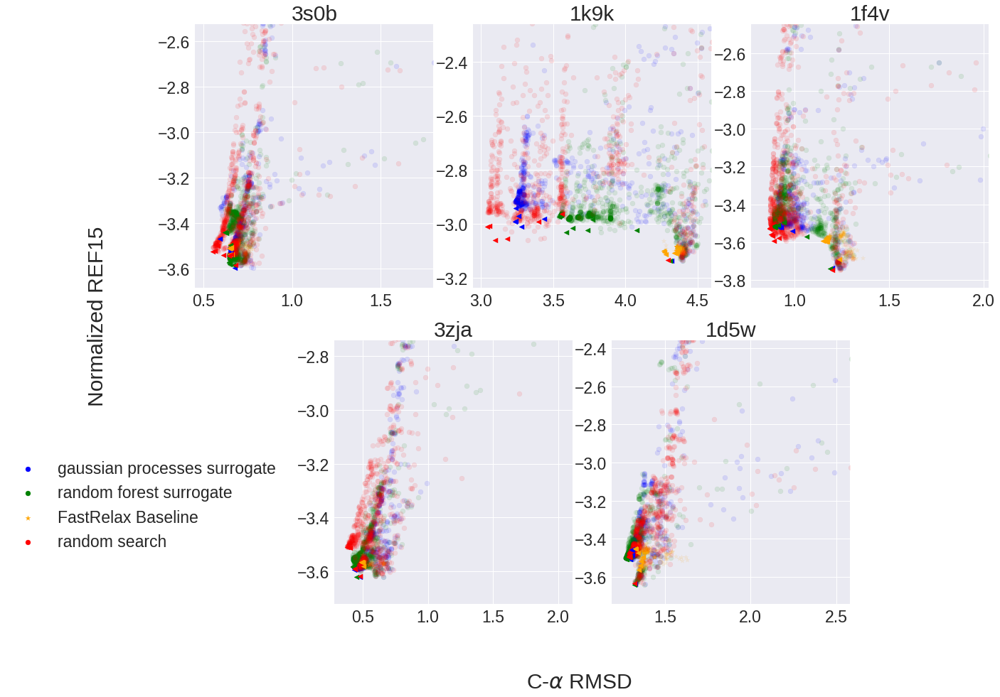

In [147]:
### SCATTER CYCLES
from mpl_toolkits.axes_grid1.inset_locator import zoomed_inset_axes, mark_inset
fig = plt.figure(figsize=(20,15))
ax1 = plt.subplot2grid(shape=(2,6), loc=(0,0), colspan=2)
ax2 = plt.subplot2grid((2,6), (0,2), colspan=2)
ax3 = plt.subplot2grid((2,6), (0,4), colspan=2)
ax4 = plt.subplot2grid((2,6), (1,1), colspan=2)
ax5 = plt.subplot2grid((2,6), (1,3), colspan=2)
#fig.suptitle('Convergence of optimization loss')
fig.supxlabel(r"C-$\alpha$ RMSD")
fig.supylabel("Normalized REF15")
#plt.ylabel('REU', fontsize=16)
i = 0
axs = [ax1, ax2, ax3, ax4, ax5]
#axs = axs.reshape(-1)
xmin=[35.344,]
xmax=[35.6,]
ymin=[4.3,]
ymax=[4.6,]
for prot in bench_dict.keys():
    name = prot[:-2]
    axs[i].set_title(prot[:-2])
    r = get("../results/latest/cycles/optimize_cyclic_7_"+prot+"_ca_rmsdno_pose.pkl")
    gp = get("../results/latest/cycles/optimize_cyclic_7_"+prot+"_GPno_pose.pkl")
    d = from_txt('../results/'+name+'.txt')
    d['cycle'] = d.run.astype(int) // 151
    rf = r.groupby('run').mean()
    gp = gp.groupby('run').mean()
    dum = d.groupby('run').mean()
    frb: pd.DataFrame = get("../results/FastRelax_248_cycles_"+prot+".pkl")
    # PLOT ALL
    axs[i].scatter(gp.ca_rmsd, gp.ref15, c=gp_color,alpha=0.1, label='gaussian processes surrogate')
    axs[i].scatter(rf.ca_rmsd, rf.ref15,  c=rf_color,alpha=0.1,label='random forest surrogate')
    axs[i].scatter(frb.ca_rmsd, frb.ref15, c=fr_color,alpha=0.1, marker='*', label="FastRelax Baseline")
    axs[i].scatter(dum.ca_rmsd, dum.ref15, c=rs_color,alpha=0.1, label='random search')
    # PLOT WAYPOINTS
    gp.groupby('cycle').min('ca_rmsd')[['ca_rmsd', 'ref15']].plot(kind='scatter', x='ca_rmsd', y='ref15', ax=axs[i], c=gp_color, marker='<', s=50)
    rf.groupby('cycle').min('ca_rmsd')[['ca_rmsd', 'ref15']].plot(kind='scatter', x='ca_rmsd', y='ref15', ax=axs[i], c=rf_color, marker='<', s=50)
    frb.groupby('cycle').min('ca_rmsd')[['ca_rmsd', 'ref15']].plot(kind='scatter', x='ca_rmsd', y='ref15', ax=axs[i], c=fr_color, marker='<', s=50)
    dum.groupby('cycle').min('ca_rmsd')[['ca_rmsd', 'ref15']].plot(kind='scatter', x='ca_rmsd', y='ref15', ax=axs[i], c=rs_color, marker='<', s=50)

    axs[i].set_ylim(rf.ref15.min()-0.1, rf.ref15.quantile(0.9))
    axs[i].set_xlim(dum.ca_rmsd.min()-0.1,dum.ca_rmsd.quantile(0.95))
    axs[i].set_xlabel("")
    axs[i].set_ylabel("")
    if i == 0:
        leg = axs[i].legend(bbox_to_anchor=(0.4,-0.6))
        for lh in leg.legendHandles: 
            lh.set_alpha(1)
    i+=1
    #break
    
plt.subplots_adjust(wspace=0.4)
plt.savefig(IMG_PATH+"ZOOM_SCATTER_REU_RMSD_CYCLES_150.png", dpi=300)

### SCATTER CYCLES MEAN STD

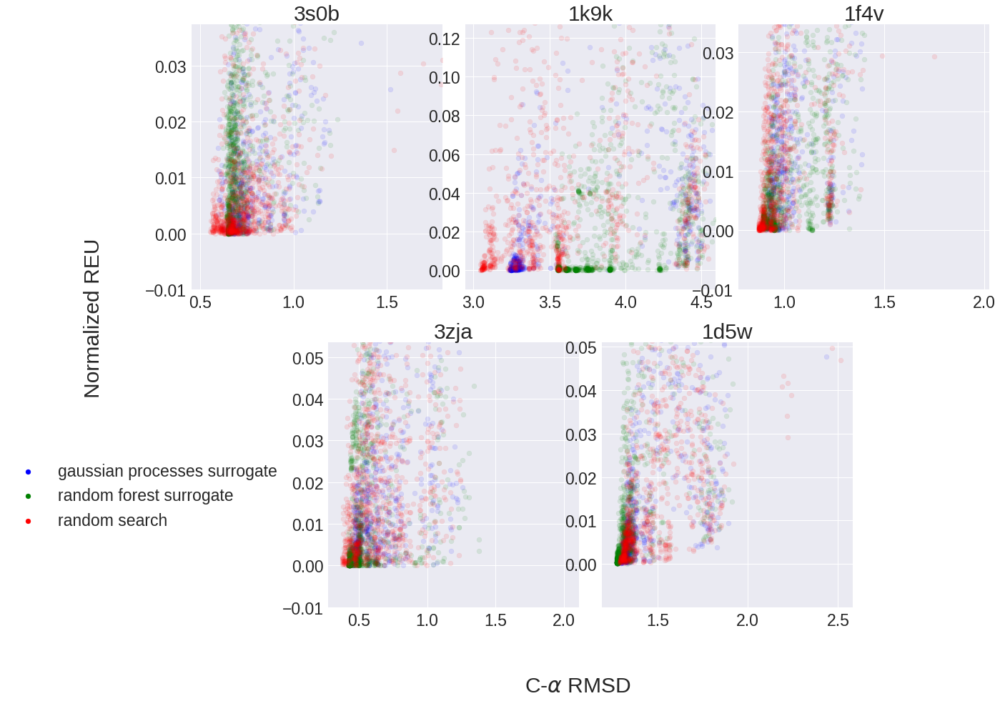

In [146]:
### SCATTER CYCLES MEAN STD
from mpl_toolkits.axes_grid1.inset_locator import zoomed_inset_axes, mark_inset
fig = plt.figure(figsize=(20,15))
ax1 = plt.subplot2grid(shape=(2,6), loc=(0,0), colspan=2)
ax2 = plt.subplot2grid((2,6), (0,2), colspan=2)
ax3 = plt.subplot2grid((2,6), (0,4), colspan=2)
ax4 = plt.subplot2grid((2,6), (1,1), colspan=2)
ax5 = plt.subplot2grid((2,6), (1,3), colspan=2)
#fig.suptitle('Convergence of optimization loss')
fig.supxlabel(r"C-$\alpha$ RMSD")
fig.supylabel("Normalized REU")
#plt.ylabel('REU', fontsize=16)
i = 0
axs = [ax1, ax2, ax3, ax4, ax5]
#axs = axs.reshape(-1)
xmin=[35.344,]
xmax=[35.6,]
ymin=[4.3,]
ymax=[4.6,]
for prot in bench_dict.keys():
    name = prot[:-2]
    axs[i].set_title(prot[:-2])
    r = get("../results/latest/cycles/optimize_cyclic_7_"+prot+"_ca_rmsdno_pose.pkl")
    g = get("../results/latest/cycles/optimize_cyclic_7_"+prot+"_GPno_pose.pkl")
    d = from_txt('../results/'+name+'.txt')
    rf = r.groupby('run').mean()
    gp = g.groupby('run').mean()
    dum = d.groupby('run').mean()
    rfstd = r.groupby('run').std()
    gpstd = g.groupby('run').std()
    dumstd = d.groupby('run').std()
  
    #dum.index = dum.index.astype(int)
    #frb: pd.DataFrame = get("../results/FastRelax_248_cycles_"+prot+".pkl")
    axs[i].scatter(gp.ca_rmsd, gpstd.ca_rmsd, c=gp_color,alpha=0.1, label='gaussian processes surrogate')
    axs[i].scatter(rf.ca_rmsd, rfstd.ca_rmsd,  c=rf_color,alpha=0.1,label='random forest surrogate')
    #axs[i].scatter(frb.ca_rmsd, frb.ca_rmsd, c=fr_color, marker='*', label="FastRelax Baseline")
    axs[i].scatter(dum.ca_rmsd, dumstd.ca_rmsd, c=rs_color,alpha=0.1, label='random search')

    #axins = zoomed_inset_axes(axs[i], zoom=20, loc='center right')
    #axins.scatter(dum.torsion_rmsd, dum.ca_rmsd, c="red",alpha=0.5, label='random search')
    #axins.scatter(gp.torsion_rmsd, gp.ca_rmsd, c='blue',alpha=0.2, label='gaussian processes surrogate')
    #axins.scatter(rf.torsion_rmsd, rf.ca_rmsd,  c='green',alpha=0.5,label='random forest surrogate')
    #axins.scatter(frb.torsion_rmsd, frb.ca_rmsd, c='black', marker='+', label="FastRelax Baseline")
    axs[i].set_ylim(rfstd.ca_rmsd.min()-0.01, rfstd.ca_rmsd.quantile(0.9))
    axs[i].set_xlim(dum.ca_rmsd.min()-0.1,dum.ca_rmsd.quantile(0.95))
    #plt.xticks(visible=False)
    #plt.yticks(visible=False)
    #mark_inset(axs[i], axins, loc1=2, loc2=4, fc="none", ec="0.5")
    if i == 0:
        leg = axs[i].legend(bbox_to_anchor=(0.4,-0.6))
        for lh in leg.legendHandles: 
            lh.set_alpha(1)
    i+=1
    #break
    
fig.axes
plt.savefig(IMG_PATH+"ZOOM_SCATTER_MEAN_STD_CYCLES_150.png", dpi=300)

# Distribution of Solutions

### CA_RMSD Hist

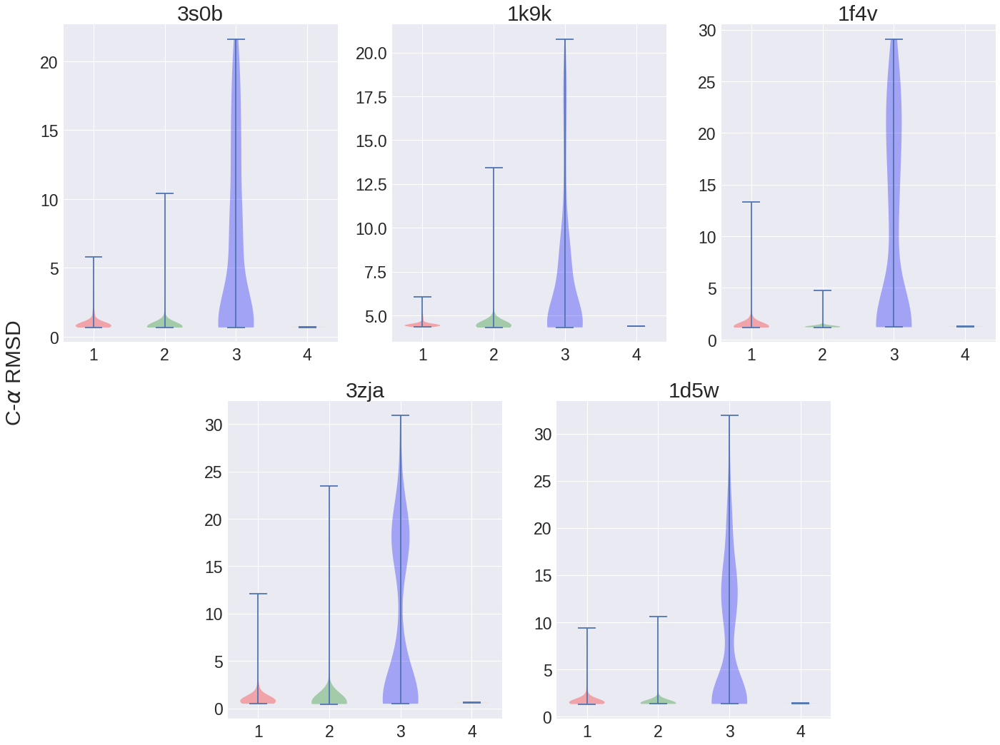

In [15]:
### Distribution
from mpl_toolkits.axes_grid1.inset_locator import zoomed_inset_axes, mark_inset
fig = plt.figure(figsize=(20,15))
ax1 = plt.subplot2grid(shape=(2,6), loc=(0,0), colspan=2)
ax2 = plt.subplot2grid((2,6), (0,2), colspan=2)
ax3 = plt.subplot2grid((2,6), (0,4), colspan=2)
ax4 = plt.subplot2grid((2,6), (1,1), colspan=2)
ax5 = plt.subplot2grid((2,6), (1,3), colspan=2)
#fig.suptitle('Convergence of optimization loss')
fig.supylabel(r"C-$\alpha$ RMSD")
#fig.supylabel("Count", fontsize=24)
#plt.ylabel('REU', fontsize=16)
i = 0
axs = [ax1, ax2, ax3, ax4, ax5]
labels=['RS',  'RF-BO', 'GP-BO', 'FastRelax']
for prot in bench_dict.keys():
    axs[i].set_title(prot[:-2])
    r = get("../results/latest/cycles/optimize_cyclic_7_"+prot+"_ca_rmsdno_pose.pkl")
    gp = get("../results/latest/cycles/optimize_cyclic_7_"+prot+"_GPno_pose.pkl")
    d = get("../results/latest/random_search/dummy_150_"+prot+"_no_pose.pkl")
    rf = r.groupby('run').mean().iloc[:150]
    gp = gp.groupby('run').mean().iloc[:150]
    dum = d.groupby('run').mean().iloc[:150]
    #dum = dum.where(dum.ca_rmsd < 5)
    #rf = rf.where(rf.ca_rmsd < 5)
    #gp = gp.where(gp.ca_rmsd < 5)

    frb: pd.DataFrame = get("../results/latest/baseline/FRB_40_"+prot+"_no_pose.pkl")
    dummy_means = []
    for _ in range(50):
        sample = frb.sample(6)
        dummy_means.append(sample.ca_rmsd.mean())
    bp = axs[i].violinplot([dum.ca_rmsd,rf.ca_rmsd, gp.ca_rmsd, dummy_means],  [1, 2, 3, 4])
    colors = [rs_color, rf_color, gp_color,fr_color]
    for patch, c in zip(bp['bodies'], colors):
        patch.set_facecolor(c)
    #axs[i].set_yscale('log')   
    #axs[i].set_ylim(rf.ca_rmsd.min()-0.01, d.ca_rmsd.quantile(0.9))
  
    i+=1
    #break
plt.tight_layout()
#plt.savefig(IMG_PATH+"HIST_RMSD_150.png", dpi=300)

### REF15 Hist

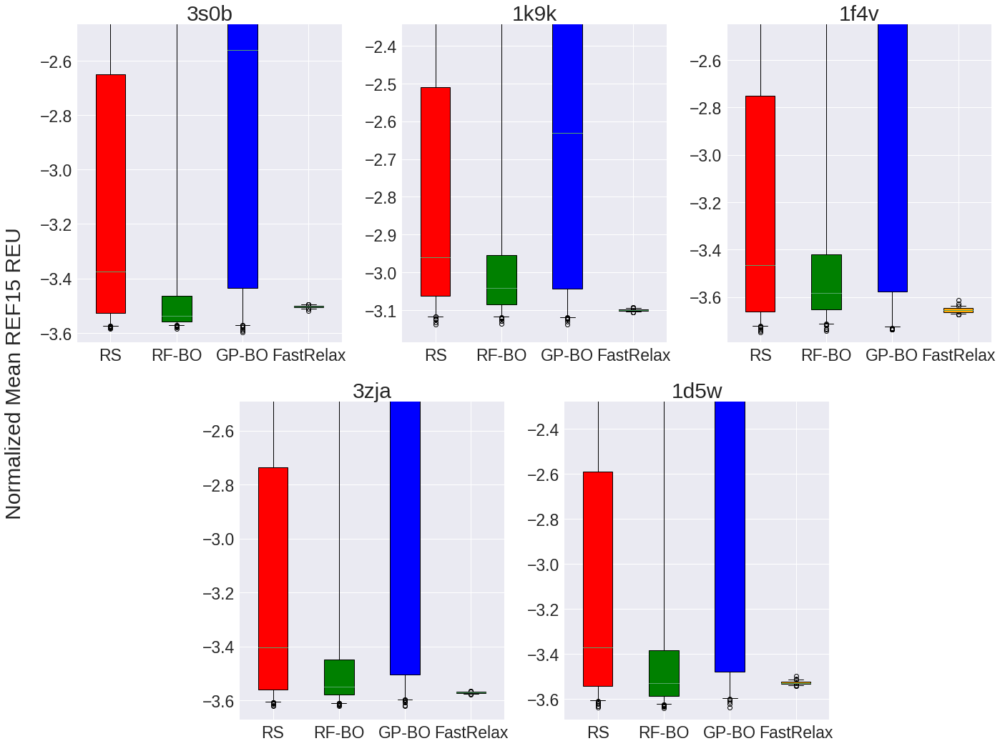

In [143]:
### Distribution
from mpl_toolkits.axes_grid1.inset_locator import zoomed_inset_axes, mark_inset
fig = plt.figure(figsize=(20,15))
ax1 = plt.subplot2grid(shape=(2,6), loc=(0,0), colspan=2)
ax2 = plt.subplot2grid((2,6), (0,2), colspan=2)
ax3 = plt.subplot2grid((2,6), (0,4), colspan=2)
ax4 = plt.subplot2grid((2,6), (1,1), colspan=2)
ax5 = plt.subplot2grid((2,6), (1,3), colspan=2)
#fig.suptitle('Convergence of optimization loss')
fig.supylabel("Normalized Mean REF15 REU")
#fig.supylabel("Count", fontsize=24)
i = 0
axs = [ax1, ax2, ax3, ax4, ax5]
labels=['RS',  'RF-BO', 'GP-BO', 'FastRelax']
for prot in bench_dict.keys():
    axs[i].set_title(prot[:-2])
    r = get("../results/latest/cycles/optimize_cyclic_7_"+prot+"_ca_rmsdno_pose.pkl")
    gp = get("../results/latest/cycles/optimize_cyclic_7_"+prot+"_GPno_pose.pkl")
    d = get("../results/latest/random_search/dummy_150_"+prot+"_no_pose.pkl")
    rf = r.groupby('run').mean().iloc[:150]
    gp = gp.groupby('run').mean().iloc[:150]
    dum = d.groupby('run').mean().iloc[:150]
    frb: pd.DataFrame = get("../results/latest/baseline/FRB_40_"+prot+"_no_pose.pkl")
    dummy_means = []
    for _ in range(50):
        sample = frb.sample(6)
        dummy_means.append(sample.ref15.mean())
    bp = axs[i].boxplot([dum.ref15,rf.ref15, gp.ref15, dummy_means], patch_artist=True,labels=labels, whis=[5,95])
    colors = [rs_color, rf_color, gp_color,fr_color]
    for patch, c in zip(bp['boxes'], colors):
        patch.set_facecolor(c)
    #axs[i].set_yscale('log')   
    axs[i].set_ylim(rf.ref15.min()-0.05, d.ref15.quantile(0.8))
  
    i+=1
    #break
plt.tight_layout()
plt.savefig(IMG_PATH+"HIST_REF15_150.png", dpi=300)

## Compare complete_run_batch to greedy

- no improvement in waiting for complete run to finish. makes sense

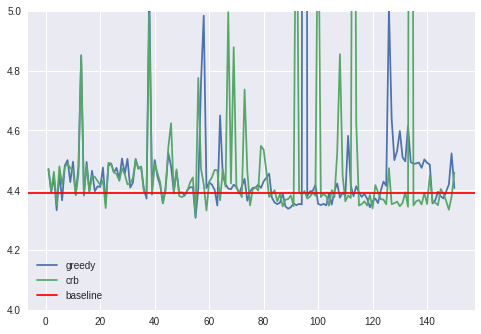

In [138]:
greedy = get('../results/latest/cycles/optimize_cyclic_7_1k9k_A_ca_rmsdno_pose.pkl')
cbr = get('../results/latest/cbr_150/waitFullRun_150_1k9k_A.pkl')

plt.plot(range(1,151),greedy.groupby('run').mean().iloc[:150].ca_rmsd, label='greedy')
plt.plot(range(1, 151),cbr.groupby('run').mean().iloc[:150].ca_rmsd, label='crb')
plt.axhline(get('../results/latest/baseline/FRB_40_1k9k_A_no_pose.pkl').ca_rmsd.mean(), c='red', label='baseline')
plt.legend()
plt.ylim(4,5)
plt.show()

## Plot Convergence of Loss Pre-Relaxed long runs.

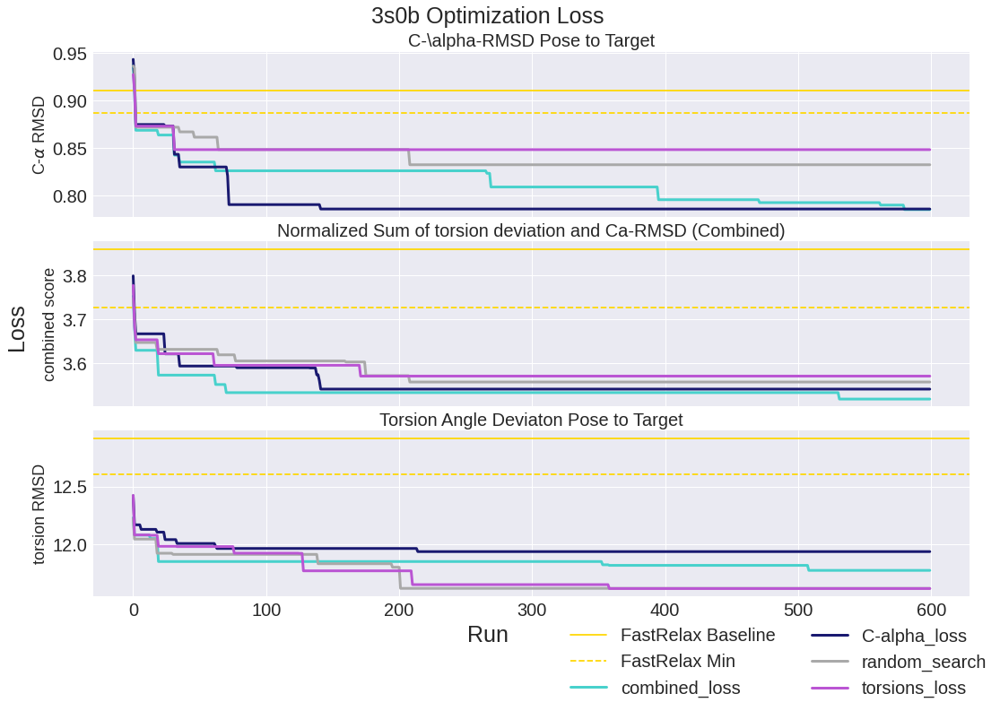

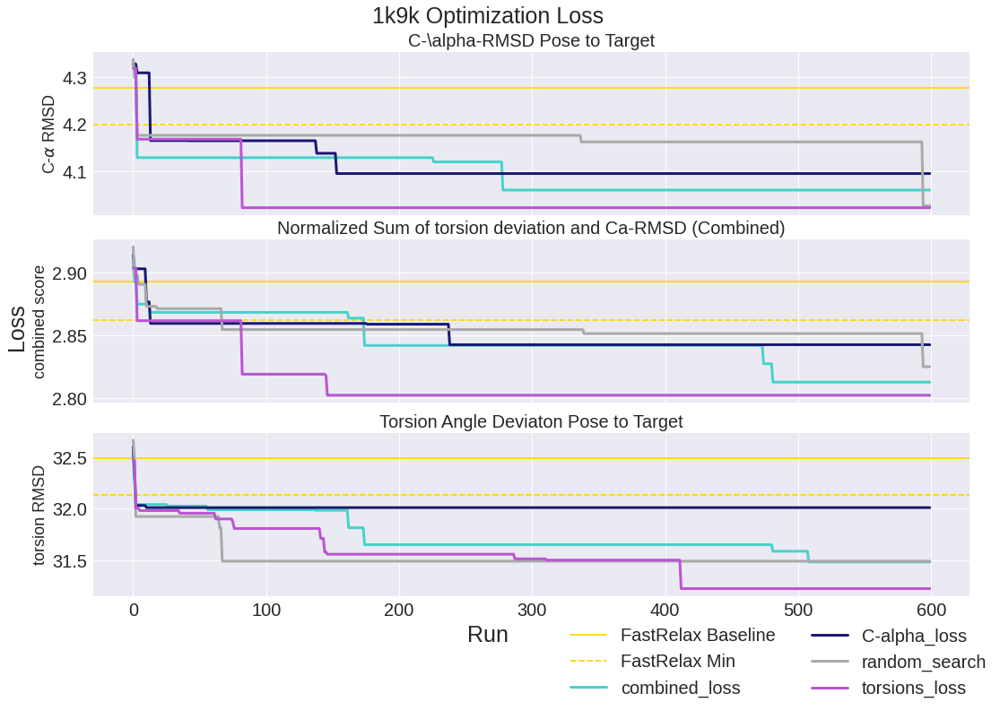

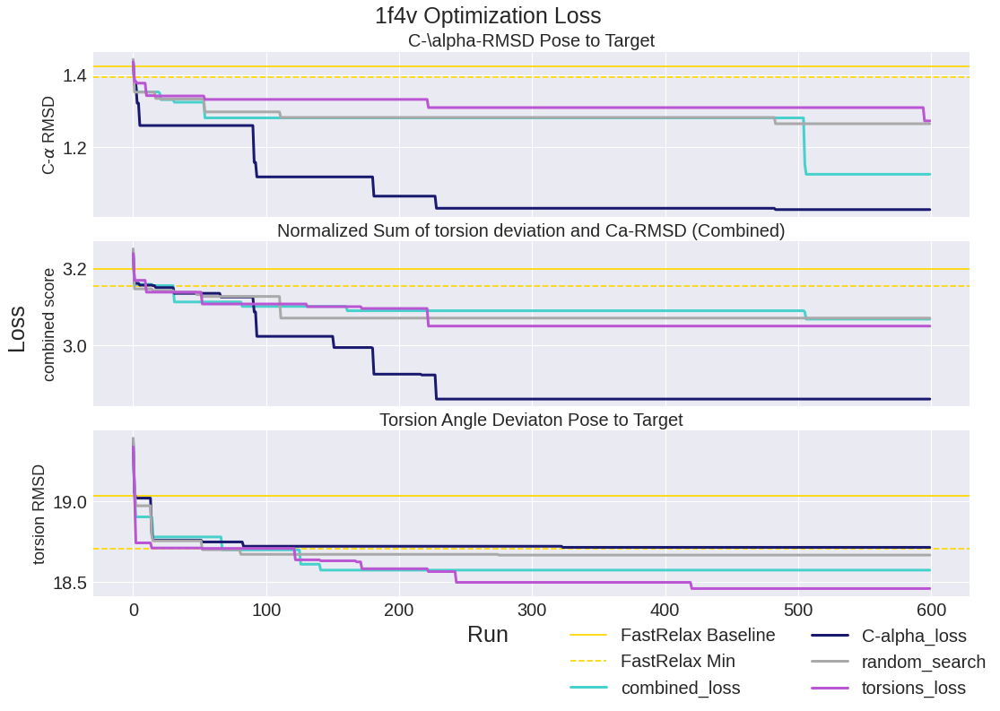

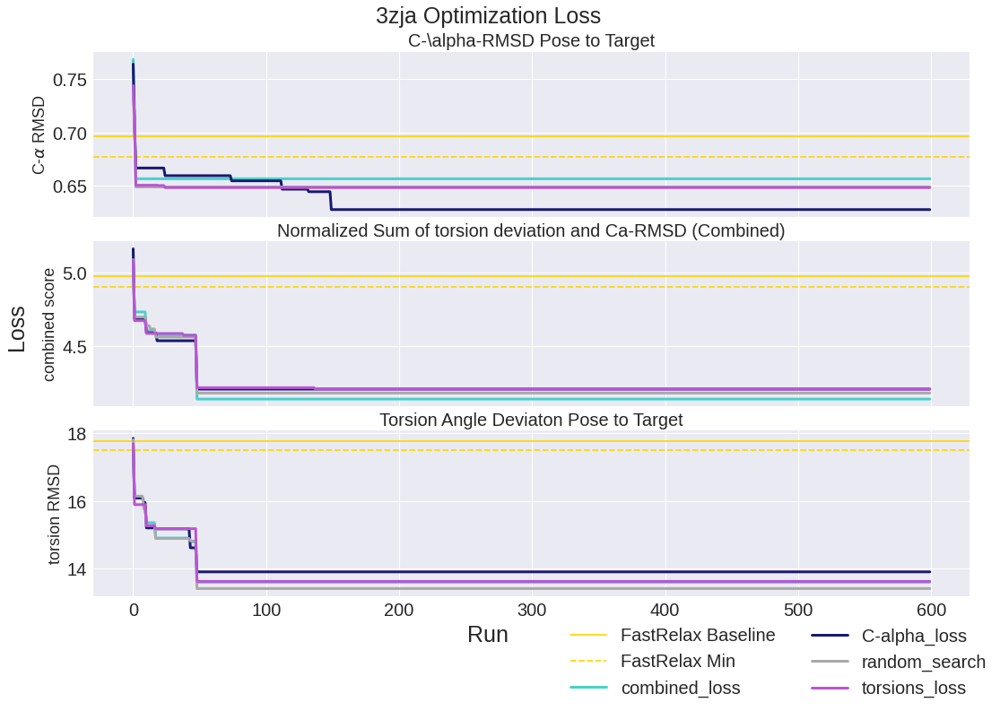

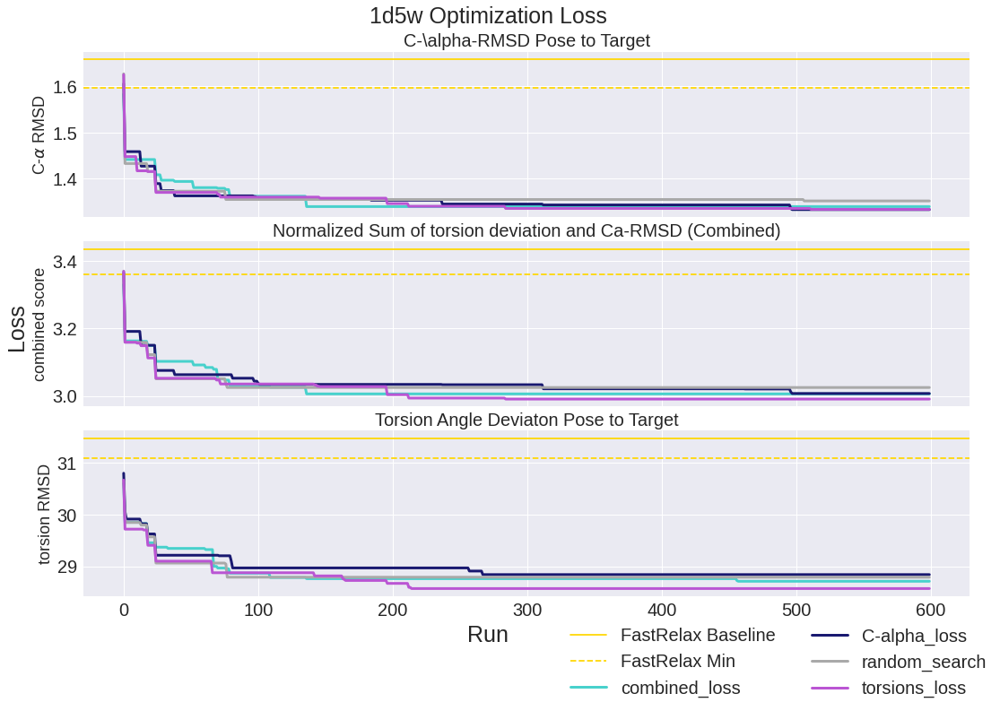

In [65]:
## Plot for each loss rmsd torsion and ref colored by loss
label_dict = {"rmsd": r"C-\alpha-RMSD Pose to Target",
             "torsions": "Torsion Angle Deviaton Pose to Target",
             "ref15": "Normalized REU Pose",
             "score": "Normalized Sum of torsion deviation and Ca-RMSD (Combined)"}
ws = 15

colors = {"C-alpha_loss": plt_rmsd_color, "torsions_loss":plt_torsion_color, "ref15":plt_rscore_color, 'combined_loss':plt_score_color, 'random_search':plt_dummy_color}
loss_labels = {'score': 'combined score', 'rmsd': r'C-$\alpha$ RMSD', 'torsions': 'torsion RMSD'}

for prot in bench_dict.keys():
    i=0
    of_rmsd, of_score, of_dummy, of_torsions, baseline, _, _, _ = load_res_for_prot(prot) # _ for initial rmsd and torsion
    fig, axs = plt.subplots(3,1, sharex=True, figsize=(15, 10), constrained_layout=True)
    fig.suptitle(prot[:-2]+' Optimization Loss')

    for loss in ['rmsd',  'score', 'torsions']:
        axs[i].set_title(label_dict[loss], size=20)
        axs[i].set_ylabel(loss_labels[loss], size=18) 
        sample_dist = []
        for _ in range(40):
            sample = baseline.sample(6)
            sample_dist.append( sample[loss].mean())
        sample_dist = pd.Series(sample_dist)
        axs[i].axhline(sample_dist.mean(), c=plt_baseline_color, linestyle='-', label="FastRelax Baseline")
        axs[i].axhline(sample_dist.min(), c=plt_baseline_color, linestyle='--', label="FastRelax Min")
        # axs[i].axhline(baseline[loss].max(), c=plt_baseline_color, linestyle=':', label="FastRelax Max")

        for df in [of_score, of_rmsd, of_dummy, of_torsions]:       
            #ldf = wind_std(df, loss, ws=ws, cut_percentile=0.9)
            #axs[i].plot(ldf.index, ldf.values, c=colors[df.name], label=df.name)
            axs[i].plot(range(len(df.groupby('run'))), make_convergence(df.groupby('run').mean(), loss),c=colors[df.name], linestyle='solid', linewidth=3, label=df.name)
        #axs[i].legend(prop={'size': 20})  
        axs[i].tick_params(labelsize=20)
        i += 1
    plt.xticks(fontsize=20)
    fig.supylabel("Loss")
    fig.supxlabel("Run")
    h, l = plt.gca().get_legend_handles_labels()
    by_label = dict(zip(l, h))
    fig.legend(by_label.values(), by_label.keys(), bbox_to_anchor=(0.8, -0.1), prop={'size': 20}, loc='lower center', ncol=2)
    plt.savefig(IMG_PATH+"RELAXED_OPTI_LONG_CONV_MEAN_LOSS"+prot+".png", dpi=300)
    plt.show()

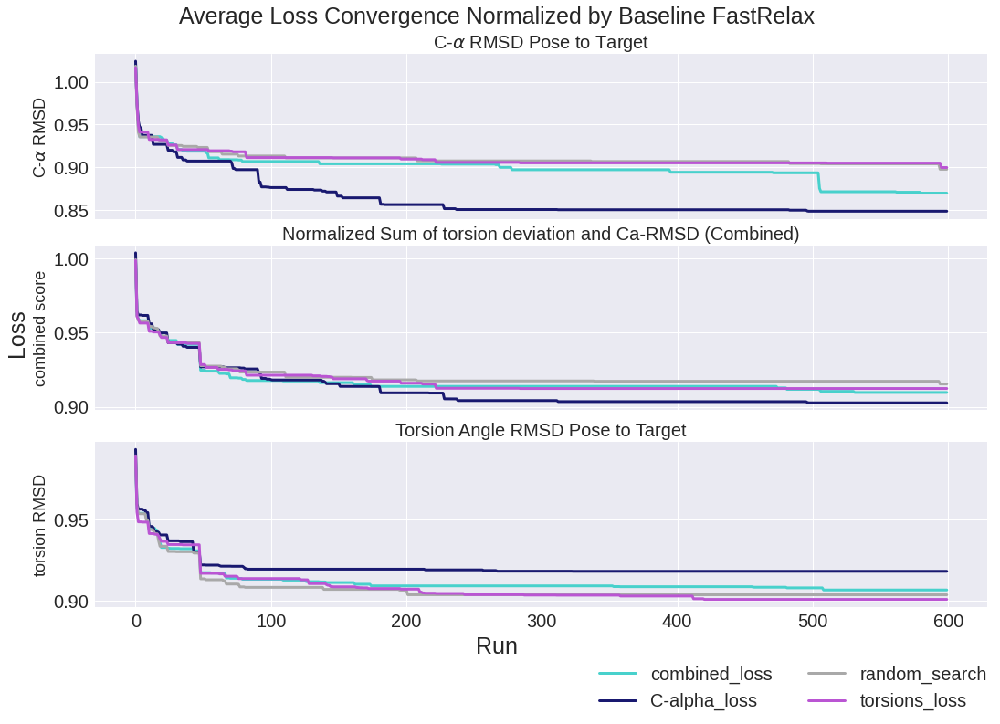

In [77]:
## Plot normalized by baseline for each loss rmsd torsion and ref colored by loss
label_dict = {"rmsd": r"C-$\alpha$ RMSD Pose to Target",
             "torsions": "Torsion Angle RMSD Pose to Target",
             "ref15": "Normalized REU Pose",
             "score": "Normalized Sum of torsion deviation and Ca-RMSD (Combined)"}
loss_labels = {'score': 'combined score', 'rmsd': r'C-$\alpha$ RMSD', 'torsions': 'torsion RMSD'}
ws = 15

colors = {"C-alpha_loss": plt_rmsd_color, "torsions_loss":plt_torsion_color, "ref15":plt_rscore_color, 'combined_loss':plt_score_color, 'random_search':plt_dummy_color}
fig, axs = plt.subplots(3,1, sharex=True, figsize=(15, 10), constrained_layout=True)
fig.suptitle('Average Loss Convergence Normalized by Baseline FastRelax')
rdict = {'rmsd': {"C-alpha_loss": np.zeros(600), "torsions_loss":np.zeros(600), "ref15":np.zeros(600), 'combined_loss':np.zeros(600), 'random_search':np.zeros(600)},
         'score': {"C-alpha_loss": np.zeros(600), "torsions_loss":np.zeros(600), "ref15":np.zeros(600), 'combined_loss':np.zeros(600), 'random_search':np.zeros(600)},
         'torsions': {"C-alpha_loss": np.zeros(600), "torsions_loss":np.zeros(600), "ref15":np.zeros(600), 'combined_loss':np.zeros(600), 'random_search':np.zeros(600)}}

for prot in bench_dict.keys():
    of_rmsd, of_score, of_dummy, of_torsions, baseline, _, _, _ = load_res_for_prot(prot) # _ for initial rmsd and torsion
    for loss in ['rmsd',  'score', 'torsions']:
        
        sample_dist = []
        for _ in range(40):
            sample = baseline.sample(6)
            sample_dist.append( sample[loss].mean())
        sample_dist = pd.Series(sample_dist)
        #axs[i].axhline(sample_dist.mean(), c=plt_baseline_color, linestyle='-', label="FastRelax Baseline")
        #axs[i].axhline(sample_dist.min(), c=plt_baseline_color, linestyle='--', label="FastRelax Min")

        for df in [of_score, of_rmsd, of_dummy, of_torsions]:
            
            rdict[loss][df.name] += np.array(make_convergence(df.groupby('run').mean(), loss)) / sample_dist.mean()
i = 0
for loss in ['rmsd',  'score', 'torsions']:
    axs[i].set_title(label_dict[loss], size=20)
    axs[i].set_ylabel(loss_labels[loss], size=18) 
    for df in [of_score, of_rmsd, of_dummy, of_torsions]:
        axs[i].plot(range(600), rdict[loss][df.name]/5,c=colors[df.name], linestyle='solid', linewidth=3, label=df.name+"")
        axs[i].tick_params(labelsize=20)
    i += 1
plt.xticks(fontsize=20)
fig.supylabel("Loss")
fig.supxlabel("Run")
h, l = plt.gca().get_legend_handles_labels()
by_label = dict(zip(l, h))
fig.legend(by_label.values(), by_label.keys(), bbox_to_anchor=(0.8, -0.1), prop={'size': 20}, loc='lower center', ncol=2)
plt.savefig(IMG_PATH+"RELAXED_OPTI_LONG_CONV_AVG_MEAN_NORMALIZED_LOSS.png", dpi=300)
plt.show()

## (Single Best / Group Mean) Performances per Optimization vs. Baseline

In [102]:
# Besties
metrics = metrics
for prot in benchmark_prots:
    of_rmsd, of_score, of_dummy, of_torsions, baseline, initial_rmsd, initial_torsions, initial_reu = load_res_for_prot(prot)
    df = pd.DataFrame(columns=metrics)
    df.loc['Initial', 'rmsd'] = initial_rmsd
    df.loc['Initial', 'torsions'] = initial_torsions
    df.loc['Initial', 'ref15'] = starting_reu
    df.loc['FastRelax'] = baseline[metrics].min()
    df.loc['RandomSearch'] = of_dummy[metrics].min()
    df.loc['RMSD'] = of_rmsd[metrics].min()
    df.loc['Torsions'] = of_torsions[metrics].min()
    df.loc['Score'] = of_score[metrics].min()
    df = df.style.set_caption(prot+' single run best')
    display(df)
    df = pd.DataFrame(columns=metrics)
    df.loc['Initial', 'rmsd'] = initial_rmsd
    df.loc['Initial', 'torsions'] = initial_torsions
    df.loc['Initial', 'ref15'] = starting_reu

    df.loc['FastRelax'] = baseline[metrics].mean()
    df.loc['RandomSearch'] = of_dummy.groupby('run').mean()[metrics].min()
    df.loc['RMSD'] = of_rmsd.groupby('run').mean()[metrics].min()
    df.loc['Torsions'] = of_torsions.groupby('run').mean()[metrics].min()
    df.loc['Score'] = of_score.groupby('run').mean()[metrics].min()
    df = df.style.set_caption(prot+' config mean best')
    display(df)

core.import_pose.import_pose: {0} File '../benchmark/allosteric/6q21A.pdb' automatically determined to be of type PDB
core.conformation.Conformation: {0} [ WARNING ] missing heavyatom:  OXT on residue LYS:CtermProteinFull 167
core.import_pose.import_pose: {0} File '../benchmark/allosteric/4q21A.pdb' automatically determined to be of type PDB
core.conformation.Conformation: {0} [ WARNING ] missing heavyatom:  OXT on residue LYS:CtermProteinFull 167
core.scoring.ScoreFunctionFactory: {0} SCOREFUNCTION: ref2015


,rmsd,torsions,score,ref15
Initial,1.676630,41.931104,nan,6.877726
FastRelax,1.294005,37.506924,2.679969,-2.774356
RandomSearch,1.142106,36.768231,2.500663,-2.814462
RMSD,1.123584,36.994178,2.503614,-2.839680
Torsions,1.114155,36.693405,2.506908,-2.790401
Score,1.124285,36.559548,2.463871,-2.825392


,rmsd,torsions,score,ref15
Initial,1.676630,41.931104,nan,6.877726
FastRelax,1.601384,39.239056,2.825297,-2.702486
RandomSearch,1.267460,37.724101,2.598840,-2.743352
RMSD,1.263621,37.657874,2.576993,-2.784047
Torsions,1.269263,37.512062,2.577178,-2.717538
Score,1.246218,37.587242,2.559504,-2.728586


core.import_pose.import_pose: {0} File '../benchmark/allosteric/1lfaA.pdb' automatically determined to be of type PDB
core.conformation.Conformation: {0} [ WARNING ] missing heavyatom:  OXT on residue THR:CtermProteinFull 173
core.import_pose.import_pose: {0} File '../benchmark/allosteric/1MQ9.clean.pdb' automatically determined to be of type PDB
core.conformation.Conformation: {0} [ WARNING ] missing heavyatom:  OXT on residue THR:CtermProteinFull 173
core.conformation.Conformation: {0} Found disulfide between residues 160 167
core.conformation.Conformation: {0} current variant for 160 CYS
core.conformation.Conformation: {0} current variant for 167 CYS
core.conformation.Conformation: {0} current variant for 160 CYD
core.conformation.Conformation: {0} current variant for 167 CYD
core.scoring.ScoreFunctionFactory: {0} SCOREFUNCTION: ref2015


,rmsd,torsions,score,ref15
Initial,3.178540,24.280041,nan,-1.216861
FastRelax,2.880975,26.120718,3.107157,-3.258338
RandomSearch,1.987056,24.720812,2.822617,-3.296790
RMSD,1.848680,25.048001,2.842170,-3.289618
Torsions,1.668437,24.732690,2.773442,-3.289778
Score,2.368445,24.711876,2.983924,-3.296666


,rmsd,torsions,score,ref15
Initial,3.178540,24.280041,nan,-1.216861
FastRelax,3.127166,27.270117,3.234391,-3.190832
RandomSearch,2.712807,25.518784,3.032702,-3.278434
RMSD,2.925592,25.768953,3.060976,-3.259369
Torsions,2.585222,25.398164,3.018755,-3.266775
Score,2.917941,25.618405,3.066630,-3.270008


core.import_pose.import_pose: {0} File '../benchmark/allosteric/1d5wA.pdb' automatically determined to be of type PDB
core.chemical.Patch: {0} [ WARNING ] Patch AcetylatedNtermProteinFull implies it can apply to residue type pdb_PHD, but actually applying it fails with error message:
core.chemical.Patch: {0} [ WARNING ] 

File: /home/benchmark/rosetta/source/src/core/chemical/MutableResidueType.cc:860
[ ERROR ] UtilityExitException
ERROR: Can't add atom named `OP1` to ResidueType pdb_PHD as it already has one with that name.
core.chemical.Patch: {0} [ WARNING ]    You may want to check your patch definitions.
core.conformation.Conformation: {0} [ WARNING ] missing heavyatom:  CG  on residue MET:NtermProteinFull 1
core.conformation.Conformation: {0} [ WARNING ] missing heavyatom:  SD  on residue MET:NtermProteinFull 1
core.conformation.Conformation: {0} [ WARNING ] missing heavyatom:  CE  on residue MET:NtermProteinFull 1
core.conformation.Conformation: {0} [ WARNING ] missing heavyatom

,rmsd,torsions,score,ref15
Initial,1.254439,29.958866,nan,0.080646
FastRelax,1.502161,30.172343,3.251650,-3.067726
RandomSearch,1.319332,28.488853,2.985839,-3.052207
RMSD,1.312050,28.550122,2.982172,-3.060463
Torsions,1.291947,28.184830,2.959333,-3.077389
Score,1.306827,28.392092,2.974039,-3.077783


,rmsd,torsions,score,ref15
Initial,1.254439,29.958866,nan,0.080646
FastRelax,1.654469,31.451409,3.438178,-3.020597
RandomSearch,1.352149,28.788739,3.024847,-3.042268
RMSD,1.333496,28.839204,3.007139,-3.040021
Torsions,1.334102,28.569745,2.990668,-3.046354
Score,1.339976,28.710305,3.005938,-3.044332


core.import_pose.import_pose: {0} File '../benchmark/allosteric/1f4vA.pdb' automatically determined to be of type PDB
core.import_pose.import_pose: {0} File '../benchmark/allosteric/3CHY.clean.pdb' automatically determined to be of type PDB
core.scoring.ScoreFunctionFactory: {0} SCOREFUNCTION: ref2015


,rmsd,torsions,score,ref15
Initial,1.219575,18.808879,nan,-0.369262
FastRelax,1.340898,18.326611,3.089112,-3.289008
RandomSearch,0.973656,18.035688,2.841147,-3.304092
RMSD,0.914485,18.135156,2.768304,-3.290071
Torsions,1.011682,18.179724,2.839898,-3.306874
Score,0.996711,18.138922,2.870343,-3.301439


,rmsd,torsions,score,ref15
Initial,1.219575,18.808879,nan,-0.369262
FastRelax,1.421582,19.045441,3.192780,-3.211943
RandomSearch,1.264200,18.667738,3.070744,-3.259696
RMSD,1.025364,18.715760,2.860472,-3.247085
Torsions,1.272106,18.459514,3.050000,-3.265040
Score,1.123586,18.574101,3.068127,-3.282329


core.import_pose.import_pose: {0} File '../benchmark/allosteric/1k9kA.pdb' automatically determined to be of type PDB
core.import_pose.import_pose: {0} File '../benchmark/allosteric/1K9P.clean.pdb' automatically determined to be of type PDB
core.scoring.ScoreFunctionFactory: {0} SCOREFUNCTION: ref2015


,rmsd,torsions,score,ref15
Initial,4.519983,33.594228,nan,-0.594554
FastRelax,4.068244,31.470040,2.788628,-2.812956
RandomSearch,3.710897,30.345253,2.768111,-2.824712
RMSD,3.746194,31.362952,2.758878,-2.852627
Torsions,3.744472,30.647696,2.711087,-2.858570
Score,3.807935,31.098651,2.772687,-2.816329


,rmsd,torsions,score,ref15
Initial,4.519983,33.594228,nan,-0.594554
FastRelax,4.279783,32.473996,2.891807,-2.748775
RandomSearch,4.025955,31.490682,2.825016,-2.817922
RMSD,4.094544,32.009262,2.842493,-2.807598
Torsions,4.021988,31.225005,2.802378,-2.822021
Score,4.059482,31.483197,2.812796,-2.805033


core.import_pose.import_pose: {0} File '../benchmark/allosteric/3s0bA.pdb' automatically determined to be of type PDB
core.conformation.Conformation: {0} Found disulfide between residues 17 49
core.conformation.Conformation: {0} current variant for 17 CYS
core.conformation.Conformation: {0} current variant for 49 CYS
core.conformation.Conformation: {0} current variant for 17 CYD
core.conformation.Conformation: {0} current variant for 49 CYD
core.conformation.Conformation: {0} Found disulfide between residues 88 106
core.conformation.Conformation: {0} current variant for 88 CYS
core.conformation.Conformation: {0} current variant for 106 CYS
core.conformation.Conformation: {0} current variant for 88 CYD
core.conformation.Conformation: {0} current variant for 106 CYD
core.import_pose.import_pose: {0} File '../benchmark/allosteric/3S0A.clean.pdb' automatically determined to be of type PDB
core.conformation.Conformation: {0} Found disulfide between residues 17 49
core.conformation.Conformat

,rmsd,torsions,score,ref15
Initial,0.733233,9.880639,nan,-0.539599
FastRelax,0.833150,11.980895,3.600697,-3.147829
RandomSearch,0.786315,11.348574,3.472789,-3.154922
RMSD,0.753943,11.142470,3.371057,-3.175821
Torsions,0.788036,11.110524,3.427632,-3.146685
Score,0.757253,11.091439,3.373442,-3.176121


,rmsd,torsions,score,ref15
Initial,0.733233,9.880639,nan,-0.539599
FastRelax,0.912106,12.902073,3.858149,-3.080289
RandomSearch,0.832412,11.613690,3.557801,-3.135285
RMSD,0.785937,11.933423,3.541682,-3.132089
Torsions,0.848286,11.612063,3.571254,-3.117572
Score,0.785328,11.770043,3.519022,-3.139664


core.import_pose.import_pose: {0} File '../benchmark/allosteric/3zjaA.pdb' automatically determined to be of type PDB
core.import_pose.import_pose: {0} File '../benchmark/allosteric/3ZK0.clean.pdb' automatically determined to be of type PDB
core.scoring.ScoreFunctionFactory: {0} SCOREFUNCTION: ref2015


,rmsd,torsions,score,ref15
Initial,0.426976,10.600329,nan,-1.135612
FastRelax,0.657187,16.997074,4.788295,-3.165569
RandomSearch,0.558555,12.285342,3.621475,-3.189208
RMSD,0.544533,11.929756,3.523691,-3.191016
Torsions,0.608690,12.943963,4.008973,-3.188616
Score,0.599354,12.964334,3.880778,-3.190562


,rmsd,torsions,score,ref15
Initial,0.426976,10.600329,nan,-1.135612
FastRelax,0.697739,17.754719,4.984699,-3.126994
RandomSearch,0.649111,13.400605,4.180834,-3.171565
RMSD,0.627875,13.895517,4.207342,-3.176845
Torsions,0.648494,13.613198,4.207527,-3.173736
Score,0.656770,13.587394,4.139714,-3.178989


# Parameter Distributions

## CONFIGS

### PCA

KeyError: "None of [Index(['fa_rep_0', 'fa_rep_1', 'fa_rep_2', 'fa_rep_3', 'fa_rep_4', 'fa_rep_5',\n       'fa_rep_6'],\n      dtype='object')] are in the [columns]"

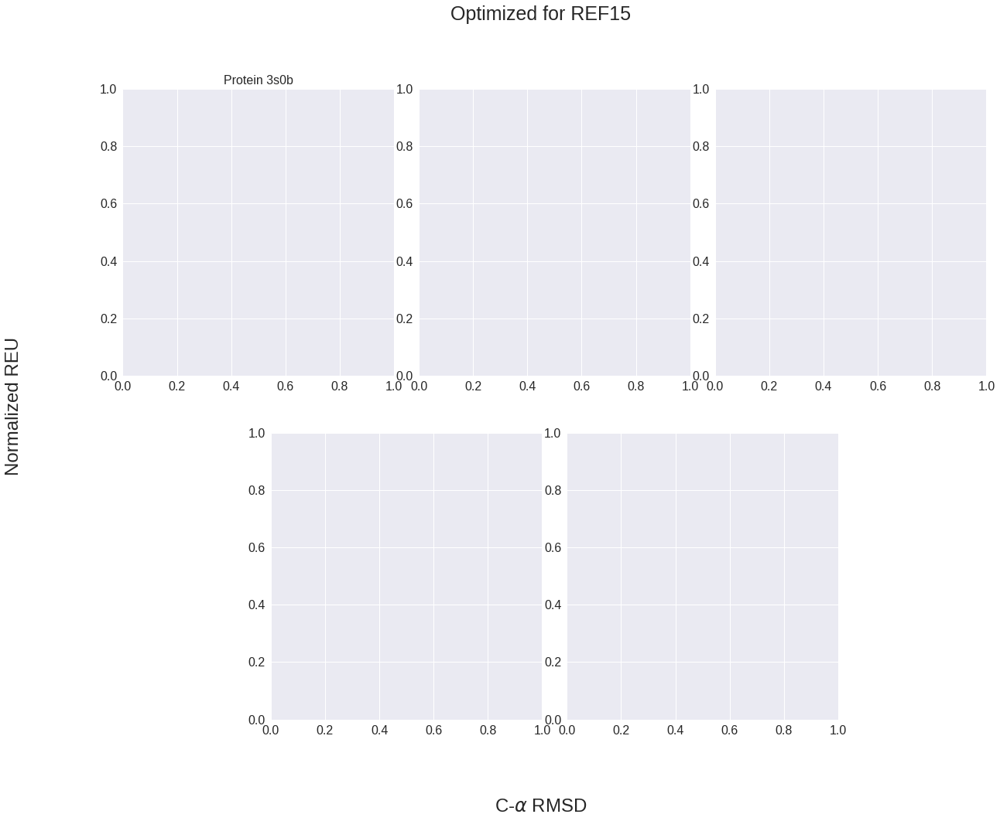

In [275]:
from sklearn.decomposition import PCA

fig = plt.figure(figsize=(20,15))
ax1 = plt.subplot2grid(shape=(2,6), loc=(0,0), colspan=2)
ax2 = plt.subplot2grid((2,6), (0,2), colspan=2)
ax3 = plt.subplot2grid((2,6), (0,4), colspan=2)
ax4 = plt.subplot2grid((2,6), (1,1), colspan=2)
ax5 = plt.subplot2grid((2,6), (1,3), colspan=2)
fig.suptitle('Optimized for REF15')
fig.supxlabel(r"C-$\alpha$ RMSD",fontsize=24)
fig.supylabel("Normalized REU", fontsize=24)
plt.rc('xtick', labelsize=16)
plt.rc('ytick', labelsize=16)
#plt.ylabel('REU', fontsize=16)
i = 0
axs = [ax1, ax2, ax3, ax4, ax5]
#axs = axs.reshape(-1)
xmin=[35.344,]
xmax=[35.6,]
ymin=[4.3,]
ymax=[4.6,]
for prot in bench_dict.keys():
    axs[i].set_title("Protein "+prot[:-2], fontsize=16)
    r = get("../results/ref15_150_"+prot+".pkl")
    #gp = get("../results/latest/cycles/optimize_cyclic_7_"+prot+"_GPno_pose.pkl")
    d = get("../results/latest/random_search/dummy_150_"+prot+"_no_pose.pkl")
    rf = r.groupby('run').mean().iloc[:150]
    gp = gp.groupby('run').mean().iloc[:150]
    dum = d.groupby('run').mean().iloc[:150]
    frb: pd.DataFrame = get("../results/latest/baseline/FRB_40_"+prot+"_no_pose.pkl")
    # You must normalize the data before applying the fit method
    df_normalized=(rf - rf.mean()) / rf.std()
    pca = PCA(n_components=df[fa_reps].shape[1])
    pca.fit(df_normalized)

    # Reformat and view results
    loadings = pandas.DataFrame(pca.components_.T,
    columns=['PC%s' % _ for _ in range(len(df_normalized.columns))],
    index=df.columns)
    print(loadings)

    plot.plot(pca.explained_variance_ratio_)
    plot.ylabel('Explained Variance')
    plot.xlabel('Components')
    if i == 0:
        axs[i].legend(fontsize=16, bbox_to_anchor=(0.4,-0.6))
    i+=1
    #break
fig.axes
#plt.savefig(IMG_PATH+"ZOOM_SCATTER_REF15_REU_CA_150.png", dpi=300)



### Best Configs

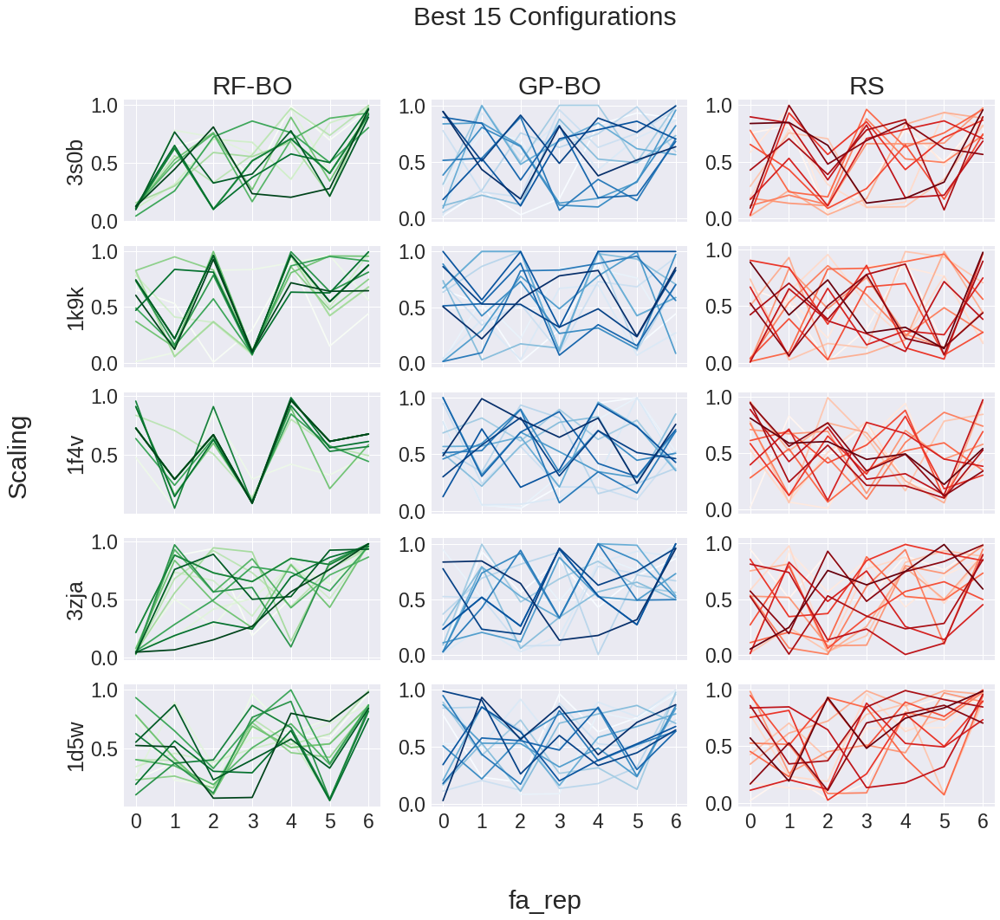

In [181]:
### Best Configs 150
fig, axs = plt.subplots(5, 3, sharex=True, figsize=(18,15))
#fig.suptitle('Convergence of optimization loss')
fig.supxlabel("fa_rep")
fig.supylabel("Scaling")
n = 15
fig.suptitle('Best '+ str(n)+ ' Configurations')

#plt.ylabel('REU', fontsize=16)
i = 0
#plt.xticks(range(7), range(7))


for prot in bench_dict.keys():
    axs[i][0].set_ylabel(prot[:-2])
    r = get("../results/latest/cycles/optimize_cyclic_7_"+prot+"_ca_rmsdno_pose.pkl")
    r= make_fa_reps(r).groupby('run').mean().iloc[:150]
    r.nsmallest(n, 'ca_rmsd').reset_index()[fa_reps].T.plot(ax=axs[i][0], cmap='Greens', xticks=range(7))
    d = get("../results/latest/random_search/dummy_150_"+prot+"_no_pose.pkl")
    d= make_fa_reps(d).groupby('run').mean().iloc[:150]
    d.nsmallest(n, 'ca_rmsd').reset_index()[fa_reps].T.plot(ax=axs[i][2], cmap='Reds', xticks=range(7))
    

    if i == 0:
        axs[i][0].set_title('RF-BO')
        axs[i][1].set_title('GP-BO')
        axs[i][2].set_title('RS')
                    
        
    r = get("../results/latest/cycles/optimize_cyclic_7_"+prot+"_GPno_pose.pkl")
    r= make_fa_reps(r).groupby('run').mean().iloc[:150]
   
    
    r.nsmallest(n, 'ca_rmsd').reset_index()[fa_reps].T.plot(ax=axs[i][1], cmap='Blues')
    axs[i][1].set_xticklabels(['0','1','2','3','4','5','6'])
    axs[i][0].legend([])
    axs[i][1].legend([])
    axs[i][2].legend([])
            
    i += 1
plt.savefig(IMG_PATH+'BEST_'+str(n)+'_CONFIGS.png', dpi=300)

### WORST Configs

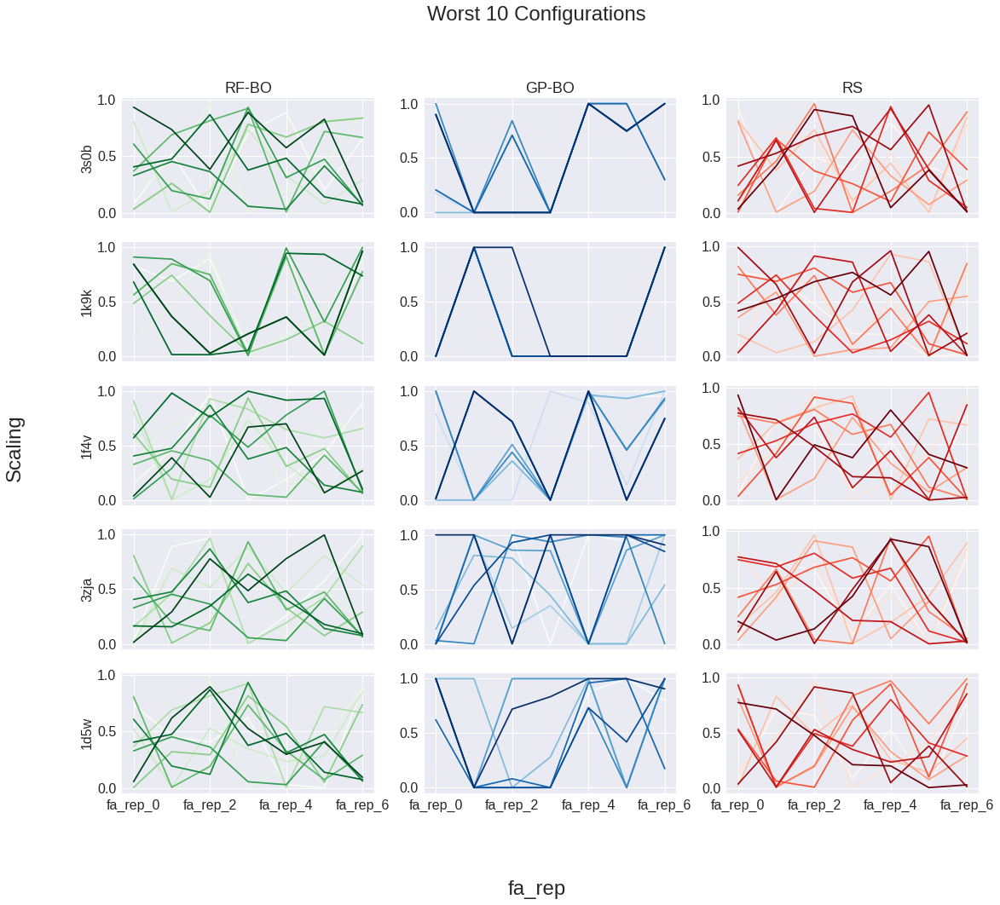

In [161]:
### Best Configs 150
fig, axs = plt.subplots(5, 3, sharex=True, figsize=(18,15))
#fig.suptitle('Convergence of optimization loss')
fig.supxlabel("fa_rep",fontsize=24)
fig.supylabel("Scaling", fontsize=24)
fig.suptitle('Worst 10 Configurations', fontsize=24)
plt.rc('xtick', labelsize=16)
plt.rc('ytick', labelsize=16)
#plt.ylabel('REU', fontsize=16)
i = 0
#plt.xticks(range(7), range(7))


for prot in bench_dict.keys():
    axs[i][0].set_ylabel(prot[:-2], fontsize=16)
    r = get("../results/latest/cycles/optimize_cyclic_7_"+prot+"_ca_rmsdno_pose.pkl")
    r= make_fa_reps(r).groupby('run').mean().iloc[:150]
    r.nlargest(10, 'ca_rmsd').reset_index()[fa_reps].T.plot(ax=axs[i][0], cmap='Greens')
    d = get("../results/latest/random_search/dummy_150_"+prot+"_no_pose.pkl")
    d= make_fa_reps(d).groupby('run').mean().iloc[:150]
    d.nlargest(10, 'ca_rmsd').reset_index()[fa_reps].T.plot(ax=axs[i][2], cmap='Reds')
    

    if i == 0:
        axs[i][0].set_title('RF-BO', fontsize=18)
        axs[i][1].set_title('GP-BO', fontsize=18)
        axs[i][2].set_title('RS', fontsize=18)
                    
        
    r = get("../results/latest/cycles/optimize_cyclic_7_"+prot+"_GPno_pose.pkl")
    r= make_fa_reps(r).groupby('run').mean().iloc[:150]
   
    r.nlargest(10, 'ca_rmsd').reset_index()[fa_reps].T.plot(ax=axs[i][1], cmap='Blues')
   
   
    axs[i][0].legend([])
    axs[i][1].legend([])
    axs[i][2].legend([])
            
    i += 1
plt.savefig(IMG_PATH+'WORST_CONFIGS.png', dpi=300)

### Best Configs Deltas

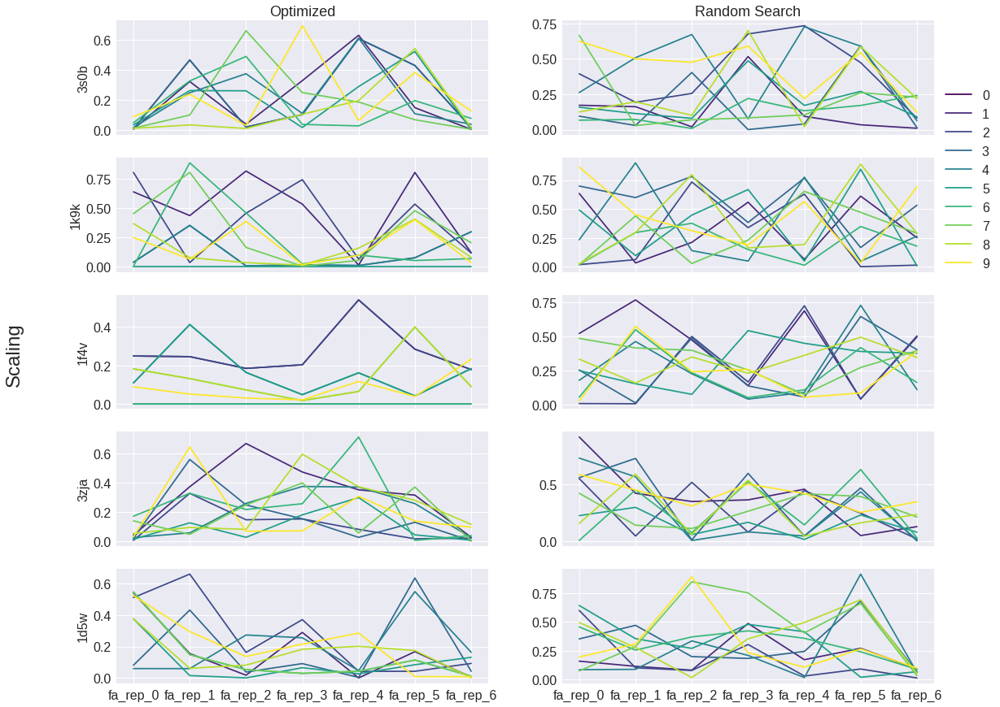

In [243]:
### Best Configs 150
fig, axs = plt.subplots(5, 2, sharex=True, figsize=(18,15))
#fig.suptitle('Convergence of optimization loss')
fig.supxlabel("",fontsize=24)
fig.supylabel("Scaling", fontsize=24)
plt.rc('xtick', labelsize=16)
plt.rc('ytick', labelsize=16)
#plt.ylabel('REU', fontsize=16)
i = 0
plt.xticks(range(7),fa_reps)


for prot in bench_dict.keys():
    axs[i][0].set_ylabel(prot[:-2], fontsize=16)
    r = get("../results/latest/cycles/optimize_cyclic_7_"+prot+"_ca_rmsdno_pose.pkl")
    r= make_fa_reps(r).groupby('run').mean().iloc[:150]
    r.nsmallest(10, 'ca_rmsd').reset_index()[fa_reps].diff().abs().T.plot(ax=axs[i][0], cmap=plt.get_cmap('viridis'))
    d = get("../results/latest/random_search/dummy_150_"+prot+"_no_pose.pkl")
    d= make_fa_reps(d).groupby('run').mean().iloc[:150]
    #axs[i][0].plot(range(7),d.nsmallest(1, 'ca_rmsd').reset_index()[fa_reps].T.values, label='rs_best', c='red')
    

    if i == 0:
        axs[i][0].set_title('Optimized', fontsize=18)
       
 
    axs[i][0].legend([])
        
        
    r = get("../results/latest/cycles/optimize_cyclic_7_"+prot+"_ca_rmsdno_pose.pkl")
    r= make_fa_reps(r).groupby('run').mean().iloc[:150]
    d = get("../results/latest/random_search/dummy_150_"+prot+"_no_pose.pkl")
    d= make_fa_reps(d).groupby('run').mean().iloc[:150]
    
    d.nsmallest(10, 'ca_rmsd').reset_index()[fa_reps].diff().abs().T.plot(ax=axs[i][1], cmap=plt.get_cmap('viridis'))
    #axs[i][1].plot(range(7),r.nsmallest(1, 'ca_rmsd').reset_index()[fa_reps].T.values, label='optimized_best', c='red')
    if i == 0:
        axs[i][1].set_title('Random Search', fontsize=18)
        axs[i][1].legend(fontsize=16, bbox_to_anchor=(1,0.5))
    else:
        axs[i][1].legend([])
            
    i += 1
plt.savefig(IMG_PATH+'BEST_FA_REPS_OPTI_VS_RANDOM_DELTAS.png', dpi=300)

In [1]:
## CONFIGS Over Cycles_7
fig, axs = plt.subplots(7, 1, sharex=True, figsize=(18,15))
#fig.suptitle('Convergence of optimization loss')
fig.supxlabel("",fontsize=24)
fig.supylabel("Scaling", fontsize=24)
plt.rc('xtick', labelsize=16)
plt.rc('ytick', labelsize=16)

r = get("../results/latest/cycles/optimize_cyclic_7_1k9k_A_ca_rmsdno_pose.pkl")
r = make_fa_reps(r).groupby('run').mean()
i=0
for offset in [0, 150,300,450,600,750,900]:    
    a= r.iloc[offset:offset+150]
    a.nsmallest(10, 'ca_rmsd').reset_index()[fa_reps].T.plot(ax=axs[i], cmap=plt.get_cmap('viridis'))
    if i == 0:
        axs[i].legend(fontsize=16, bbox_to_anchor=(1.1,0.5))   
    else:
        axs[i].legend([])
    i+=1

NameError: name 'plt' is not defined

## Sorted Distance to Best

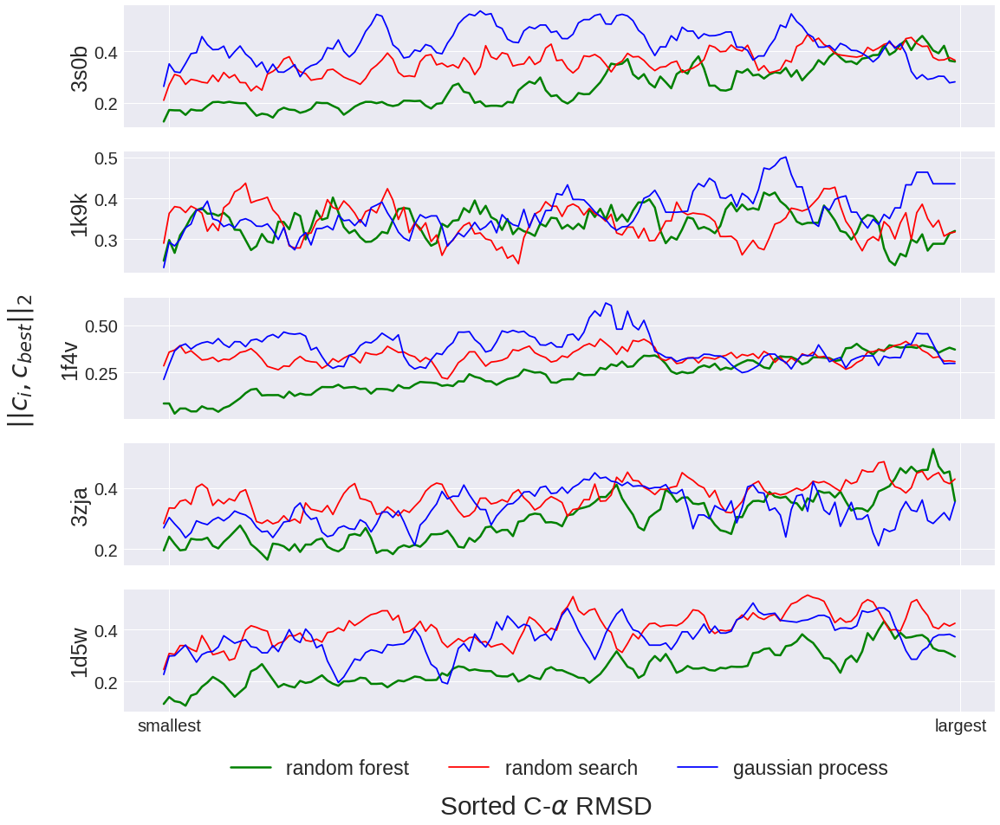

In [141]:
fig, axs = plt.subplots(5, 1, sharex=True, figsize=(18,15))
#fig.suptitle('Convergence of optimization loss')
fig.supxlabel(r"Sorted C-$\alpha$ RMSD")
fig.supylabel(r"$|| c_i, c_{best}||_2$")
plt.rc('xtick')
plt.rc('ytick')
i=0
for prot in bench_dict.keys():
    axs[i].set_ylabel(prot[:-2])
    r = get("../results/latest/cycles/optimize_cyclic_7_"+prot+"_ca_rmsdno_pose.pkl")
    r = make_fa_reps(r).groupby('run').mean().iloc[:150]
    r = r.sort_values('ca_rmsd').reset_index()[fa_reps] # sort by ca_rmsd and 
    g = get("../results/latest/cycles/optimize_cyclic_7_"+prot+"_GPno_pose.pkl")
    g = make_fa_reps(g).groupby('run').mean().iloc[:150]
    g = g.sort_values('ca_rmsd').reset_index()[fa_reps]
    d = get("../results/latest/random_search/dummy_150_"+prot+"_no_pose.pkl")
    d = make_fa_reps(d).groupby('run').mean().iloc[:150]
    d = d.sort_values('ca_rmsd').reset_index()[fa_reps]
    dist = abs(np.sqrt((r - r.iloc[0])**2)).mean(axis=1) # calc distance to smallest
    dist.rolling(5).mean().plot(ax=axs[i], label='random forest', c=rf_color, linewidth=2.5)
    dist = abs(np.sqrt((d - d.iloc[0])**2)).mean(axis=1)
    dist.rolling(5).mean().plot(ax=axs[i], label='random search', c=rs_color)
    dist = abs(np.sqrt((g - g.iloc[0])**2)).mean(axis=1)
    dist.rolling(5).mean().plot(ax=axs[i], label='gaussian process', c=gp_color)
    if i ==4:
        axs[i].legend(loc='lower center', bbox_to_anchor=(0.5, -0.7),ncol=3)
    i+=1
plt.xticks([5,150],labels=['smallest', 'largest'])
    
plt.savefig(IMG_PATH+'SORTED_DIST_TO_BEST.png', dpi=300)

## Sorted Distance to Default

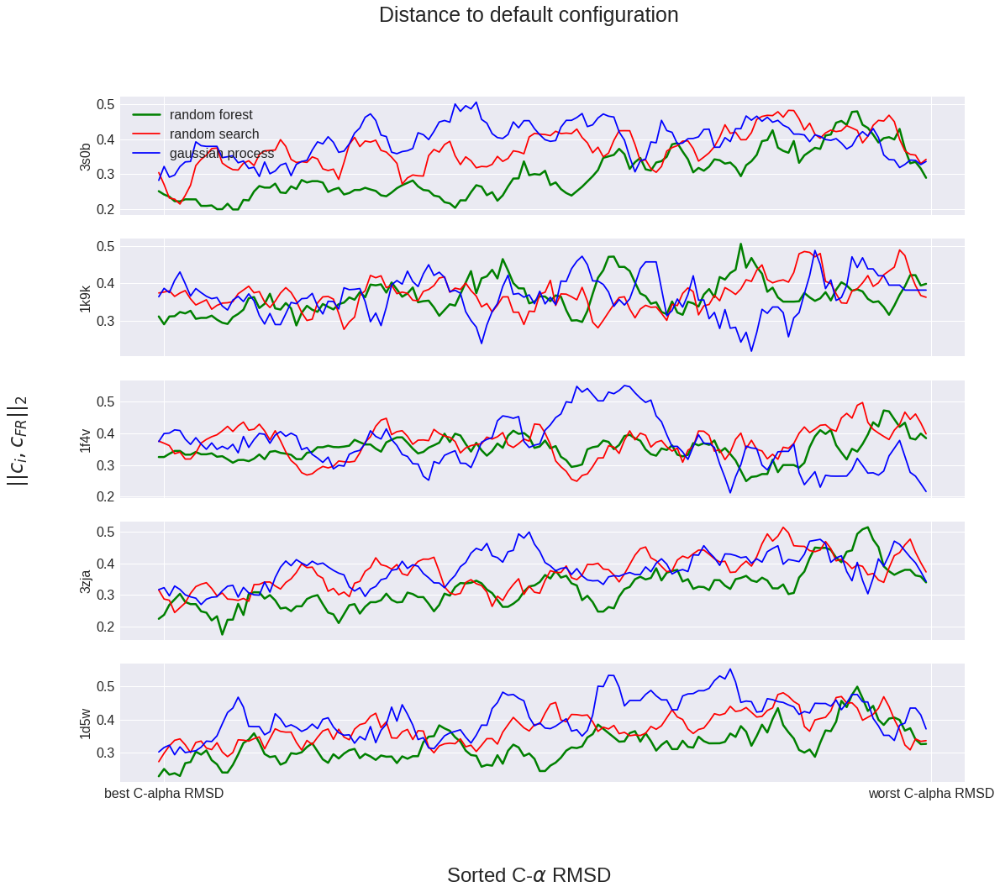

In [113]:
from sklearn.linear_model import LinearRegression
fig, axs = plt.subplots(5, 1, sharex=True, figsize=(18,15))
fig.suptitle('Distance to default configuration')
fig.supxlabel(r"Sorted C-$\alpha$ RMSD",fontsize=24)
fig.supylabel(r"$|| c_i, c_{FR}||_2$", fontsize=24)
plt.rc('xtick', labelsize=16)
plt.rc('ytick', labelsize=16)
i=0
for prot in bench_dict.keys():
    axs[i].set_ylabel(prot[:-2], fontsize=16)
    r = get("../results/latest/cycles/optimize_cyclic_7_"+prot+"_ca_rmsdno_pose.pkl")
    r = make_fa_reps(r).groupby('run').mean().iloc[:150]
    r = r.sort_values('ca_rmsd').reset_index()[fa_reps]
    g = get("../results/latest/cycles/optimize_cyclic_7_"+prot+"_GPno_pose.pkl")
    g = make_fa_reps(g).groupby('run').mean().iloc[:150]
    g = g.sort_values('ca_rmsd').reset_index()[fa_reps]
    d = get("../results/latest/random_search/dummy_150_"+prot+"_no_pose.pkl")
    d = make_fa_reps(d).groupby('run').mean().iloc[:150]
    d = d.sort_values('ca_rmsd').reset_index()[fa_reps]
    dist = abs(np.sqrt((r - pd.Series(relax_init_fa_reps, index=fa_reps))**2)).mean(axis=1)
    dist.rolling(5).mean().plot(ax=axs[i], label='random forest', c=rf_color, linewidth=2.5)
    dist = abs(np.sqrt((d - pd.Series(relax_init_fa_reps, index=fa_reps))**2)).mean(axis=1)
    dist.rolling(5).mean().plot(ax=axs[i], label='random search', c=rs_color)
    dist = abs(np.sqrt((g -  pd.Series(relax_init_fa_reps, index=fa_reps))**2)).mean(axis=1)
    dist.rolling(5).mean().plot(ax=axs[i], label='gaussian process', c=gp_color)
    if i ==4:
        axs[i].legend(fontsize=16)
    i+=1
plt.xticks([5,150],labels=['best C-alpha RMSD', 'worst C-alpha RMSD'])
    
plt.savefig(IMG_PATH+'SORTED_DIST_TO_FR.png', dpi=300)

## Optimizer feature importance

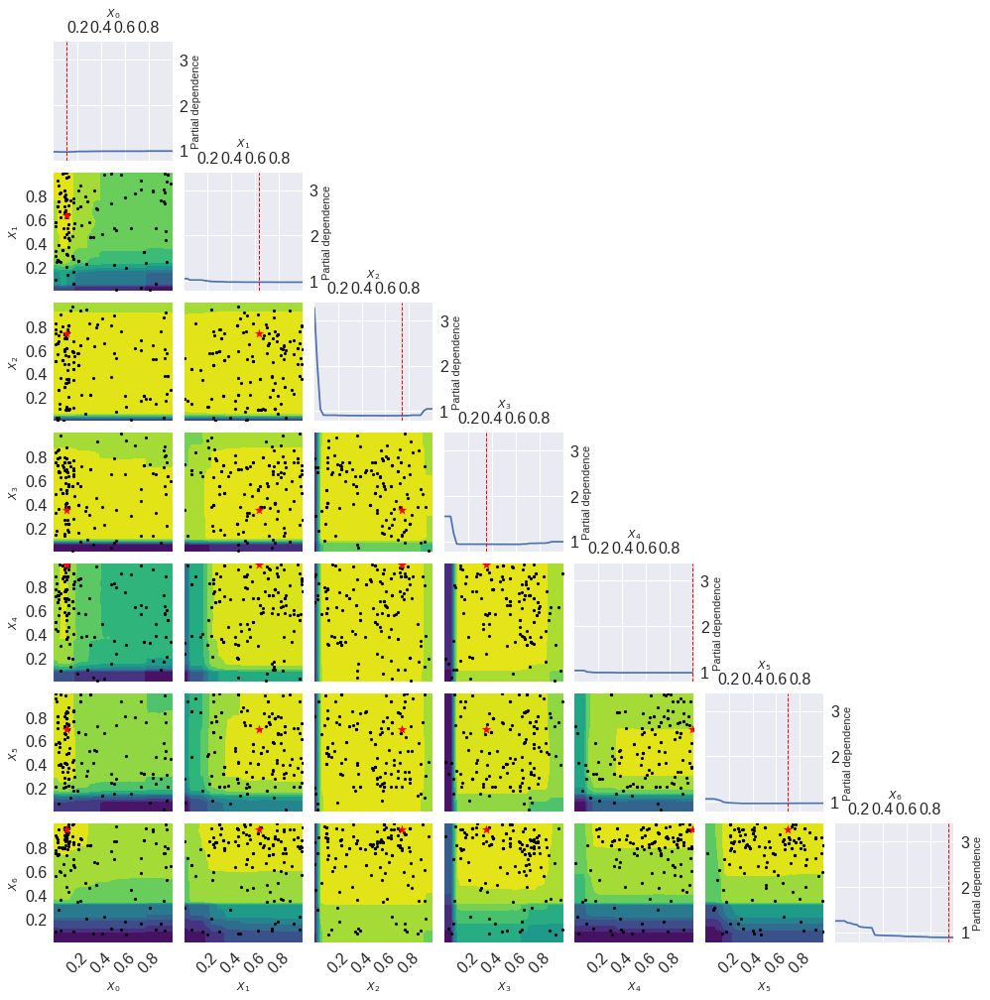

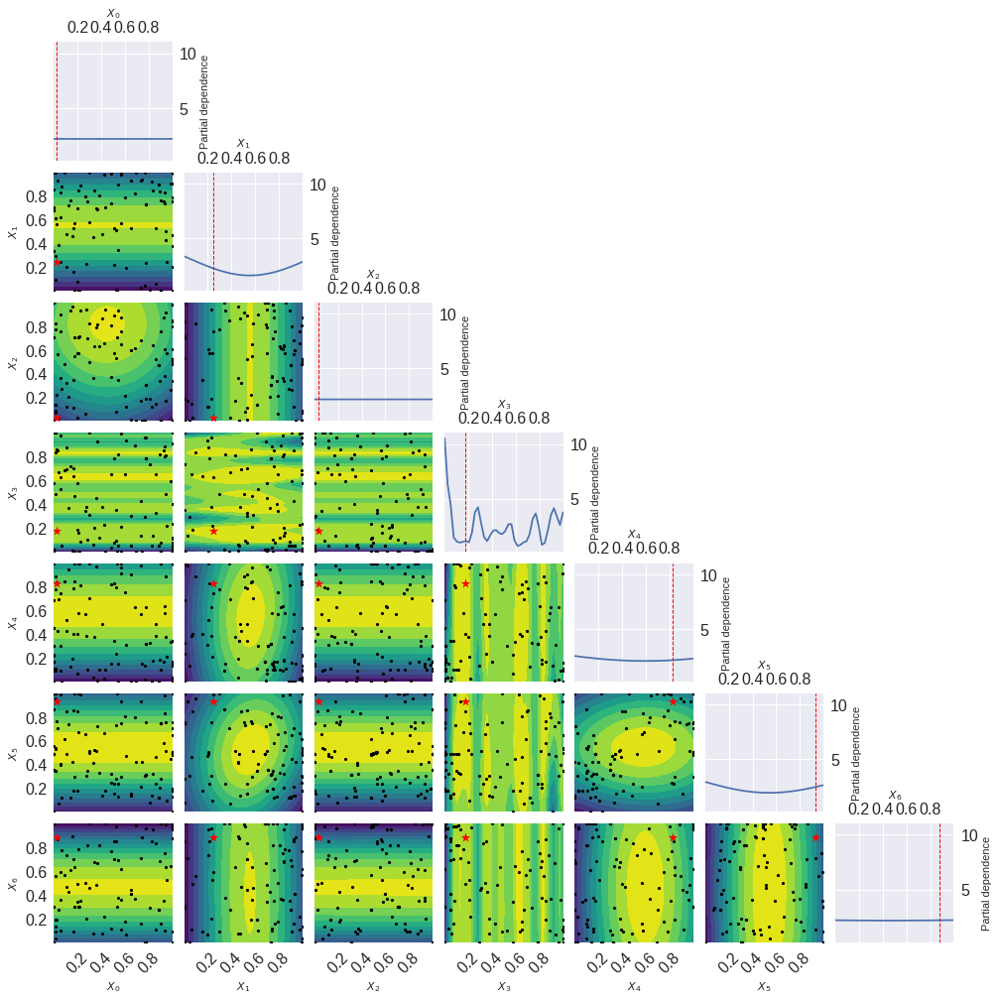

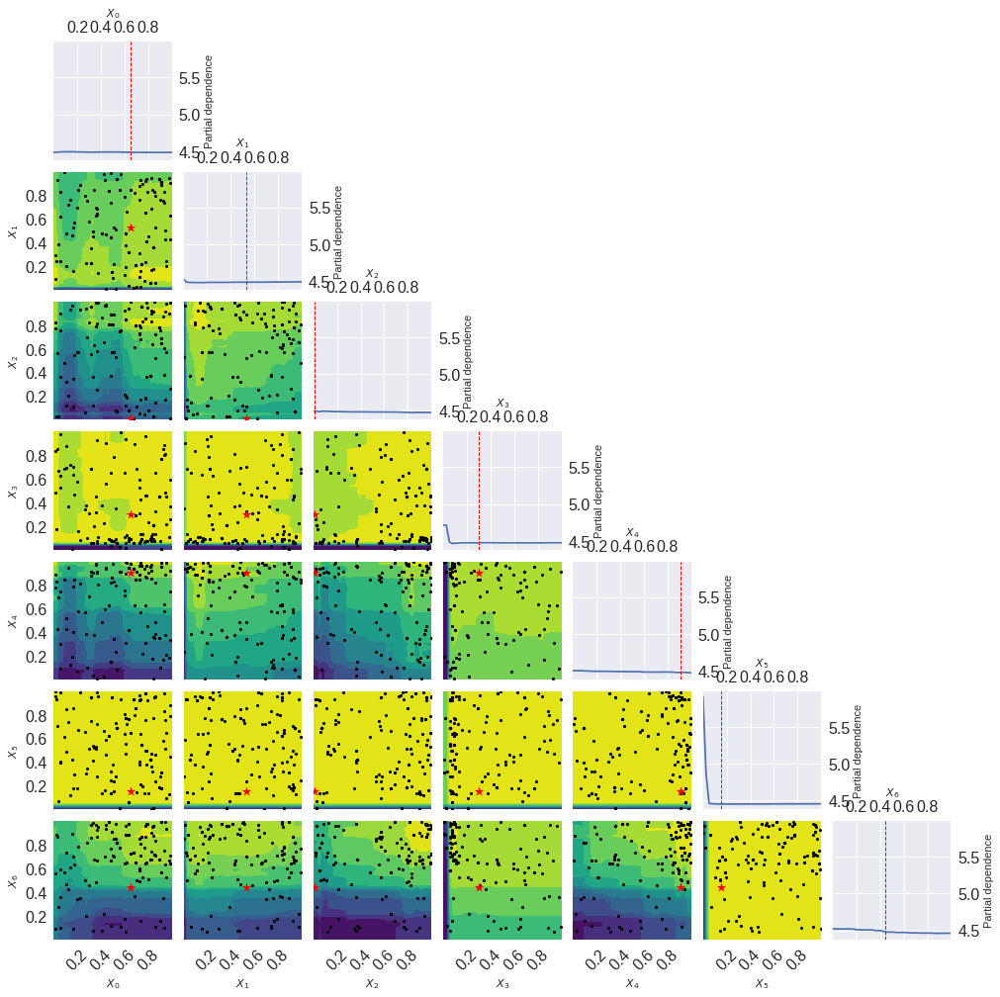

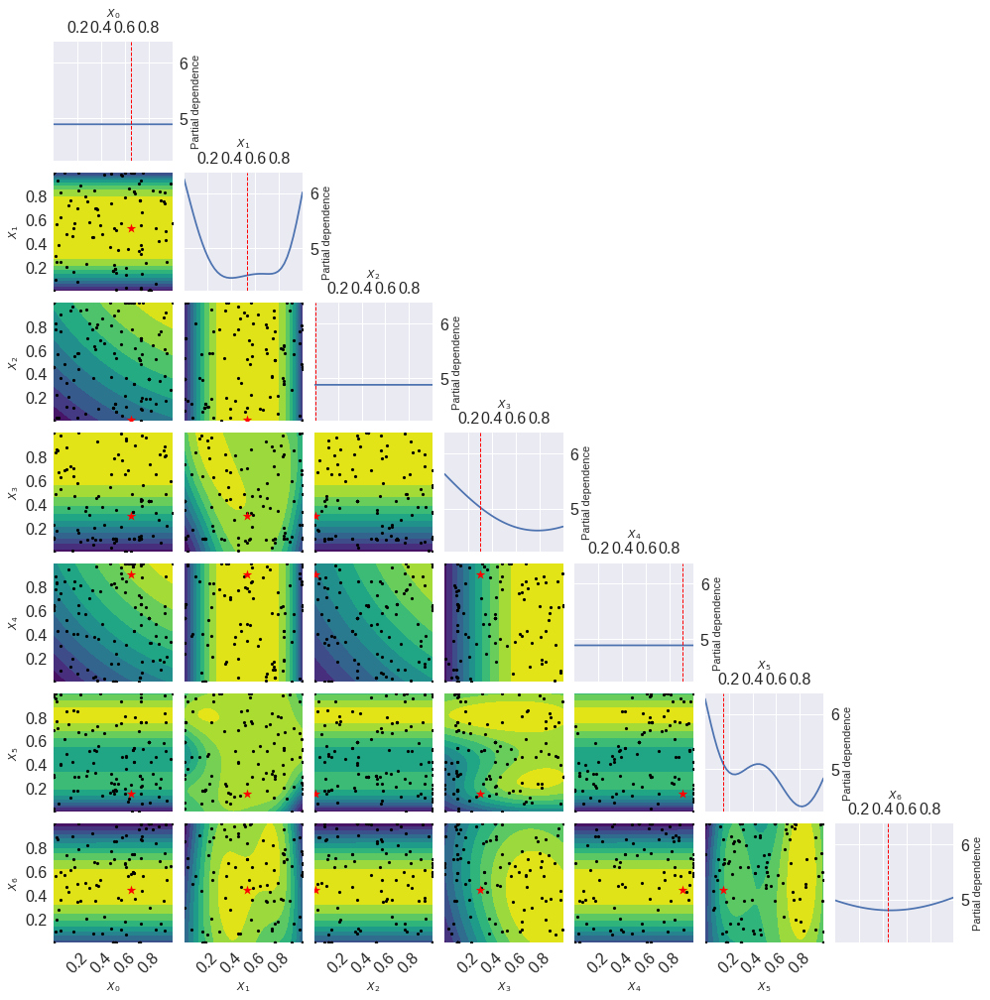

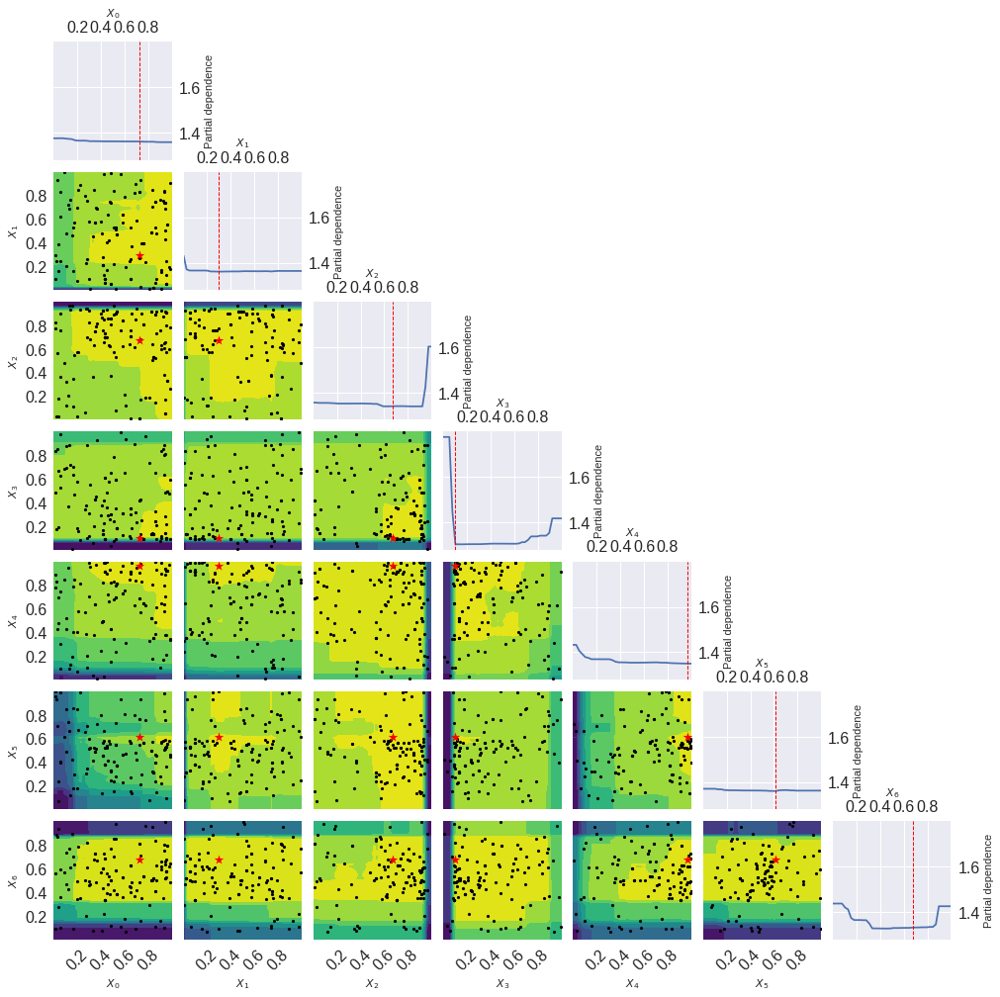

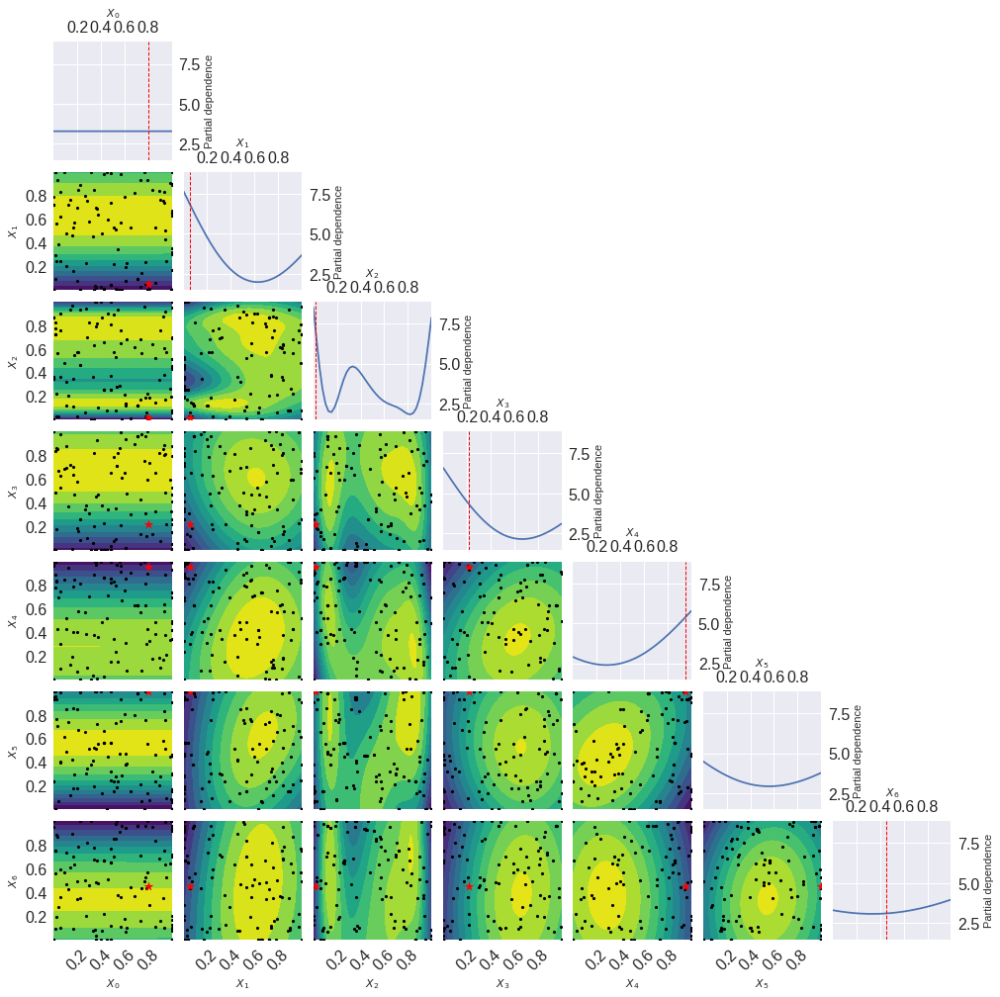

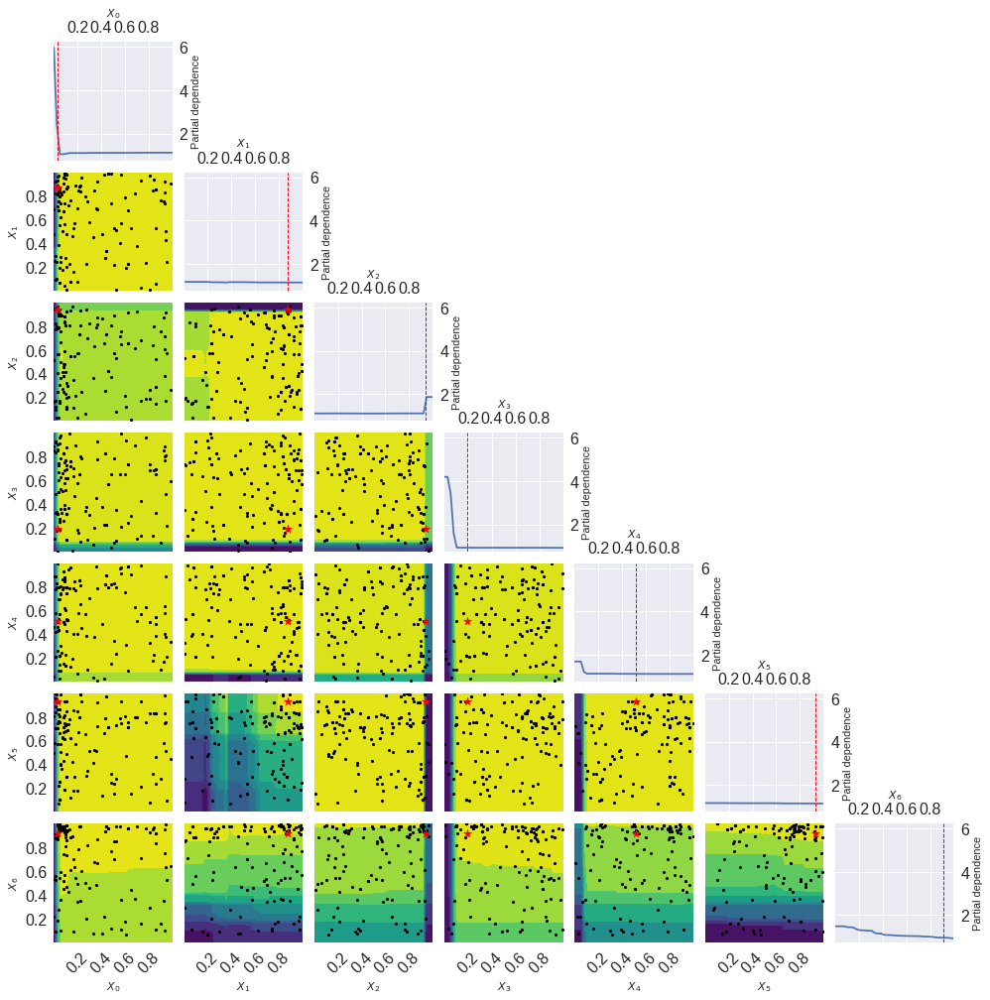

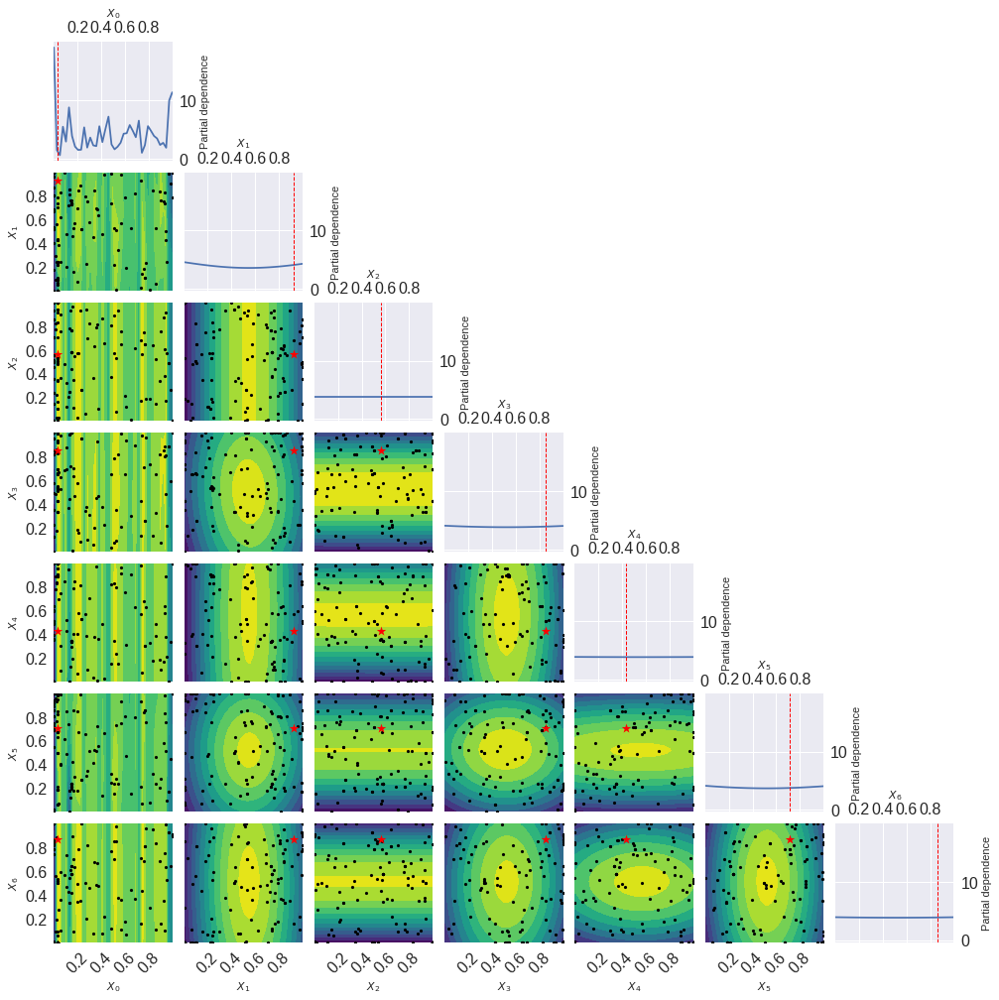

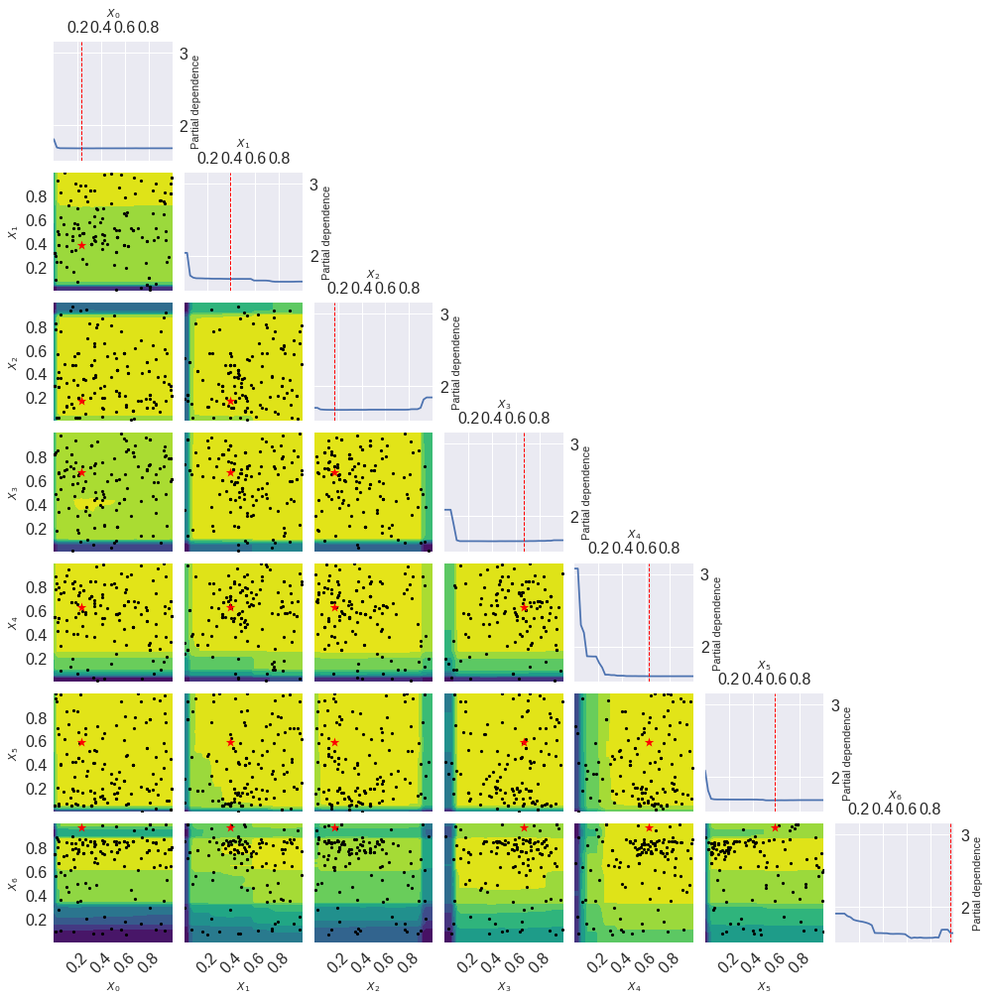

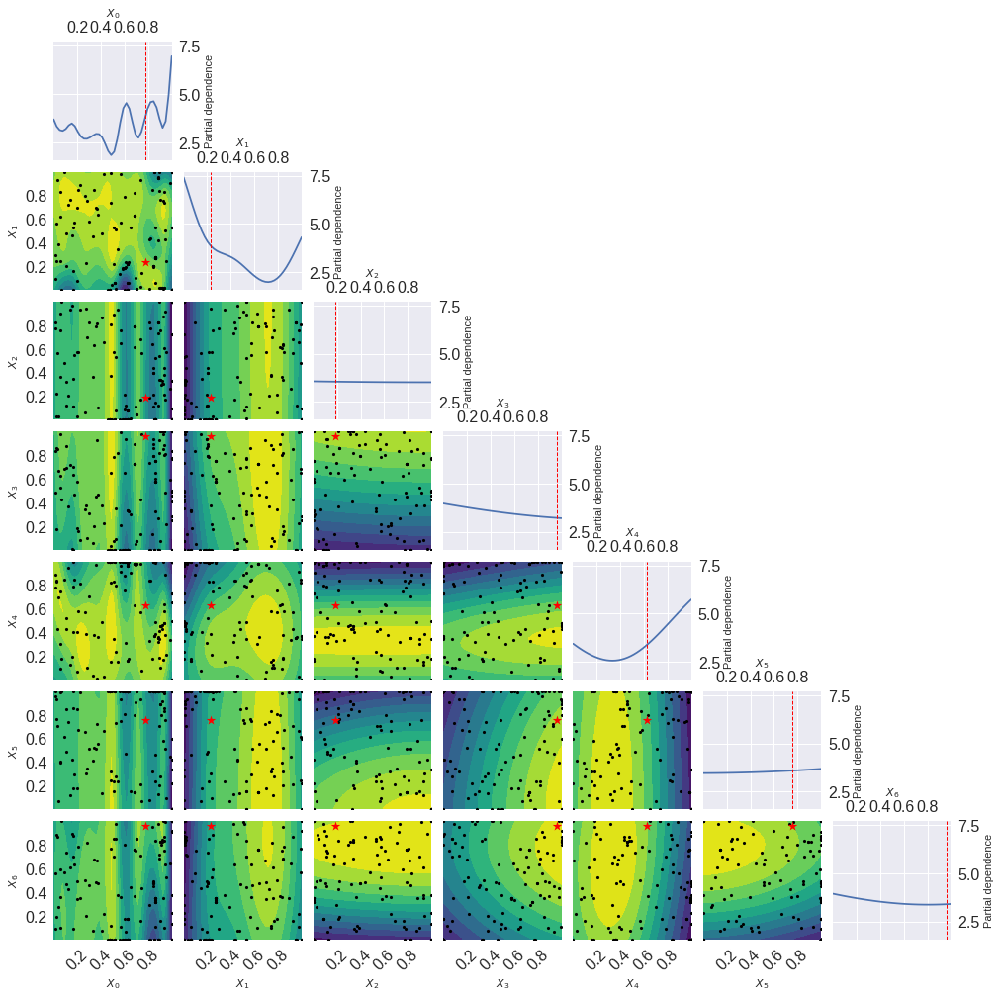

In [98]:
from skopt import Optimizer
from skopt.plots import plot_objective
from skopt import Space
dims = Space.from_yaml("../src/space.yml")
for prot in bench_dict.keys():
    ropti : Optimizer = Optimizer(base_estimator='RF', dimensions=dims)
    gopti : Optimizer = Optimizer(base_estimator='GP', dimensions=dims)
    #axs[i].set_ylabel(prot[:-2], fontsize=16)
    r = get("../results/latest/cycles/optimize_cyclic_7_"+prot+"_ca_rmsdno_pose.pkl")
    r = make_fa_reps(r).groupby('run').mean().iloc[:150]
    #r = r.sort_values('ca_rmsd').reset_index()[fa_reps]
    g = get("../results/latest/cycles/optimize_cyclic_7_"+prot+"_GPno_pose.pkl")
    g = make_fa_reps(g).groupby('run').mean().iloc[:150]
    ropti.tell(r[fa_reps].values.tolist(), r.ca_rmsd.values.tolist())
    gopti.tell(g[fa_reps].values.tolist(), g.ca_rmsd.values.tolist())
    plot_objective(ropti.get_result())
    plt.savefig(IMG_PATH+"OBJECTIVE_RF_"+prot+".png", dpi=300)
    plot_objective(gopti.get_result())
    plt.savefig(IMG_PATH+"OBJECTIVE_GP_"+prot+".png", dpi=300)

## 15 Best optimized vs 15 best Random
- optimized is always better. but not by much.

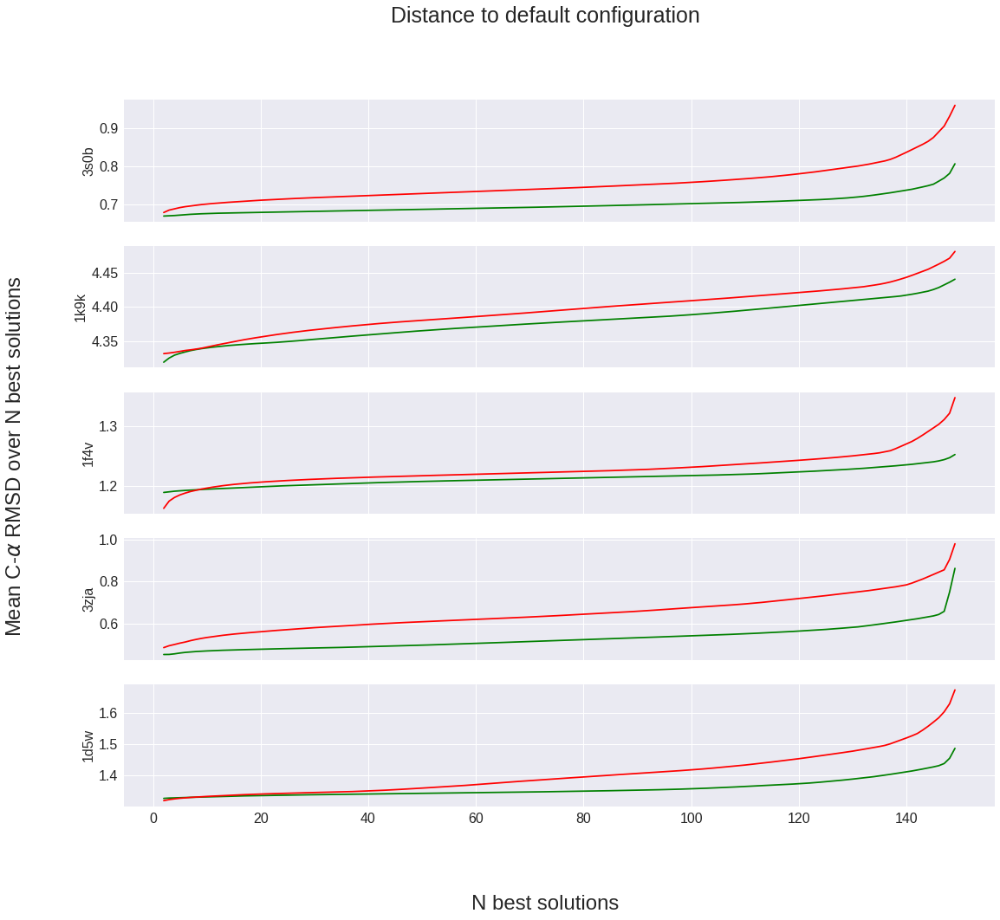

In [233]:
fig, axs = plt.subplots(5, 1, sharex=True, figsize=(18,15))
fig.suptitle('Distance to default configuration')
fig.supxlabel(r"N best solutions",fontsize=24)
fig.supylabel(r"Mean C-$\alpha$ RMSD over N best solutions ", fontsize=24)
plt.rc('xtick', labelsize=16)
plt.rc('ytick', labelsize=16)
i=0

for prot in bench_dict.keys():
    o = get("../results/latest/cycles/optimize_cyclic_7_"+prot+"_ca_rmsdno_pose.pkl")
    o= make_fa_reps(o).groupby('run').mean().iloc[:150]
    r = get("../results/latest/random_search/dummy_150_"+prot+"_no_pose.pkl")
    r= make_fa_reps(r).groupby('run').mean().iloc[:150]
    opti = []
    rand = []
    axs[i].set_ylabel(prot[:-2], fontsize=16)
    for n in range(2, 150):
        op = o.nsmallest(n, 'ca_rmsd').ca_rmsd.mean()
        ra = r.nsmallest(n, 'ca_rmsd').ca_rmsd.mean()
        opti.append(op)
        rand.append(ra)
    axs[i].plot(range(2, 150), opti, label='RF-BO', c=rf_color)
    axs[i].plot(range(2, 150), rand, label='random search', c=rs_color)
    
    i+=1

# STATISTICS EXAMPLE

## Coin Toss fair coin

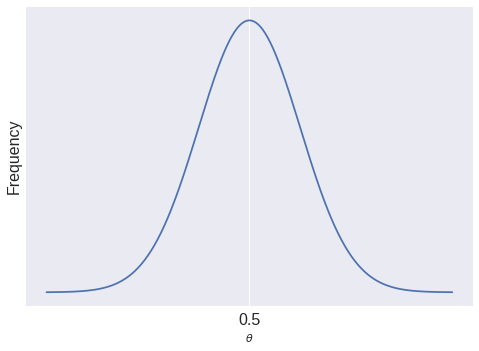

In [477]:
mu = 0.5
variance = 0.01
sigma = math.sqrt(variance)
x = np.linspace(mu - 4*sigma, mu + 4*sigma, 500)
prior = stats.norm.pdf(x, mu, sigma)
plt.plot(x, prior , linestyle='solid', label='data')
plt.yticks([])
plt.xticks([0.5])
plt.ylabel('Frequency', fontsize=16)
plt.xlabel(r'$\theta$')
plt.savefig(IMG_PATH+'COIN_TOSS_FAIR.png', dpi=300)

## Coin Toss frequentist.

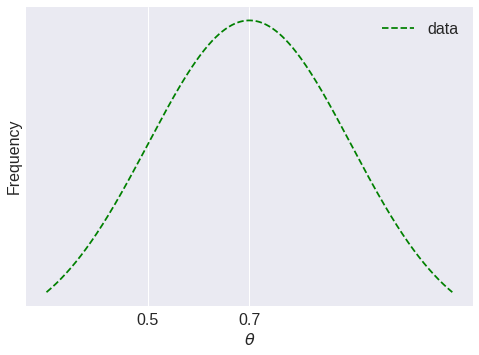

In [479]:
mu = 0.7
variance = 0.01
sigma = math.sqrt(variance)
x = np.linspace(mu - 4*sigma, mu + 4*sigma, 500)
prior = stats.norm.pdf(x, mu, 0.2)
plt.plot(x, prior , linestyle='--', c='green',label='data')
plt.yticks([])
plt.xticks([0.5, 0.7], fontsize=16)
plt.ylabel('Frequency',fontsize=16)
plt.xlabel(r'$\theta$',fontsize=16)
plt.legend(fontsize=16)
plt.savefig(IMG_PATH+'COIN_TOSS_FREQ.png', dpi=300)

## Coin Toss Bayes, strong vs weak prior.

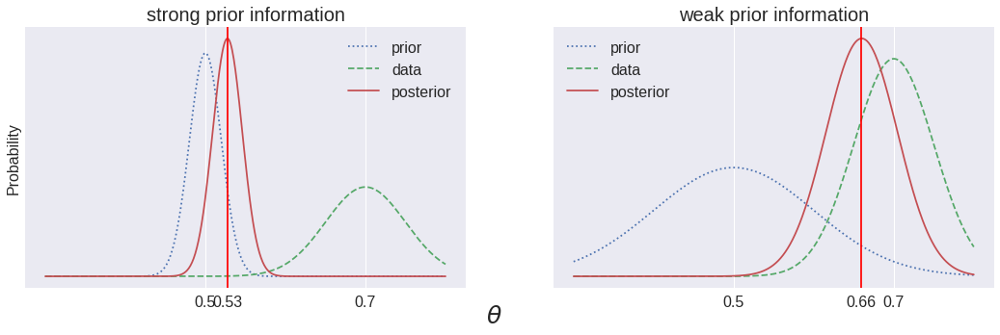

In [110]:
import matplotlib.pyplot as plt
import numpy as np
import scipy.stats as stats
import math
from matplotlib.ticker import FormatStrFormatter

fig, [ax1, ax2] = plt.subplots(1, 2, figsize=(18, 5))
mu = 0.5
variance = 0.01
sigma = math.sqrt(variance)
x = np.linspace(mu - 2*sigma, mu + 3*sigma, 500)
prior = stats.norm.pdf(x, mu, 0.02)
data = stats.norm.pdf(x, 0.7, 0.05)
posterior = prior*data
posterior =  ((prior.sum() + data.sum()) / 2.0) * (posterior.astype(float) / posterior.astype(float).sum())
ax1.plot(x, prior , linestyle='dotted', label='prior')
ax1.plot(x, data , linestyle='--', label='data')
ax1.plot(x, posterior, label='posterior')
ax1.legend(fontsize=16)
ax1.set_title('strong prior information', fontsize=20)
ax1.set_yticks([])
ax1.set_xticks([0.5, 0.7])
ax1.axvline( x[np.argmax(posterior)], color='red')
ax1.set_xticks([0.5, x[np.argmax(posterior)], 0.7])

prior = stats.norm.pdf(x, mu, 0.1)
data = stats.norm.pdf(x, 0.7, 0.05)
posterior = prior*data
posterior =  ((prior.sum() + data.sum()) / 2.0) * (posterior.astype(float) / posterior.astype(float).sum())
ax2.plot(x, prior , linestyle='dotted', label='prior')
ax2.plot(x, data , linestyle='--', label='data')
ax2.plot(x, posterior, label='posterior')
ax2.legend(fontsize=16)
ax2.set_title('weak prior information', fontsize=20)
ax2.set_yticks([])
ax2.axvline( x[np.argmax(posterior)], color='red')
ax2.set_xticks([0.5, x[np.argmax(posterior)], 0.7])

ax1.xaxis.set_major_formatter(FormatStrFormatter('%.2g'))
ax2.xaxis.set_major_formatter(FormatStrFormatter('%.2g'))
ax1.set_ylabel('Probability', fontsize=16)
fig.supxlabel(r'$\theta$')



plt.savefig(IMG_PATH+'PDF_PRIOR_AND_DATA_TO_POSTERIOR.png', dpi=300)

plt.show()

## GP KERNELS

In [5]:
import matplotlib.pyplot as plt
import numpy as np


def plot_gpr_samples(gpr_model, n_samples, ax):
    """Plot samples drawn from the Gaussian process model.

    If the Gaussian process model is not trained then the drawn samples are
    drawn from the prior distribution. Otherwise, the samples are drawn from
    the posterior distribution. Be aware that a sample here corresponds to a
    function.

    Parameters
    ----------
    gpr_model : `GaussianProcessRegressor`
        A :class:`~sklearn.gaussian_process.GaussianProcessRegressor` model.
    n_samples : int
        The number of samples to draw from the Gaussian process distribution.
    ax : matplotlib axis
        The matplotlib axis where to plot the samples.
    """
    x = np.linspace(0, 5, 100)
    X = x.reshape(-1, 1)

    y_mean, y_std = gpr_model.predict(X, return_std=True)
    y_samples = gpr_model.sample_y(X, n_samples)

    for idx, single_prior in enumerate(y_samples.T):
        ax.plot(
            x,
            single_prior,
            linestyle="--",
            alpha=0.7,
            label=f"Sampled function #{idx + 1}",
        )
    ax.plot(x, y_mean, color="black", label="Mean")
    ax.fill_between(
        x,
        y_mean - y_std,
        y_mean + y_std,
        alpha=0.1,
        color="black",
        label=r"$\pm$ 1 std. dev.",
    )
    ax.set_ylim([-3, 3])

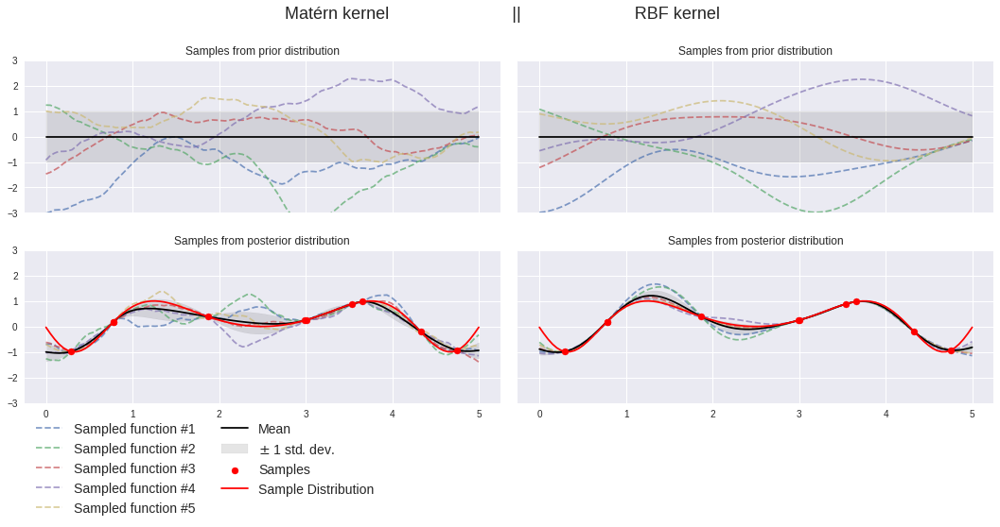

In [7]:
#### SMOOTH OBJECTIVE KERNELS ###########
from sklearn.gaussian_process.kernels import Matern, RBF
from sklearn.gaussian_process import GaussianProcessRegressor

fig, axs = plt.subplots(ncols=2, nrows=2, sharex=True, sharey=True, figsize=(15, 8))

rng = np.random.RandomState(42)
X_train = rng.uniform(0, 5, 10).reshape(-1, 1)
y_train = np.sin((X_train[:, 0] - 2.5) ** 2)
x = np.linspace(0,5,100).reshape(-1, 1)
true_objective = np.sin((x[:,0] - 2.5) **2)
n_samples = 5

    
# MATERN############
kernel = 1.0 * Matern(length_scale=1.0, length_scale_bounds=(1e-1, 10.0), nu=1.5)
gprM = GaussianProcessRegressor(kernel=kernel, random_state=rng)
# plot prior
plot_gpr_samples(gprM, n_samples=n_samples, ax=axs[0][0])
axs[0][0].set_title("Samples from prior distribution")

# plot posterior
gprM.fit(X_train, y_train)
plot_gpr_samples(gprM, n_samples=n_samples, ax=axs[1][0])
axs[1][0].scatter(X_train[:, 0], y_train, color="red", zorder=10, label="Samples")
axs[1][0].plot(x, true_objective, color='red', label='Sample Distribution')
axs[1][0].set_title("Samples from posterior distribution")
axs[1][0].legend(bbox_to_anchor=(0.0, -0.05), loc="upper left", fontsize=14, ncol=2)

#################

# RBF##############
kernel = 1.0 * RBF(length_scale=1.0, length_scale_bounds=(1e-1, 10.0))
gprR = GaussianProcessRegressor(kernel=kernel, random_state=rng)

# plot prior
plot_gpr_samples(gprR, n_samples=n_samples, ax=axs[0][1])
axs[0][1].set_title("Samples from prior distribution")

# plot posterior
gprR.fit(X_train, y_train)
plot_gpr_samples(gprR, n_samples=n_samples, ax=axs[1][1])
axs[1][1].scatter(X_train[:, 0], y_train, color="red", zorder=10, label="Samples")
axs[1][1].plot(x, true_objective, color='red', label='Sample Distribution')

#axs[1][1].legend(bbox_to_anchor=(1.05, 1.5), loc="upper left")
axs[1][1].set_title("Samples from posterior distribution")
###################
fig.suptitle("                  Matérn kernel                          ||                        RBF kernel                 ", fontsize=18)
plt.tight_layout()
#plt.savefig(IMG_PATH+"KERNELS_SMOOTH_OBJECTIVE.png", dpi=300)

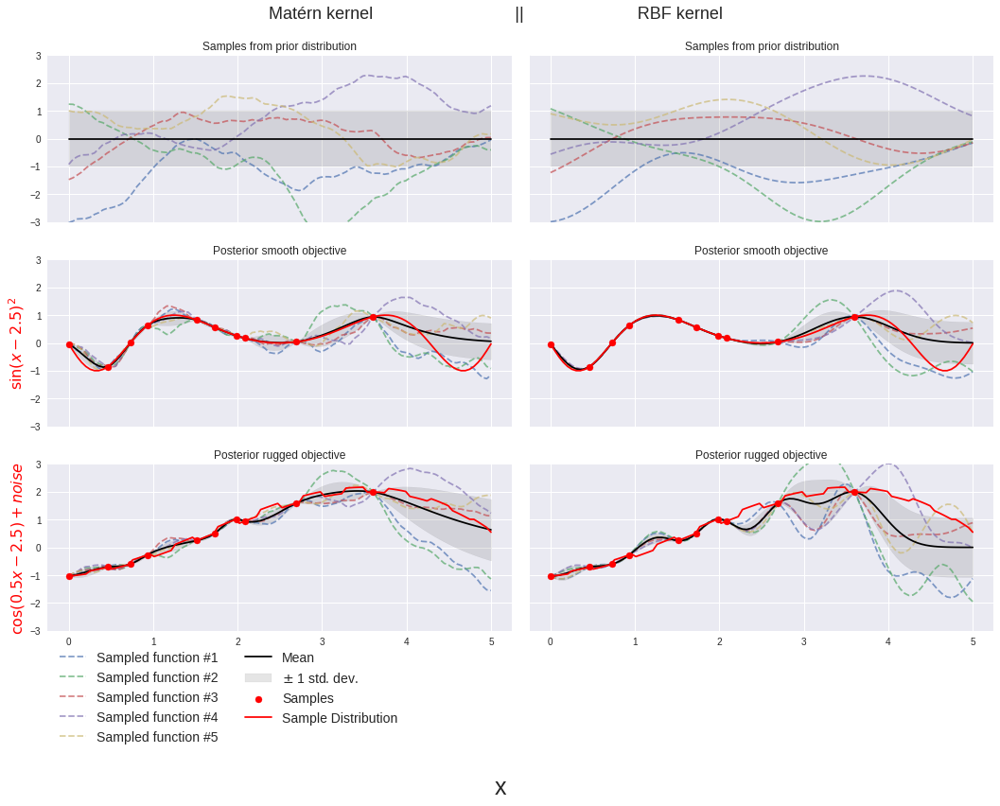

In [6]:
### Rugged OBJECTIVE KERNELS ###########
from sklearn.gaussian_process.kernels import Matern, RBF
from sklearn.gaussian_process import GaussianProcessRegressor

fig, axs = plt.subplots(ncols=2, nrows=3, sharex=True, sharey=True, figsize=(15, 12))
def rugged(v_in):
    return np.array([x + 0.1 if x%0.5 >= 0.25 else x-0.1 for x in v_in]).reshape(-1,)
    #return (v_in % 0.5).reshape(-1, )
rng = np.random.RandomState(1)
X_train = rng.uniform(0, 5, 10).reshape(-1, 1)
y_train = np.sin((X_train[:, 0] - 2.5) ** 2)
x = np.linspace(0,5,100).reshape(-1, 1)
true_objective = np.sin((x[:,0] - 2.5) **2)
n_samples = 5

    
# MATERN############
kernel = 1.0 * Matern(length_scale=1.0, length_scale_bounds=(1e-1, 10.0), nu=1.5)
gprM = GaussianProcessRegressor(kernel=kernel, random_state=rng)
# plot prior
plot_gpr_samples(gprM, n_samples=n_samples, ax=axs[0][0])
axs[0][0].set_title("Samples from prior distribution")

# plot posterior smooth
gprM.fit(X_train, y_train)
plot_gpr_samples(gprM, n_samples=n_samples, ax=axs[1][0])
axs[1][0].scatter(X_train[:, 0], y_train, color="red", zorder=10, label="Samples")
axs[1][0].plot(x, true_objective, color='red', label='Sample Distribution')
axs[1][0].set_title("Posterior smooth objective")
axs[1][0].set_ylabel(r'$\sin(x-2.5)^2$', fontsize=16, color='red')

#axs[1][0].legend(bbox_to_anchor=(0.0, -0.05), loc="upper left", fontsize=14, ncol=2)


# plot posterior rugged
#### RUGGGED
#X_train = rng.uniform(0, 5, 10).reshape(-1, 1)
y_train = np.cos(0.5*(X_train[:, 0] - 2.5))*rugged(X_train)-1
x = np.linspace(0,5,100).reshape(-1, 1)
true_objective = np.cos(0.5*(x[:, 0] - 2.5))*rugged(x)-1
kernel = 1.0 * Matern(length_scale=1.0, length_scale_bounds=(1e-1, 10.0), nu=1.5)
gprM = GaussianProcessRegressor(kernel=kernel, random_state=rng)
gprM.fit(X_train, y_train)
plot_gpr_samples(gprM, n_samples=n_samples, ax=axs[2][0])
axs[2][0].scatter(X_train[:, 0], y_train, color="red", zorder=10, label="Samples")
axs[2][0].plot(x, true_objective, color='red', label='Sample Distribution')
axs[2][0].set_title("Posterior rugged objective")
axs[2][0].legend(bbox_to_anchor=(0.0, -0.05), loc="upper left", fontsize=14, ncol=2)
axs[2][0].set_ylabel(r'$\cos(0.5x-2.5) + noise$', fontsize=16, color='red')


#################

# RBF##############
kernel = 1.0 * RBF(length_scale=1.0, length_scale_bounds=(1e-1, 10.0))
gprR = GaussianProcessRegressor(kernel=kernel, random_state=rng)

# plot prior
plot_gpr_samples(gprR, n_samples=n_samples, ax=axs[0][1])
axs[0][1].set_title("Samples from prior distribution")

# plot posterior rugged
gprR.fit(X_train, y_train)
plot_gpr_samples(gprR, n_samples=n_samples, ax=axs[2][1])
axs[2][1].scatter(X_train[:, 0], y_train, color="red", zorder=10, label="Samples")
axs[2][1].plot(x, true_objective, color='red', label='Sample Distribution')
axs[2][1].set_title("Posterior rugged objective")

# plot posterior smooth
#X_train = rng.uniform(0, 5, 10).reshape(-1, 1)
y_train = np.sin((X_train[:, 0] - 2.5) ** 2)
x = np.linspace(0,5,100).reshape(-1, 1)
true_objective = np.sin((x[:,0] - 2.5) **2)

gprR.fit(X_train, y_train)
plot_gpr_samples(gprR, n_samples=n_samples, ax=axs[1][1])
axs[1][1].scatter(X_train[:, 0], y_train, color="red", zorder=10, label="Samples")
axs[1][1].plot(x, true_objective, color='red', label='Sample Distribution')
axs[1][1].set_title("Posterior smooth objective")

###################
fig.suptitle("                  Matérn kernel                              ||                        RBF kernel                    ", fontsize=18)
fig.supxlabel('x')
plt.tight_layout()
plt.savefig(IMG_PATH+"KERNELS_COMPARE_OBJECTIVE.png", dpi=300)

# make best configs for testing

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


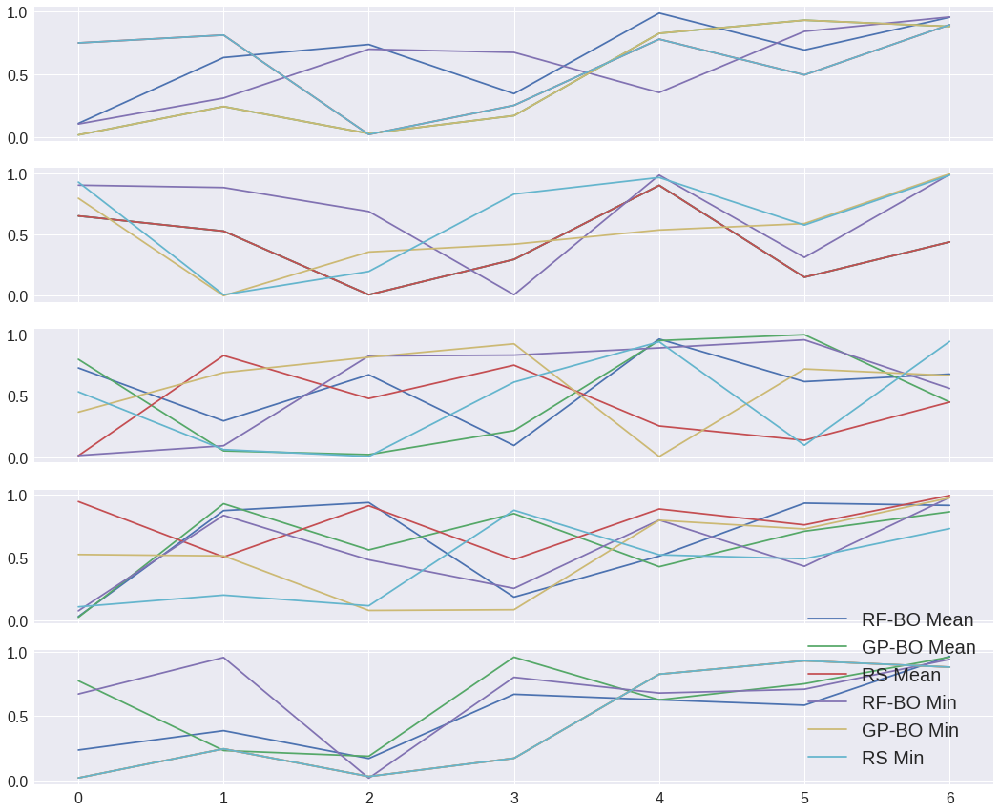

In [265]:
fig, axs = plt.subplots(5, 1, sharex=True, figsize=(18,15))
i=0

for prot in bench_dict.keys():
    with open('../results/configs/'+prot+'rf_best_mean.pkl', 'rb') as h:
        rfmean = pickle.load( h)
    with open('../results/configs/'+prot+'gp_best_mean.pkl', 'rb') as h:
        gpmean = pickle.load( h)
    with open('../results/configs/'+prot+'rs_best_mean.pkl', 'rb') as h:
        rsmean = pickle.load( h)
    with open('../results/configs/'+prot+'rf_best_min.pkl', 'rb') as h:
        rfmin= pickle.load( h)
    with open('../results/configs/'+prot+'gp_best_min.pkl', 'rb') as h:
        gpmin= pickle.load(h)
    with open('../results/configs/'+prot+'rs_best_min.pkl', 'rb') as h:
        rsmin =pickle.load( h)
    for name, config in zip(['RF-BO Mean', 'GP-BO Mean', 'RS Mean', 'RF-BO Min', 'GP-BO Min', 'RS Min'], [rfmean, gpmean, rsmean, rfmin, gpmin, rsmin]):
        axs[i].plot(range(7), config, label=name)
    plt.legend(fontsize=20, loc='lower right')
    i+=1

In [248]:
for prot in bench_dict.keys():
    rf = get("../results/latest/cycles/optimize_cyclic_7_"+prot+"_ca_rmsdno_pose.pkl")
    gp = get("../results/latest/cycles/optimize_cyclic_7_"+prot+"_GPno_pose.pkl")
    rs = get("../results/latest/random_search/dummy_150_"+prot+"_no_pose.pkl")
    
    # has to be done otherwise groupby kicks configs out
    rf_mean = make_fa_reps(rf).groupby('run').mean().iloc[:150]
    gp_mean = make_fa_reps(gp).groupby('run').mean().iloc[:150]
    rs_mean = make_fa_reps(rs).groupby('run').mean().iloc[:150]
    rf_min = make_fa_reps(rf).groupby('run').min().iloc[:150]
    gp_min = make_fa_reps(gp).groupby('run').min().iloc[:150]
    rs_min = make_fa_reps(rs).groupby('run').min().iloc[:150]
    with open('../results/configs/'+prot+'rf_best_mean.pkl', 'wb') as h:
        pickle.dump(rf_mean.nsmallest(1, "ca_rmsd")[fa_reps].values[0].tolist(), h)
    with open('../results/configs/'+prot+'gp_best_mean.pkl', 'wb') as h:
        pickle.dump(gp_mean.nsmallest(1, "ca_rmsd")[fa_reps].values[0].tolist(), h)
    with open('../results/configs/'+prot+'rs_best_mean.pkl', 'wb') as h:
        pickle.dump(rs_mean.nsmallest(1, "ca_rmsd")[fa_reps].values[0].tolist(), h)
    with open('../results/configs/'+prot+'rf_best_min.pkl', 'wb') as h:
        pickle.dump(rf_min.nsmallest(1, "ca_rmsd")[fa_reps].values[0].tolist(), h)
    with open('../results/configs/'+prot+'gp_best_min.pkl', 'wb') as h:
        pickle.dump(gp_min.nsmallest(1, "ca_rmsd")[fa_reps].values[0].tolist(), h)
    with open('../results/configs/'+prot+'rs_best_min.pkl', 'wb') as h:
        pickle.dump(rs_min.nsmallest(1, "ca_rmsd")[fa_reps].values[0].tolist(), h)  
        #print(c.nsmallest(1, "ca_rmsd")[fa_reps].values[0])

In [249]:
with open('../results/configs/'+prot+'rf_best_mean.pkl', 'rb') as h:
    print(pickle.load(h))

[0.23662476348520153, 0.3876741353963345, 0.17082402436282254, 0.6715188891366893, 0.6278755649950826, 0.5859243689824571, 0.9672088144240805]


In [247]:
rf_mean.nsmallest(1, "ca_rmsd")[fa_reps].values[0].tolist()

[0.23662476348520153,
 0.3876741353963345,
 0.17082402436282254,
 0.6715188891366893,
 0.6278755649950826,
 0.5859243689824571,
 0.9672088144240805]

# MISC

In [59]:
for prot in bench_dict.keys():
    frb0: pd.DataFrame = get("../results/FastRelax_248_cycles_"+prot+".pkl")
    frb1: pd.DataFrame = get("../results/latest/baseline/FRB_40_"+prot+"_no_pose.pkl")
    frb0 = frb0.iloc[:50]
    frb = pd.concat([frb0, frb1])
    frb = frb.reset_index().drop(["pose", "config", "cycle"], axis=1)
    with open("../results/latest/baseline/FRB_"+prot+".pkl", "wb") as h:
        pickle.dump(frb, h)

In [272]:
for prot in bench_dict.keys():
    with open("/home/iwe7/scfxn_optimize/results/latest/cycles/optimize_cyclic_7_"+prot+"_ca_rmsdno_pose.pkl", "rb") as h:
        r = make_fa_reps(pickle.load(h))
        print(prot)
        display(r.corr())
    with open("/home/iwe7/scfxn_optimize/results/latest/cycles/optimize_cyclic_7_"+prot+"_ca_rmsdno_pose.csv", "w") as h:
        r.to_csv(h, index=False)

3s0b_A
1k9k_A
1f4v_A
3zja_A
1d5w_A


In [277]:
for prot in bench_dict.keys():
    with open("/home/iwe7/scfxn_optimize/results/latest/cycles/optimize_cyclic_7_"+prot+"_ca_rmsdno_pose.pkl", "rb") as h:
        r = make_fa_reps(pickle.load(h))
        print(prot)
        display(r.corr())


3s0b_A


,run,torsion_rmsd,ca_rmsd,ref15,score,cycle,fa_rep_0,fa_rep_1,fa_rep_2,fa_rep_3,fa_rep_4,fa_rep_5,fa_rep_6
run,1.000000,0.428166,-0.015234,0.028035,0.030587,0.989744,0.286398,-0.041904,-0.090113,-0.244809,-0.034423,-0.003060,0.035285
torsion_rmsd,0.428166,1.000000,0.731246,0.383221,0.765166,0.434324,0.062285,-0.055729,-0.064694,-0.168903,-0.077388,-0.096073,-0.016317
ca_rmsd,-0.015234,0.731246,1.000000,0.340427,0.997453,-0.008603,-0.026890,-0.028384,0.017499,-0.062381,-0.048002,-0.137952,-0.024662
ref15,0.028035,0.383221,0.340427,1.000000,0.354201,0.051712,-0.046988,-0.034981,-0.001788,-0.006694,-0.105126,-0.033032,-0.328204
score,0.030587,0.765166,0.997453,0.354201,1.000000,0.037420,-0.013029,-0.030094,0.013904,-0.074308,-0.053169,-0.139396,-0.024198
cycle,0.989744,0.434324,-0.008603,0.051712,0.037420,1.000000,0.246164,-0.039390,-0.087700,-0.224493,-0.073780,0.007950,-0.052894
fa_rep_0,0.286398,0.062285,-0.026890,-0.046988,-0.013029,0.246164,1.000000,-0.011923,0.038908,-0.061114,0.038482,-0.135033,0.224995
fa_rep_1,-0.041904,-0.055729,-0.028384,-0.034981,-0.030094,-0.039390,-0.011923,1.000000,0.032100,0.033067,-0.066592,0.072086,-0.027545
fa_rep_2,-0.090113,-0.064694,0.017499,-0.001788,0.013904,-0.087700,0.038908,0.032100,1.000000,-0.056237,-0.019803,-0.003996,0.000791
fa_rep_3,-0.244809,-0.168903,-0.062381,-0.006694,-0.074308,-0.224493,-0.061114,0.033067,-0.056237,1.000000,0.120892,0.025919,-0.090765


1k9k_A


,run,torsion_rmsd,ca_rmsd,ref15,score,cycle,fa_rep_0,fa_rep_1,fa_rep_2,fa_rep_3,fa_rep_4,fa_rep_5,fa_rep_6
run,1.000000,-0.410980,-0.419783,-0.028868,0.002720,0.989744,0.068805,0.014972,-0.099033,0.191801,-0.245067,-0.006186,0.173832
torsion_rmsd,-0.410980,1.000000,0.324715,0.240342,0.087733,-0.393083,0.053301,-0.210560,0.003223,-0.392615,0.304308,0.016812,-0.249313
ca_rmsd,-0.419783,0.324715,1.000000,0.214634,0.888063,-0.413181,-0.079326,-0.079194,0.062625,-0.153858,0.083579,-0.082288,-0.140718
ref15,-0.028868,0.240342,0.214634,1.000000,0.284056,0.019649,-0.061842,-0.123703,-0.019238,-0.006546,-0.039584,-0.104637,-0.715262
score,0.002720,0.087733,0.888063,0.284056,1.000000,0.017775,-0.085438,-0.073743,0.035084,-0.043989,-0.044425,-0.121143,-0.147386
cycle,0.989744,-0.393083,-0.413181,0.019649,0.017775,1.000000,0.039289,0.010991,-0.087461,0.182313,-0.219060,-0.014063,0.094212
fa_rep_0,0.068805,0.053301,-0.079326,-0.061842,-0.085438,0.039289,1.000000,-0.019579,0.032989,-0.114843,-0.009298,-0.147835,0.120757
fa_rep_1,0.014972,-0.210560,-0.079194,-0.123703,-0.073743,0.010991,-0.019579,1.000000,0.147621,0.105624,-0.190520,-0.020248,0.027693
fa_rep_2,-0.099033,0.003223,0.062625,-0.019238,0.035084,-0.087461,0.032989,0.147621,1.000000,-0.059528,0.028892,-0.067429,0.016441
fa_rep_3,0.191801,-0.392615,-0.153858,-0.006546,-0.043989,0.182313,-0.114843,0.105624,-0.059528,1.000000,-0.149009,0.161353,0.014987


1f4v_A


,run,torsion_rmsd,ca_rmsd,ref15,score,cycle,fa_rep_0,fa_rep_1,fa_rep_2,fa_rep_3,fa_rep_4,fa_rep_5,fa_rep_6
run,1.000000,-0.716749,-0.129322,0.026448,0.013552,0.989744,0.065987,0.068256,-0.088278,0.200853,0.030634,-0.086429,0.183828
torsion_rmsd,-0.716749,1.000000,0.549155,0.100320,0.436196,-0.717767,-0.010062,-0.045720,0.035615,-0.133740,-0.006249,0.035098,0.059385
ca_rmsd,-0.129322,0.549155,1.000000,0.093013,0.979975,-0.121539,-0.095591,-0.040806,0.006514,-0.030598,-0.067422,-0.035685,0.019470
ref15,0.026448,0.100320,0.093013,1.000000,0.108316,0.031368,0.004911,0.024187,-0.061072,-0.002194,0.020124,-0.021486,-0.117389
score,0.013552,0.436196,0.979975,0.108316,1.000000,0.023587,-0.092985,-0.032993,0.008618,-0.005972,-0.085121,-0.049053,0.028958
cycle,0.989744,-0.717767,-0.121539,0.031368,0.023587,1.000000,0.035541,0.071068,-0.114416,0.212589,-0.011504,-0.051726,0.142829
fa_rep_0,0.065987,-0.010062,-0.095591,0.004911,-0.092985,0.035541,1.000000,-0.009981,0.116570,-0.036711,-0.008898,-0.034003,0.017992
fa_rep_1,0.068256,-0.045720,-0.040806,0.024187,-0.032993,0.071068,-0.009981,1.000000,0.034897,0.149404,-0.052751,0.010993,0.116582
fa_rep_2,-0.088278,0.035615,0.006514,-0.061072,0.008618,-0.114416,0.116570,0.034897,1.000000,-0.183590,-0.062372,-0.057930,-0.123421
fa_rep_3,0.200853,-0.133740,-0.030598,-0.002194,-0.005972,0.212589,-0.036711,0.149404,-0.183590,1.000000,0.034319,0.072778,0.061291


3zja_A


,run,torsion_rmsd,ca_rmsd,ref15,score,cycle,fa_rep_0,fa_rep_1,fa_rep_2,fa_rep_3,fa_rep_4,fa_rep_5,fa_rep_6
run,1.000000,-0.113244,-0.055795,-0.048698,-0.049232,0.989744,0.245153,-0.075262,0.140038,0.021660,0.020546,-0.009170,0.121989
torsion_rmsd,-0.113244,1.000000,0.794109,0.341251,0.807902,-0.106621,-0.067888,-0.134020,-0.072441,-0.088733,-0.108195,-0.162669,-0.095921
ca_rmsd,-0.055795,0.794109,1.000000,0.369987,0.998864,-0.047757,-0.078893,-0.053058,-0.011620,-0.074113,-0.077414,-0.044053,-0.121785
ref15,-0.048698,0.341251,0.369987,1.000000,0.376576,-0.000574,-0.129832,-0.086851,-0.140946,-0.042928,-0.170871,-0.143341,-0.700902
score,-0.049232,0.807902,0.998864,0.376576,1.000000,-0.040892,-0.074366,-0.061091,-0.013295,-0.077118,-0.078932,-0.051095,-0.123357
cycle,0.989744,-0.106621,-0.047757,-0.000574,-0.040892,1.000000,0.197667,-0.072771,0.097760,0.017143,0.003496,-0.021556,0.024198
fa_rep_0,0.245153,-0.067888,-0.078893,-0.129832,-0.074366,0.197667,1.000000,-0.033435,0.181352,0.114244,-0.044134,0.005599,0.295512
fa_rep_1,-0.075262,-0.134020,-0.053058,-0.086851,-0.061091,-0.072771,-0.033435,1.000000,0.109565,-0.005872,-0.041251,-0.075862,-0.024827
fa_rep_2,0.140038,-0.072441,-0.011620,-0.140946,-0.013295,0.097760,0.181352,0.109565,1.000000,0.054725,-0.015654,-0.002027,0.276403
fa_rep_3,0.021660,-0.088733,-0.074113,-0.042928,-0.077118,0.017143,0.114244,-0.005872,0.054725,1.000000,0.090302,0.110811,0.050714


1d5w_A


,run,torsion_rmsd,ca_rmsd,ref15,score,cycle,fa_rep_0,fa_rep_1,fa_rep_2,fa_rep_3,fa_rep_4,fa_rep_5,fa_rep_6
run,1.000000,-0.071418,-0.005650,-0.021577,-0.011129,0.989744,0.175610,0.069213,0.159410,-0.028338,0.023340,-0.103646,0.134023
torsion_rmsd,-0.071418,1.000000,0.475631,0.454798,0.485396,-0.038953,-0.119414,-0.203652,-0.161522,-0.080497,-0.061918,-0.106183,-0.402681
ca_rmsd,-0.005650,0.475631,1.000000,0.342793,0.999880,0.008290,-0.032964,-0.058073,-0.012080,-0.023768,-0.124188,-0.085756,-0.051713
ref15,-0.021577,0.454798,0.342793,1.000000,0.345703,0.019649,-0.118263,-0.109445,-0.041473,-0.011782,-0.145323,0.038011,-0.573642
score,-0.011129,0.485396,0.999880,0.345703,1.000000,0.003014,-0.035483,-0.061066,-0.015821,-0.023870,-0.123953,-0.086910,-0.055960
cycle,0.989744,-0.038953,0.008290,0.019649,0.003014,1.000000,0.120727,0.053868,0.135802,-0.038675,0.006978,-0.057046,0.044214
fa_rep_0,0.175610,-0.119414,-0.032964,-0.118263,-0.035483,0.120727,1.000000,0.197316,0.198913,0.038568,-0.017678,-0.154435,0.348382
fa_rep_1,0.069213,-0.203652,-0.058073,-0.109445,-0.061066,0.053868,0.197316,1.000000,0.269576,-0.003108,-0.015094,-0.006621,0.107846
fa_rep_2,0.159410,-0.161522,-0.012080,-0.041473,-0.015821,0.135802,0.198913,0.269576,1.000000,-0.049637,-0.130891,-0.043033,0.156494
fa_rep_3,-0.028338,-0.080497,-0.023768,-0.011782,-0.023870,-0.038675,0.038568,-0.003108,-0.049637,1.000000,0.067624,-0.005275,0.052376
